# <div align="center"><b> Trabajo Final - Visión por computadora 2  - CEIA </b></div>

<div align="right">📝 <em><small><font color='Gray'>Nota:</font></small></em></div>

<div align="right"> <em><small><font color='Gray'> La funcionalidad de visualización de jupyter notebooks en <a href="https://github.com/" target="_blank">github</a> es solamente un preview.</font></small></em> </div>

<div align="right"> <em><small><font color='Gray'> Para mejor visualización se sugiere utilizar el visualizador recomndado por la comunidad: <a href="https://nbviewer.org/" target="_blank">nbviewer</a></font></small></em> </div>

<div align="right"> <em><small><font color='Gray'> Puedes a acceder al sigiente enlace para ver este notebook en dicha página: <a href="https://nbviewer.org/github/brunomaso1/uba-ceia/blob/ceia-vpc2/ceia-vpc2/TrabajoFinalVPC2.ipynb">TrabajoFinalVPC2</a></font></small></em></div> 


* * *

<style>
/* Limitar la altura de las celdas de salida en html */
.jp-OutputArea.jp-Cell-outputArea {
    max-height: 500px;
}
</style>

<!-- Colab -->
<div align="center"><img src="https://drive.google.com/uc?export=view&id=1tUnWeK372o_yu0LxkMwtC4IR2jorDipN" width="600" alt="Figura 1: Detección de palmeras mediante modelos de aprendizaje profundo."></div>

<!-- <div align="center"><img src="./resources/portada.jpeg" width="600" alt="Figura 1: Detección de palmeras mediante modelos de aprendizaje profundo."></div> -->

<div align="center"><small><em>Figura 1: Detección de palmeras mediante modelos de aprendizaje profundo.</em></small></div>

<div align="center">✨Datos del proyecto:✨</div>

<p></p>

<div align="center">

| Subtitulo       | Trabajo final - VPC2 - FIUBA                                                                                                           |
| --------------- | -------------------------------------------------------------------------------------------------------------------------------------- |
| **Descrpción**  | Palm tree detector                                                                                                                     |
| **Integrantes** | - Bruno Masoller (brunomaso1@gmail.com) </br> - Simón Rodriguez (simon.andre.r@gmail.com)                                              |

</div>

✋ <em><font color='DodgerBlue'>Importaciones:</font></em> ✋

*Inicialmente, se descargan varios datos desde Google Drive. Los archivos descargados constan de las carpetas `datasets` y `utils`. En la carpeta `datasets` se encuentran los conjuntos de datos y en la carpeta `utils`, utilidades necesarias, como archivos auxiliares que facilitan la visualización y entrenamiento del modelo.*

In [2]:
# Librerías básicas para el tratamiento de archivos del sistema y procesamiento aleatorio.
import sys, os, warnings, zipfile, shutil ,random, time, json, gc

# Configuraciónes previas.
DOWNLOAD_RESOURCES = False # Permite indicar si descargar el conjunto o no
RUTA_CARPETA_RESOURCES = './resources'
RUTA_ARCHIVO_REQUERIMIENTOS = os.path.join(RUTA_CARPETA_RESOURCES, 'requirements.txt')
RUTA_CARPETA_UTILS = os.path.join(RUTA_CARPETA_RESOURCES, 'utils')

# Esta lógica descarga los recursos necesarios para este proyecto desde Google Drive.
# Si no está disponible el link, se puede acceder desde:
# - Dataset Palmeras: https://www.kaggle.com/datasets/riotulab/aerial-images-of-palm-trees
# - Utilidades de torchvision: https://github.com/pytorch/vision/tree/main/references/detection
if DOWNLOAD_RESOURCES:
    print("Descargando recursos...")
    %pip install gdown
    !gdown https://drive.google.com/drive/folders/1DFfgoGQ8-zLwQU85Uyq0X72GX4IITInV?usp=sharing --folder

# Verificamos si la carpeta ha sido descargada correctamente
if os.path.exists(RUTA_CARPETA_RESOURCES):
    print(f"La carpeta {RUTA_CARPETA_RESOURCES} fue encontrada.")

    # Verificamos si el archivo de requerimientos existe
    if os.path.exists(RUTA_ARCHIVO_REQUERIMIENTOS):
        print("Archivo de requerimientos encontrado, instalando dependencias...")
        %pip install -r {RUTA_ARCHIVO_REQUERIMIENTOS}
    else:
        warnings.warn(f"El archivo {RUTA_ARCHIVO_REQUERIMIENTOS} no fue encontrado. No se instalarán los requerimientos.")

    if os.path.exists(RUTA_CARPETA_UTILS):
        # Se agrega esta ruta al path para que funcionen las utilidades de pytorch.
        sys.path.append(os.path.abspath('./resources/utils'))
        print(f"Se agregó la ruta {RUTA_CARPETA_UTILS} al system path.")
    else:
        raise FileNotFoundError(f"La carpeta {RUTA_CARPETA_UTILS} no fue encontrada. Verifique la descarga.")
else:
    raise FileNotFoundError(f"La carpeta {RUTA_CARPETA_RESOURCES} no fue encontrada. Verifique la descarga.")

# Librería que muestra utilización de la GPU.
from GPUtil import showUtilization as gpu_usage
    
# Librería para TypesHint.
from typing import List, Tuple, Dict, Union, Callable
from enum import Enum

# Librería para el procesamiento numérico.
import numpy as np

# Librería para procesamiento de gráficas.
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# librería de manejo de datos
import pandas as pd

# Librería de deeplearning de pytorch y su análogo para visión por computadora.
import torch, torchvision 
from torch import nn, optim

# Utilidades de pytorch.
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

# Utilidades de torchvision.
from torchvision.transforms import functional as F
from torchvision.transforms import v2 as T
from torchvision.ops import nms
from torchvision.io import read_image
from torchvision.utils import draw_bounding_boxes
from torchvision import tv_tensors

# Librería de aumentacion de datos
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Librería de barritas de progreso
from tqdm.auto import tqdm
from tqdm import trange

# Librería para procesamiento de archivos XML.
import xml.etree.ElementTree as ET

# Librería de utilizadades para el procesamiento de visión por computadora.
import cv2

# Libreria para tratamiento de imágenes
# from PIL import Image

# Librería para visualiación de Datasets.
import fiftyone as fo

# Librería que permite ver el resumen de un modelo de deeplearning.
from torchinfo import summary

import ultralytics
from ultralytics import YOLO

# Librería de utilidades de pytorchvision/detection.
from engine import train_one_epoch, evaluate # type: ignore
from utils import MetricLogger
from coco_eval import CocoEvaluator

ultralytics.checks()

Ultralytics 8.3.10  Python-3.12.2 torch-2.4.1+cpu CPU (Intel Core(TM) i3-8130U 2.20GHz)
Setup complete  (4 CPUs, 15.9 GB RAM, 334.9/931.5 GB disk)


🔧 <em><font color='tomato'>Configuraciones:</font></em> 🔧


In [3]:
VERBOSE = True # Muestra época a época la evolución
LOAD_MODEL_FROM_CHECKPOINT = True # Permite cargar el modelo desde un checkpoint.
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu' # Establece el dispositivo.
RANDOM_SEED = 42
EPOCHS = 100 # Cantidad de épocas genéricas a entrenar.
BATCH_SIZE = 64 # Tamaño de batch genérico.

# Datasets:
PALMERAS_KAGGLE_DATSET = 'Palm-Counting-349images'

# Formatos
PALMERAS_KAGGLE_DATASET_VOC = 'palmeras_kaggle_voc_format'
PALMERAS_KAGGLE_DATASET_COCO = 'palmeras_kaggle_coco_format'
PALMERAS_KAGGLE_DATASET_YOLO = 'palmeras_kaggle_yolo_format'

# Rutas genéricas:
RUTA_CARPETA_COMPRESSED = os.path.join(RUTA_CARPETA_RESOURCES, 'datasets', 'compressed')
RUTA_CARPETA_RAW = os.path.join(RUTA_CARPETA_RESOURCES, 'datasets', 'raw')
RUTA_CARPETA_MODELS = os.path.join(RUTA_CARPETA_RESOURCES, 'models')
RUTA_CARPETA_KAGGLE_DATASET = os.path.join(RUTA_CARPETA_RAW, PALMERAS_KAGGLE_DATSET)

# Rutas dataset formato VOC
RUTA_CARPETA_KAGGLE_DATASET_VOC = os.path.join(RUTA_CARPETA_RAW, PALMERAS_KAGGLE_DATASET_VOC)
RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN = os.path.join(RUTA_CARPETA_KAGGLE_DATASET_VOC, "train")
RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST = os.path.join(RUTA_CARPETA_KAGGLE_DATASET_VOC, "test")
RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_DATA = os.path.join(RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN, "data")
RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_LABELS = os.path.join(RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN, "labels")
RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA = os.path.join(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST, "data")
RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_LABELS = os.path.join(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST, "labels")

# Rutas datset formato yolo
RUTA_CARPETA_KAGGLE_DATASET_YOLO = os.path.join(RUTA_CARPETA_RAW, PALMERAS_KAGGLE_DATASET_YOLO)
RUTA_CARPETA_KAGGLE_DATASET_YOLO_TRAIN = os.path.join(RUTA_CARPETA_KAGGLE_DATASET_YOLO, 'train')
RUTA_CARPETA_KAGGLE_DATASET_YOLO_TEST = os.path.join(RUTA_CARPETA_KAGGLE_DATASET_YOLO, 'test')
RUTA_CARPETA_KAGGLE_DATSET_YOLO_TRAIN_CSV = os.path.join(RUTA_CARPETA_KAGGLE_DATASET, 'train_labels.csv')
RUTA_CARPETA_KAGGLE_DATSET_YOLO_TEST_CSV = os.path.join(RUTA_CARPETA_KAGGLE_DATASET, 'test_labels.csv')

# Configuraciones de imágenes:
FORMATOS_IMAGENES = ('.jpg', '.jpeg', '.png')
FORMATOS_LABELS = ('.xml')
IMG_SIZE = 300

# Etiquetas:
LABELS = {
    'Palm' : 1
}

# Modelos
FASTERRCNN_RESNET50_FPN_V2_MODEL_ID = 'fasterrcnn_resnet50_fpn_v2'
FASTERRCNN_RESNET50_FPN_V2_MODEL_ID_SIN_AUG = 'fasterrcnn_resnet50_fpn_v2_sin_aug'
YOLOV8_MODEL_ID = 'yolov8'
YOLOV11_MODEL_ID = 'yolov11'

YOLOV8_CONFIG_YAML = os.path.join(RUTA_CARPETA_UTILS, YOLOV8_MODEL_ID + '.yaml')

TRAIN_TEST_SPLIT_RATIO = [0.8, 0.2]

random.seed(RANDOM_SEED)

def clean_gpu_usage() -> None:
    """Permite mostrar el uso y limpiar el chache de la GPU"""
    print("Initial GPU Usage")
    gpu_usage()
    gc.collect()
    torch.cuda.empty_cache()
    print("GPU Usage after emptying the cache")
    gpu_usage()
    

print(f'Dispositivo actual: {DEVICE}')

Dispositivo actual: cpu


## Introduction

<em><p>

En el marco de la especialización en Inteligencia Artificial de la Facultad de Ingeniería de la Universidad de Buenos Aires, se plantea, como trabajo final de la materia Visión por Computadora 2, se tiene como objetivo desarrollar un modelo de visión por computadora que utilice aprendizaje profundo para detectar ubicaciones de palmeras en diversas imágenes áereas.

Metodológicamente, se aplican principios de [CRISP-ML(Q)](https://ml-ops.org/content/crisp-ml) para el desarrollo del problema.

</p></em>

## Business and data understanding

<em><p>

La detección de palmeras es ampliamente estudiado en el área de visión por computadora, dado su potencial como insumo de otras soluciones, como por ejemplo, aquellas que intentan mejorar la salud de las palmeras, donde inicalmente es deseable una detección aera para luego realizar una inspección manual (con el objetivo de reducir costos).

Muchos estudios (como [este](https://www.researchgate.net/publication/382742087_Implementation_of_Slicing_Aided_Hyper_Inference_SAHI_in_YOLOv8_to_Counting_Oil_Palm_Trees_Using_High-Resolution_Aerial_Imagery_Data) por ejemplo) se realizan en paises en donde la mayoría de las palmeras son materia prima para la producción del "aceite de palmera". Sin embargo, en paises no productores, el cuidado de las palmeras también es importante, dado su impacto en el medio ambiente. 

El objetivo de este notebook es presentar enfoques de modelos que permitan detectar palmeras en diferentes conjuntos de datos.

</p></em>

## Data preparation

*Los datos fueron obenidos del sito de Kaggle: https://www.kaggle.com/datasets/riotulab/aerial-images-of-palm-trees, sin embargo, para una mejor manejo, se los importan desde Google Drive (https://drive.google.com/drive/folders/1DFfgoGQ8-zLwQU85Uyq0X72GX4IITInV).*

### Data pre-processing

*Luego de descargado los datos, tenemos la siguiente estructura de directorios:*

<!-- https://tree.nathanfriend.io/
- resources
  - datasets
    - compressed
      - palmeras_kaggle.zip
  - utils
    - engine.py
    - train.py
    - ...
  - ...
 -->

<em><p>

<pre>
resources
├── datasets
│   └── compressed
│       └── palmeras_kaggle.zip
└── utils
    ├── engine.py
    ├── train.py
    └── ...
</pre>

</p></em>

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Dada una carpeta de origen y una carpeta de destino, descomprime todos los datos de la carpeta de origen en la carpeta de destino</p></font></em>

In [17]:
def descomprimir_archivos(carpeta_origen: str, carpeta_destino: str) -> None:
    """
    Dada una carpeta de origen y una carpeta de destino, descomprime todos los datos de la carpeta de origen en la carpeta de destino.

    Args:
        carpeta_origen (str): Ruta de la carpeta que contiene los archivos zip.
        carpeta_destino (str): Ruta de la carpeta donde se descomprimirán los archivos.

    Returns:
        None
    """
    archivos: List[str] = [f for f in os.listdir(carpeta_origen) if f.endswith(".zip")]
    if not archivos:
        warnings.warn("No se encontraron archivos .zip para descomprimir.")
        return

    for archivo in archivos:
        ruta_archivo: str = os.path.join(carpeta_origen, archivo)
        print(f"Descomprimiendo {archivo} en {carpeta_destino}...")

        # Descomprimir archivo
        with zipfile.ZipFile(ruta_archivo, "r") as zip_ref:
            zip_ref.extractall(carpeta_destino)
        print(f"{archivo} descomprimido exitosamente.")

*Descomprimimos los datos:*

In [18]:
# Crear la carpeta 'raw' si no existe
os.makedirs(RUTA_CARPETA_RAW, exist_ok=True)

# Verificar si la carpeta compressed existe
if os.path.exists(RUTA_CARPETA_COMPRESSED):
    descomprimir_archivos(RUTA_CARPETA_COMPRESSED, RUTA_CARPETA_RAW)
else:
    warnings.warn(f"La carpeta {RUTA_CARPETA_COMPRESSED} no fue encontrada. Se descargaron correctamente los datos?")

Descomprimiendo palmeras_kaggle.zip en ./resources\datasets\raw...
palmeras_kaggle.zip descomprimido exitosamente.


*Una vez descomprimido los archivos, podemos observar que el conjunto está en formato PascalVOC (aunque también tiene dos archivos .csv que pueden utilizarse para otros formatos, ej: YOLO).*

*Ajustamos los archvios para tener una carpeta "data" y otra "labels", de la siguiente forma:*

<!--
- Palm-Counting-349images/
  - test/
    - data/
      - img1.jpg
      - img2.jpg
      - ...
    - labels/
      - img1.xml
      - img2.xml
      - ...
  - train/
    - ...
 -->

<em><p>

<pre>
palmeras_kaggle_formato_voc/
├── test/
│   ├── data/
│   │   ├── img1.jpg
│   │   ├── img2.jpg
│   │   └── ...
│   └── labels/
│       ├── img1.xml
│       ├── img2.xml
│       └── ...
└── train/
    └── ...
</pre>

</p></em>

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Mueve archivos de imágenes y etiquetas a sus respectivos directorios de destino.</p></font></em>

In [19]:
def mover_archivos(source_dir: str, data_dest: str, label_dest: str) -> None:
    """
    Mueve archivos de imágenes y etiquetas a sus respectivos directorios de destino.

    Args:
        source_dir (str): Directorio fuente que contiene los archivos a mover.
        data_dest (str): Directorio de destino para los archivos de imágenes.
        label_dest (str): Directorio de destino para los archivos de etiquetas.

    Returns:
        None
    """
    for filename in os.listdir(source_dir):
        file_path: str = os.path.join(source_dir, filename)
       
        # Verifica si es un archivo de imagen según los formatos establecidos.
        if filename.endswith(FORMATOS_IMAGENES):
            shutil.move(file_path, os.path.join(data_dest, filename))
        # Verifica si es un archivo de labels (xml comúnmente)
        elif filename.endswith(FORMATOS_LABELS):
            shutil.move(file_path, os.path.join(label_dest, filename))

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Parsea el dataset descomprimido a la estructura Pascal VOC</p></font></em>

In [20]:
def parse_to_pascal_voc(desompresed_folder: str) -> None:
    """Parsea el dataset descomprimido a la estructura Pascal VOC"""
    # Define los paths de las carpetas
    base_dir = os.path.join(RUTA_CARPETA_RAW, desompresed_folder)
    train_dir = os.path.join(base_dir, "train")
    test_dir = os.path.join(base_dir, "test")

    if not os.path.exists(base_dir):
        warnings.warn(
            f"No se descomprimió el archivo? No existe la carpeta {base_dir}."
        )
        return None

    if os.path.exists(RUTA_CARPETA_KAGGLE_DATASET_VOC):
        warnings.warn(
            f"Ya existe la carpeta {RUTA_CARPETA_KAGGLE_DATASET_VOC}, no se hizo nada."
        )
        return None

    # Crea las nuevas carpetas si no existen
    os.makedirs(RUTA_CARPETA_KAGGLE_DATASET_VOC, exist_ok=True)
    os.makedirs(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA, exist_ok=True)
    os.makedirs(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_LABELS, exist_ok=True)
    os.makedirs(RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_DATA, exist_ok=True)
    os.makedirs(RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_LABELS, exist_ok=True)

    # Mover archivos de train y test a las nuevas carpetas
    try:
        mover_archivos(
            train_dir,
            RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_DATA,
            RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_LABELS,
        )
        mover_archivos(
            test_dir,
            RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA,
            RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_LABELS,
        )
    except:
        warnings.warn(
            f"Error al mover los archivos. Las carpetas {train_dir} y {test_dir} existen? O ya fueron borradas?"
        )

<em><p>

Para ajustar a la estructura necesaria, realizamos el siguiente procesamiento:
1. Creamos la carpeta.
2. Movemos los archivos.

</p></em>

In [21]:
parse_to_pascal_voc(PALMERAS_KAGGLE_DATSET)

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Cuenta la cantidad de archivos de imágenes que tiene un directorio</p></font></em>

In [22]:
def contar_imagenes(directorio: str) -> int:
    """Cuenta la cantidad de archivos de imágenes que tiene un directorio"""
    return len([f for f in os.listdir(directorio) if f.endswith(FORMATOS_IMAGENES)])

*Luego que tenemos la estructura correcta, podemos visualizar la cantidad de ejemplos que tenemos:*

In [23]:
print(f'Total de imágenes test: {contar_imagenes(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA)}')
print(f'Total de imágenes train: {contar_imagenes(RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_DATA)}')

Total de imágenes test: 70
Total de imágenes train: 279


*Si inspeccionamos algunas imágenes, vemos que tienen un tag `polygon` en el xml (se utilizan usualmente en problemas de segmentación). También el tag `path` contiene una ruta que no corresponde. Para procesar estos archivos correctamente, se eliminan dichos tags*

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Modifica un archivo XML eliminando objetos con etiquetas de polygon y 'path'.</p></font></em>

In [24]:
def process_tags(xml_path: str) -> Tuple:
    """
    Modifica un archivo XML eliminando objetos con etiquetas de polygon y 'path'.

    Esta función analiza un archivo XML, elimina todos los objetos que contienen
    una etiqueta polygon y path si existen. Los cambios se guardan en el mismo archivo.

    Args:
        xml_path (str): Ruta al archivo XML que se va a modificar.

    Returns:
        None
    """
    # TODO: Falta cambiar el folder y ajustar el nombre del archivo.
    tree: ET.ElementTree = ET.parse(xml_path)
    root: ET.Element = tree.getroot()
    tag_path_eliminados = 0
    tag_polygon_eliminados = 0

    # Eliminar el tag 'path' si existe
    path_elem = root.find("path")
    if path_elem is not None:
        root.remove(path_elem)
        tag_path_eliminados += 1

    # Encontrar todos los objetos
    for obj in root.findall("object"):
        # Si el objeto tiene un tag polygon, eliminar el objeto
        if obj.find("polygon") is not None:
            root.remove(obj)
            tag_polygon_eliminados += 1

    # Guardar los cambios en el archivo
    tree.write(xml_path)
    return tag_path_eliminados, tag_polygon_eliminados

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Recorre todos los archivos xml y aplica `process_tags`</p></font></em>

In [25]:
def apply_process_tags(base_dir: str, formatos_labels: Tuple):
    total_tag_path_eliminados = 0
    total_tag_polygon_eliminados = 0
    for xml_file in os.listdir(base_dir):
        if xml_file.endswith(formatos_labels):
            xml_file_path = os.path.join(base_dir, xml_file)
            # Aplicar la función a cada archivo XML
            tag_path_eliminados, tag_polygon_eliminados = process_tags(xml_file_path)
            total_tag_path_eliminados += tag_path_eliminados
            total_tag_polygon_eliminados += tag_polygon_eliminados
    return total_tag_path_eliminados, total_tag_polygon_eliminados

*Recorremos todos los archivos XML y eliminamos las etiquetas:*

In [26]:
total_tag_path_eliminados = 0
total_tag_polygon_eliminados = 0

tag_path_eliminados, tag_polygon_eliminados = apply_process_tags(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_LABELS, FORMATOS_LABELS)
total_tag_path_eliminados += tag_path_eliminados
total_tag_polygon_eliminados += tag_polygon_eliminados

tag_path_eliminados, tag_polygon_eliminados = apply_process_tags(RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_LABELS, FORMATOS_LABELS)
total_tag_path_eliminados += tag_path_eliminados
total_tag_polygon_eliminados += tag_polygon_eliminados

print(f"Tags polygons eliminados: {total_tag_polygon_eliminados}")
print(f"Tags path eliminados: {total_tag_path_eliminados}")

Tags polygons eliminados: 3
Tags path eliminados: 349


### Data visualization

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Funciones auxiliares para visualización de las imágenes.</p></font></em>

In [13]:
def paint_bounding_boxes(
    ax: plt.Axes, boxes: np.ndarray, labels: list, config: Dict
) -> None:
    """
    Dibuja bounding boxes en el eje especificado.

    Args:
        ax (plt.Axes): Eje de Matplotlib donde se dibujarán las cajas.
        boxes (np.ndarray): Array de coordenadas de las cajas.
        labels (list): Lista de etiquetas correspondientes a cada caja.
        config (Dict): Configuración para el estilo de las cajas y texto.

    Returns:
        None
    """
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=config["linewidth"],
            edgecolor=config["edgecolor"],
            facecolor="none",
        )
        ax.add_patch(rect)

        if config.get("putText", False):
            ax.text(
                xmin,
                ymin - 10,
                label,
                color=config["color"],
                fontsize=config["fontsize"],
                backgroundcolor=config.get("backgroundcolor", "white"),
            )


def draw_bbox(
    img: Union[str, torch.Tensor],
    target: Union[str, Dict[str, torch.Tensor]],
    ax: plt.Axes,
    config: Dict,
) -> None:
    """
    Dibuja bounding boxes en una imagen desde un archivo o un dataset.

    Args:
        img (Union[str, torch.Tensor]): Ruta de la imagen o tensor de la imagen.
        target_or_annotation_path (Union[str, Dict[str, torch.Tensor]]): Ruta al archivo XML de anotación o diccionario con anotaciones.
        ax (plt.Axes): Eje de Matplotlib donde se dibujará la imagen.
        config (Dict): Configuración para el estilo de las cajas y texto.

    Returns:
        None
    """

    # Validación básica
    if not isinstance(ax, plt.Axes):
        raise ValueError("ax debe ser un objeto plt.Axes")
    if isinstance(img, str):
        image = read_image(img)
    elif isinstance(img, torch.Tensor):
        image = img
    else:
        raise ValueError("img debe ser una cadena o un tensor")

    image_tensor = image.permute(1, 2, 0)

    ax.imshow(image_tensor)
    ax.axis("off")

    if config.get("from_dataset_voc", False):
        boxes = target["boxes"]
        labels = target["labels"]
        paint_bounding_boxes(ax, boxes, labels, config)

    else:
        tree = ET.parse(target)
        root = tree.getroot()

        boxes = []
        labels = []

        for obj in root.findall("object"):
            bbox = obj.find("bndbox")
            xmin = int(bbox.find("xmin").text)
            ymin = int(bbox.find("ymin").text)
            xmax = int(bbox.find("xmax").text)
            ymax = int(bbox.find("ymax").text)

            boxes.append((xmin, ymin, xmax, ymax))
            labels.append(obj.find("name").text)

        paint_bounding_boxes(ax, np.array(boxes), labels, config)


def draw_grid(
    images: List[Union[str, torch.Tensor]],
    targets: List[Union[str, Dict[str, torch.Tensor]]],
    config: Dict,
    grid_size: Tuple[int, int] = (3, 3),
    figsize: Tuple[int, int] = (15, 15),
) -> None:
    """
    Dibuja una grilla de imágenes con bounding boxes.

    Args:
        images (List[Union[str, torch.Tensor]]): Lista de rutas de imágenes o tensores de imágenes.
        targets (List[Union[str, Dict[str, torch.Tensor]]]): Lista de rutas a archivos XML de anotación o diccionarios con anotaciones.
        grid_size (Tuple[int, int], opcional): Tamaño de la grilla (filas, columnas). Por defecto es (3, 3).
        from_dataset (bool, opcional): Indica si los datos provienen de un dataset. Por defecto es False.

    Returns:
        None
    """
    fig, axs = plt.subplots(grid_size[0], grid_size[1], figsize=figsize)

    for i in range(grid_size[0] * grid_size[1]):
        img = images[i]
        target = targets[i]
        ax = axs[i // grid_size[1], i % grid_size[1]]
        draw_bbox(img, target, ax, config)

        # Mostrar el nombre de la imagen si está habilitado en config
        img_name = (
            os.path.basename(target["img_path"])
            if config.get("from_dataset_voc", False)
            else os.path.basename(img)
        )
        if config.get("show_image_name", False):
            ax.annotate(
                img_name,
                xy=(0.5, -0.05),
                xycoords="axes fraction",
                ha="center",
                fontsize=config.get("name_fontsize", 12),
            )

    # Agregar el super título si está definido en config
    if config.get("super_title", ""):
        fig.suptitle(
            config["super_title"],
            fontsize=config.get("super_title_fontsize", 16),
            y=config.get("super_title_y", 0.95),
        )

    plt.tight_layout()
    plt.show()


def show_single_image(
    image: Union[str, torch.Tensor],
    target: Union[str, Dict[str, torch.Tensor]],
    config: Dict,
    figsize: Tuple[int, int] = (8, 8),
) -> None:
    """
    Muestra una sola imagen con sus bounding boxes.

    Args:
        image (Union[str, torch.Tensor]): Ruta de la imagen o tensor de la imagen.
        target (Union[str, Dict[str, torch.Tensor]]): Ruta al archivo XML de anotación o diccionario con anotaciones.
        from_dataset (bool, opcional): Indica si los datos provienen de un dataset. Por defecto es False.

    Returns:
        None
    """
    fig, ax = plt.subplots(figsize=figsize)
    draw_bbox(image, target, ax, config)

    # Mostrar el nombre de la imagen si está habilitado en config
    img_name = (
        os.path.basename(target["img_path"])
        if config.get("from_dataset_voc", False)
        else os.path.basename(image)
    )
    if config.get("show_image_name", False):
        ax.annotate(
            img_name,
            xy=(0.5, -0.05),
            xycoords="axes fraction",
            ha="center",
            fontsize=config.get("name_fontsize", 12),
        )

    # Agregar el super título si está definido en config
    if config.get("super_title", ""):
        fig.suptitle(
            config["super_title"],
            fontsize=config.get("super_title_fontsize", 16),
            y=config.get("super_title_y", 0.95),
        )

    plt.tight_layout()
    plt.show()


def get_image_annotation_paths(
    image_dir: str, label_dir: str, max_files: int = 9
) -> Tuple[List[str], List[str]]:
    """
    Obtiene las rutas de imágenes y sus correspondientes anotaciones de forma aleatoria.

    Args:
        image_dir (str): Directorio que contiene las imágenes.
        label_dir (str): Directorio que contiene las anotaciones XML.
        max_files (int, opcional): Número máximo de archivos a procesar. Por defecto es 9.

    Returns:
        Tuple[List[str], List[str]]: Una tupla conteniendo dos listas:
            - Lista de rutas de imágenes.
            - Lista de rutas de anotaciones XML correspondientes.
    """
    image_files: List[str] = [
        f for f in os.listdir(image_dir) if f.endswith(FORMATOS_IMAGENES)
    ]

    # Selecciona al azar hasta max_files imágenes
    image_files = random.sample(image_files, min(len(image_files), max_files))

    image_paths: List[str] = [os.path.join(image_dir, img) for img in image_files]
    annotation_paths: List[str] = [
        os.path.join(label_dir, os.path.splitext(img)[0] + ".xml")
        for img in image_files
    ]

    return image_paths, annotation_paths


def get_random_image_and_annotation(image_dir: str, label_dir: str) -> Tuple[str, str]:
    """
    Obtiene una imagen aleatoria y su correspondiente anotación.

    Args:
        image_dir (str): Directorio que contiene las imágenes.
        label_dir (str): Directorio que contiene las anotaciones XML.

    Returns:
        Tuple[str, str]: Una tupla conteniendo:
            - Ruta de la imagen seleccionada aleatoriamente.
            - Ruta de la anotación XML correspondiente.
    """
    image_files: List[str] = [
        f for f in os.listdir(image_dir) if f.endswith(FORMATOS_IMAGENES)
    ]
    random_image: str = random.choice(image_files)

    image_path: str = os.path.join(image_dir, random_image)
    annotation_path: str = os.path.join(
        label_dir, os.path.splitext(random_image)[0] + ".xml"
    )

    return image_path, annotation_path

*Para iniciar nuestro análisis sobre el conjunto de imágenes, primeramente visualizamos una imagen con sus detecciones:*

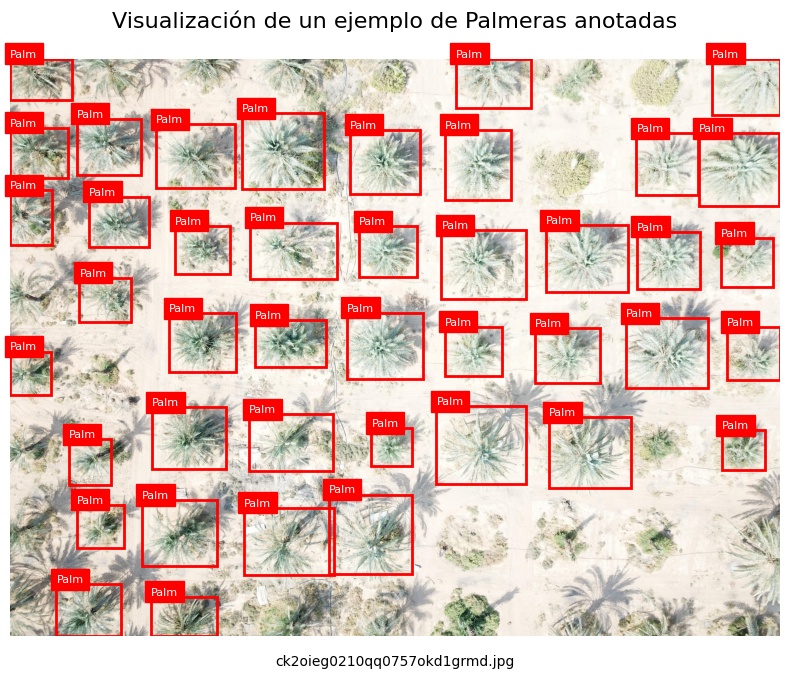

In [31]:
image_path, annotation_path = get_random_image_and_annotation(
    RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA, RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_LABELS
)
config = {
    "linewidth": 2,
    "edgecolor": "r",
    "facecolor": "none",
    "color": "white",
    "fontsize": 8,
    "backgroundcolor": "red",
    "putText": True,
    "show_image_name" : True,
    "name_fontsize" : 10,
    "super_title": "Visualización de un ejemplo de Palmeras anotadas",
    "super_title_fontsize": 16,
    "super_title_y": 0.90,
    "from_dataset_voc" : False,
}
show_single_image(image_path, annotation_path, config)

*Visualizamos también una grilla con varias imágenes y sus detecciones:*

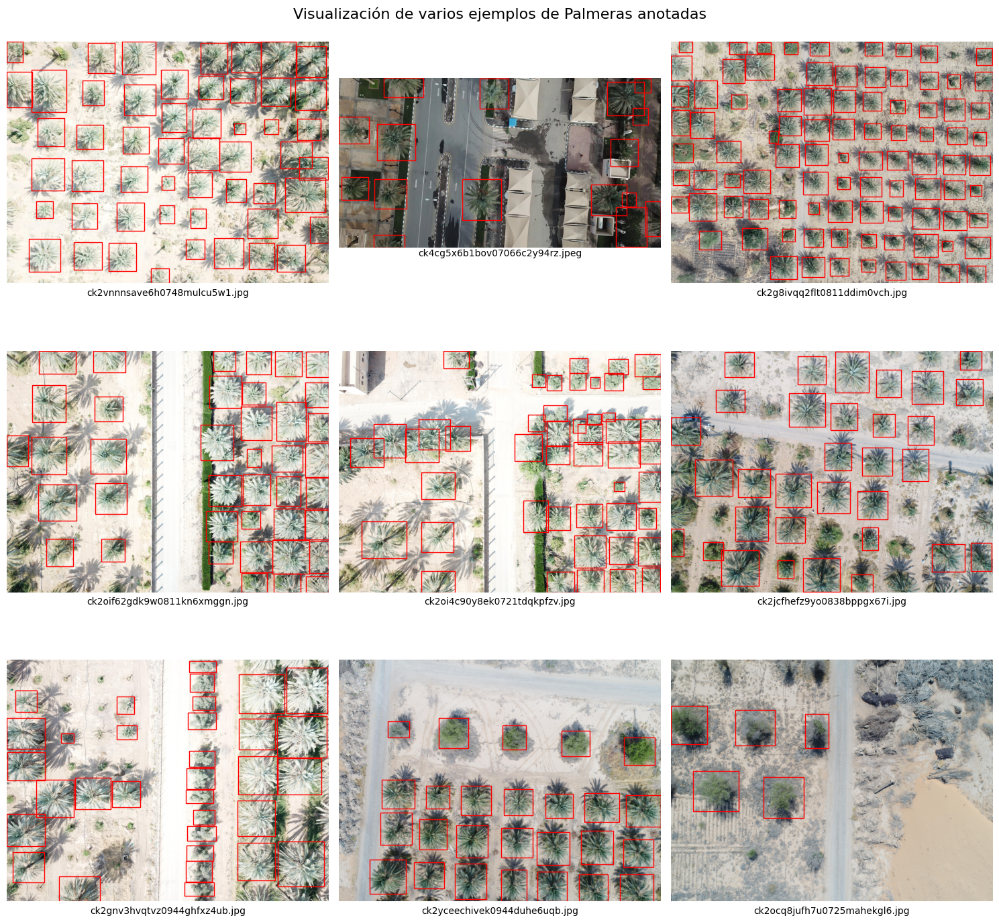

In [15]:
image_paths, annotation_paths = get_image_annotation_paths(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA, RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_LABELS, max_files=9)
config = {
    "linewidth": 1,
    "edgecolor": "r",
    "facecolor": "none",
    "color": "white",
    "fontsize": 6,
    "backgroundcolor": "red",
    "putText": False,
    "show_image_name" : True,
    "name_fontsize" : 10,
    "super_title": "Visualización de varios ejemplos de Palmeras anotadas",
    "super_title_fontsize": 16,
    "super_title_y": 0.95,
    "from_dataset_voc" : False,
}
draw_grid(image_paths, annotation_paths, config)

*También podemos utilizar la librería de FiftyOne (https://docs.voxel51.com/) para una mejor visualización. Otra ventaja de esta librería es que tiene un módulo de exportación a varios formatos conocidos:*

In [16]:
# Cargamos el conjunto.
fiftyone_dataset_train = fo.Dataset.from_dir(
    dataset_type=fo.types.VOCDetectionDataset,
    dataset_dir=RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN,
    name=PALMERAS_KAGGLE_DATASET_VOC + '_train',
    overwrite=True
)

 100% |█████████████████| 279/279 [11.3s elapsed, 0s remaining, 49.3 samples/s]      


*Podemos observar los datos del conjunto:*

In [17]:
print(fiftyone_dataset_train)

Name:        palmeras_kaggle_voc_format_train
Media type:  image
Num samples: 279
Persistent:  False
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


*También se puede lanzar la UI de la aplicacion:*

```python
session = fo.launch_app(fiftyone_dataset)
session.open_tab()
```

<!-- Colab -->
<div align="center"><img src="https://drive.google.com/uc?export=view&id=1QOnT8FDfGk5qhHtE3U1KHzShFCsGpRDi" width="600" alt="Figura 2: UI de FiftyOne para el dataset de las palmeras."></div>

<!-- <div align="center"><img src="./resources/imgs/img2.png" width="600" alt="Figura 2: UI de FiftyOne para el dataset de las palmeras."></div> -->

<div align="center"><small><em>Figura 2: UI de FiftyOne para el dataset de las palmeras.</em></small></div>

<!-- TODO: Balance de clases? Análisis de datos? -->

*La ventaja de utilizar FiftyOne, es que se puede exportar a varios formatos admitidos (https://docs.voxel51.com/user_guide/export_datasets.html | https://docs.voxel51.com/user_guide/export_datasets.html#custom-dataset-exporter). Como ejemplo, para exportar al formato de COCO sería:*

```python
fiftyone_dataset.export(
    export_dir=RUTA_CARPETA_KAGGLE_DATASET_COCO,
    dataset_type=fo.types.COCODetectionDataset,
    label_field="ground_truth",
)
```

## Machine learning model engineering

*Como experimentos, dado que inicialmente el modelo no tiene como objetivo el funcionamiento en tiempo real, se plantea utilizar modelos de detección en dos etapas (ej: Faster R-CNN). Sin embargo, también se tienen en cuenta modelos de una sola etapa (ej: YOLO)*

### Faster R-CNN

🤖 <em><font color='DarkGoldenRod'>Consulta a IA (ChatGPT 4o):</font></em> 🤖

❔ <em><font color='GoldenRod'>Prompt:</font></em>
<em><font color='GoldenRod'><p>

Podrías generar una introducción sobre el modelo Faster R-CNN? Que incluya sus componentes, sus ventajas y desventajas, así como también comparalo con otros modelos del estado del arte.

</p></font></em>

🔃 <em><font color='BurlyWood'>Respuesta:</font></em>
<em><font color='BurlyWood'><p>

Faster R-CNN (Region-based Convolutional Neural Networks) es un modelo de detección de objetos que destaca por su precisión y eficiencia, especialmente en tareas de detección de múltiples clases en imágenes. Es una evolución de los modelos R-CNN (2014) y Fast R-CNN (2015), integrando mejoras que reducen el tiempo de procesamiento mientras mantienen un alto rendimiento. Faster R-CNN se ha vuelto un estándar en aplicaciones de visión por computadora que requieren detección precisa de objetos, como en vehículos autónomos, vigilancia y reconocimiento de objetos a partir de imágenes aéreas o satelitales.

<strong>Componentes de Faster R-CNN</strong>

1. Red Convolucional Base: Faster R-CNN utiliza una red convolucional como base, comúnmente modelos preentrenados como VGG16, ResNet o MobileNet. Estas redes actúan como extractores de características que convierten una imagen de entrada en un mapa de características.

2. Region Proposal Network (RPN): Uno de los principales avances de Faster R-CNN es la RPN. En lugar de generar propuestas de regiones usando métodos externos como Selective Search (usado en R-CNN y Fast R-CNN), la RPN genera las regiones propuestas (candidatas a contener objetos) directamente dentro de la red. La RPN es una pequeña red convolucional que desliza una ventana sobre el mapa de características, prediciendo posibles "anclas" que podrían contener objetos.

3. RoI Pooling (Region of Interest Pooling): Después de generar las regiones propuestas, Faster R-CNN aplica una técnica llamada RoI Pooling para adaptar cada región propuesta a un tamaño fijo, lo que permite alimentar estas regiones a una red totalmente conectada (fully connected) para su clasificación y refinamiento de los bounding boxes.

4. Clasificación y Refinamiento de Bounding Boxes: La última parte del modelo toma cada región propuesta y predice tanto la clase del objeto (o si es fondo) como las coordenadas refinadas del bounding box.

<strong>Ventajas de Faster R-CNN</strong>

1. Precisión: Faster R-CNN es uno de los modelos de detección de objetos más precisos, ya que optimiza tanto la propuesta de regiones como la detección de objetos en un solo paso.

2. Eficiencia: La integración de la Region Proposal Network permite un proceso más eficiente comparado con métodos anteriores, ya que la red aprende a generar propuestas más relevantes sin depender de técnicas externas que incrementan el tiempo de procesamiento.

3. Flexibilidad: Puede adaptarse a diferentes tareas de detección, desde objetos pequeños en imágenes detalladas hasta objetos más grandes en escenas menos densas.

<strong>Desventajas de Faster R-CNN</strong>

1. Velocidad: Aunque es significativamente más rápido que sus predecesores, sigue siendo más lento que modelos como YOLO o SSD, ya que sigue utilizando un enfoque de dos etapas (propuesta de regiones y clasificación).

2. Complejidad Computacional: Requiere mayor poder computacional que modelos más livianos, lo que lo hace menos adecuado para aplicaciones en tiempo real o en dispositivos con restricciones de hardware.

<strong>Comparación con otros Modelos del Estado del Arte</strong>

- YOLO (You Only Look Once): A diferencia de Faster R-CNN, YOLO es un modelo de detección de una sola etapa, lo que significa que realiza la detección de objetos en una sola pasada sobre la imagen. Esto lo hace extremadamente rápido y adecuado para aplicaciones en tiempo real, pero a menudo sacrifica algo de precisión en comparación con Faster R-CNN. YOLO predice directamente las clases y las coordenadas de los objetos desde la imagen completa, lo que es más eficiente pero puede resultar en detecciones menos precisas para objetos pequeños o con formas irregulares.

- SSD (Single Shot Multibox Detector): Al igual que YOLO, SSD es un modelo de detección de una sola etapa que es más rápido que Faster R-CNN. Sin embargo, SSD tiende a tener un rendimiento ligeramente inferior en la detección de objetos pequeños y es menos preciso cuando se compara con Faster R-CNN en tareas que requieren alta precisión.

- RetinaNet: Este modelo combina lo mejor de ambos mundos, con un enfoque de una etapa similar a YOLO y SSD, pero utilizando una pérdida focal que pone mayor peso en las clases raras o difíciles de detectar. Aunque es más rápido que Faster R-CNN, sigue siendo algo más lento que YOLO y SSD.

<strong>Conclusión</strong>

Faster R-CNN es un modelo robusto y preciso que sigue siendo uno de los más utilizados en tareas de detección de objetos donde la precisión es crítica. Aunque existen modelos más rápidos como YOLO y SSD, estos tienden a sacrificar precisión, particularmente en la detección de objetos pequeños. Por otro lado, modelos más recientes como RetinaNet buscan un equilibrio entre precisión y velocidad, pero Faster R-CNN sigue siendo la opción preferida cuando la prioridad es maximizar la exactitud de las detecciones.

</p></font></em>

<!-- Colab -->
<div align="center"><img src="https://drive.google.com/uc?export=view&id=1P4K2MFkvPTQgunVT6-RiKEPd-a5YCPaO" width="600" alt="Figura 3: Arquitectura de Faster R-CNN. Extraída de: https://towardsdatascience.com/faster-r-cnn-for-object-detection-a-technical-summary-474c5b857b46"></div>

<!-- <div align="center"><img src="./resources/imgs/img3.jpg" width="600" alt="Figura 3: Arquitectura de Faster R-CNN. Extraída de: https://towardsdatascience.com/faster-r-cnn-for-object-detection-a-technical-summary-474c5b857b46"></div> -->

<div align="center"><small><em>Figura 3: Arquitectura de Faster R-CNN. Extraída de: https://towardsdatascience.com/faster-r-cnn-for-object-detection-a-technical-summary-474c5b857b46</em></small></div>

#### Preparar el datset

*En el formato actual del conjunto, es necesario generar una clase Dataset Customizada para el entrenamiento. Para eso podemos tomar como ejemplo este tutorial: https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html*

📝 <em><font color='Gray'>Nota:</font></em>
<em><font color='Gray'><p>

Para entrenar la red Faster R-CNN, es necesario que se cumplan algunos requerimientos, entre los cuales se encuentra una definición de la estructura del Dataset como la siguiente:

<cite>
The only specificity that we require is that the dataset __getitem__ should return a tuple:

- image: torchvision.tv_tensors.Image of shape [3, H, W], a pure tensor, or a PIL Image of size (H, W)
- target: a dict containing the following fields
    - `boxes`, torchvision.tv_tensors.BoundingBoxes of shape [N, 4]: the coordinates of the N bounding boxes in [x0, y0, x1, y1] format, ranging from 0 to W and 0 to H
    - `labels`, integer torch.Tensor of shape [N]: the label for each bounding box. 0 represents always the background class.
    - `image_id`, int: an image identifier. It should be unique between all the images in the dataset, and is used during evaluation
    - `area`, float torch.Tensor of shape [N]: the area of the bounding box. This is used during evaluation with the COCO metric, to separate the metric scores between small, medium and large boxes.
    - `iscrowd`, uint8 torch.Tensor of shape [N]: instances with iscrowd=True will be ignored during evaluation.
    - (optionally) `masks`, torchvision.tv_tensors.Mask of shape [N, H, W]: the segmentation masks for each one of the objects

</cite>

También destacar que el modelo considera a la clase 0 como el fondo, lo que implica consideración en las labels

</p></font></em>

*Primero creamos el conjunto personalizado sin las transformaciones:*

📝 <em><font color='Gray'>Nota:</font></em>
<em><font color='Gray'><p>En la creación de este conjunto, hay varias matices, entre las cuales se encuentra el tratamiento de ejemplos que no tienen ninguna detección.</p></font></em>

In [18]:
class PalmTreeDataset(Dataset):
    """Clase que crea el dataset partiendo de las imágenes en las carpetas data y labels"""
    def __init__(self, data_dir, labels_dir):
        self.data_dir = data_dir
        self.labels_dir = labels_dir
        self.imgs = list(sorted(os.listdir(data_dir)))
        self.labels = list(sorted(os.listdir(labels_dir)))

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        # Cargar imagen
        img_path = os.path.join(self.data_dir, self.imgs[idx])
        label_path = os.path.join(self.labels_dir, self.labels[idx])
        img = read_image(img_path)

        # Parsear archivo XML (PascalVOC)
        tree = ET.parse(label_path)
        root = tree.getroot()
        boxes = []
        labels = []
        isCrowd = []
        for obj in root.findall("object"):
            label = obj.find("name").text
            if label in LABELS.keys():
                bbox = obj.find("bndbox")
                xmin = int(bbox.find("xmin").text)
                ymin = int(bbox.find("ymin").text)
                xmax = int(bbox.find("xmax").text)
                ymax = int(bbox.find("ymax").text)

                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(LABELS[label])  # Hay solo una clase: Palmera
                isCrowd.append(0)  # Seteamos como falso.

        # Convertimos a tensores
        # Tratamiento de cuando no hay detecciones.
        if len(boxes) > 0:
            boxes = tv_tensors.BoundingBoxes(
                boxes, format="XYXY", canvas_size=F.get_image_size(img)
            )
            area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        else:
            # No hay ningún objeto detectado.
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            area = torch.tensor([], dtype=torch.float32)

        # Convertir el nombre del archivo a un número basado en los caracteres
        image_id = idx
        isCrowd = torch.as_tensor(isCrowd, dtype=torch.int64)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        img = tv_tensors.Image(img)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = isCrowd
        target["img_path"] = img_path

        return img, target

#### Definir las transformaciones

*Si utilizaramos Albumentations, un posible pipeline de transofrmaciones sería:*

```python
# Utilizando Albumentations
def get_transforms(train=True):
    transforms = []
    if train:
        transforms.append(A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5)) # Ajuste HSV
        transforms.append(A.GaussianBlur(blur_limit=3, sigma_limit=(0.1, 2.0), p=0.5))  # Desenfoque gaussiano
        transforms.append(A.Rotate(limit=10, p=0.5))
        transforms.append(A.HorizontalFlip(p=0.5))
        transforms.append(A.VerticalFlip(p=0.5))
        transforms.append(A.Affine(scale=(0.8, 1.2), translate_percent=(0.1, 0.1), p=0.5))
    transforms.append(A.LongestMaxSize(max_size=IMG_SIZE))
    transforms.append(ToTensorV2())
    return A.Compose(transforms, bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

class TransformedPalmTreeDatasetAlbumentations(Dataset):
    """Clase de más alto rango que aplica las transformaciones al PalmTreeDataset"""
    def __init__(self, dataset, transforms=None):
        self.dataset = dataset
        self.transforms = transforms

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        img, target = self.dataset[idx]
        
        # Convertir la imagen a formato NumPy para que funcione con Albumentations
        img = img.permute(1, 2, 0).numpy()  # Cambiar de CxHxW a HxWxC

        boxes = target['boxes'].tolist()
        labels = target['labels'].tolist()
        
        if self.transforms is not None:
            # Aplicar transformaciones
            transformed = self.transforms(image=img, bboxes=boxes, labels=labels)
            img = transformed['image']
            boxes = transformed['bboxes']
            labels = transformed['labels']

        # Reconstruir los bounding boxes como un tensor
        target['boxes'] = torch.tensor(boxes, dtype=torch.float32)
        target['labels'] = torch.tensor(labels, dtype=torch.int64)
        
        return img, target
```

*Sin embargo, las transformaciones, si bien mejoran los resultados, como mostrado en el clásico paper de Google, también aumentan el procesamiento. En este punto, se definen estas simples transofrmaciones:*

In [19]:
def get_transforms(train):
    transforms = []
    if train:
        transforms.append(T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1))
        transforms.append(T.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)))
    transforms.append(T.Resize(size=IMG_SIZE))
    transforms.append(T.ToDtype(torch.float, scale=True))
    transforms.append(T.ToPureTensor())
    return T.Compose(transforms)

*Creamos un conjunto de más alto rango que aplique las transformaciones. Estas transformaciones se aplican de este modo para separar con anterioridad al conjunto de train/test.*

In [20]:
class TransformedPalmTreeDataset(Dataset):
    """Clase de más alto rango que aplica las transofrmaciones al PalmsDataset"""
    def __init__(self, dataset, transforms=None):
        self.dataset = dataset
        self.transforms = transforms

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        img, target = self.dataset[idx]
        if self.transforms is not None:
            img, target = self.transforms(img, target)
        return img, target

*Creamos los datasets:*

📝 <em><font color='Gray'>Nota:</font></em>
<em><font color='Gray'><p>En este punto se podría dividir el conjuto en train/test/validation de la siguiente forma:</p></font></em>

```python
# Creamos el dataset
full_dataset = PalmTreeDataset(RUTA_CARPETA_KAGGLE_DATASET_VOC_DATA, RUTA_CARPETA_KAGGLE_DATASET_VOC_LABELS)

# Lo dividimos en train/test
train_dataset, test_dataset = torch.utils.data.random_split(full_dataset, TRAIN_TEST_SPLIT_RATIO, torch.Generator().manual_seed(RANDOM_SEED))
```

<em><font color='Gray'><p>Sin embargo, las imágnes ya están divididas, y para manetener la coherencia entre los modelos, se mantiene esta estrategia.</p></font></em>

In [21]:
train_dataset_raw = PalmTreeDataset(RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_DATA, RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_LABELS)
test_dataset_raw = PalmTreeDataset(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA, RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_LABELS)

# Aplicamos las transformaciones.
train_dataset = TransformedPalmTreeDataset(train_dataset_raw, transforms=get_transforms(True))
test_dataset = TransformedPalmTreeDataset(test_dataset_raw, transforms=get_transforms(False))

*Visualizamos las transformaciones para una imagen:*

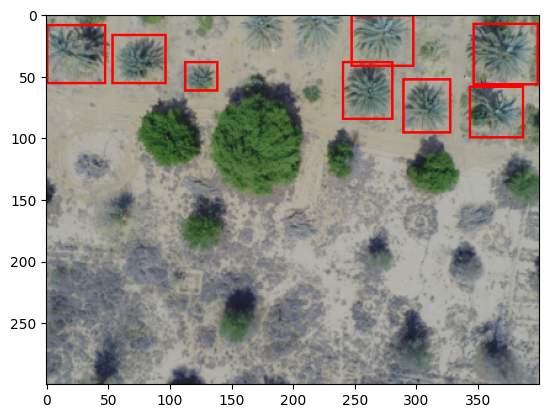

In [22]:
random_idx = torch.randint(0, len(train_dataset), (1,)).item()
image, target = train_dataset[random_idx]

output_image = draw_bounding_boxes(image, target['boxes'], colors='red', width=2)

plt.figure()
plt.imshow(output_image.permute(1, 2, 0))

*O para una grilla de imágenes:*

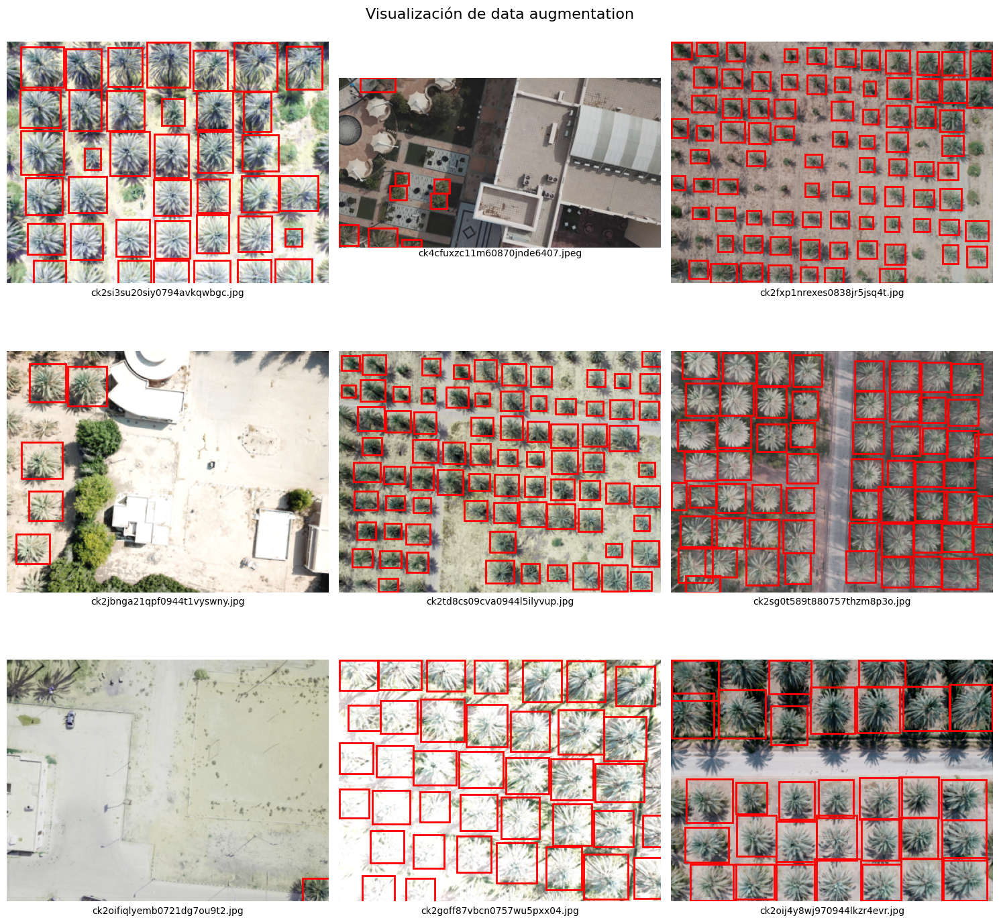

In [23]:
config = {
    "linewidth": 2,
    "edgecolor": "r",
    "facecolor": "none",
    "color": "white",
    "fontsize": 6,
    "backgroundcolor": "red",
    "putText": False,
    "show_image_name": True,
    "name_fontsize": 10,
    "super_title": "Visualización de data augmentation",
    "super_title_fontsize": 16,
    "super_title_y": 0.95,
    "from_dataset_voc": True,
}

# Generar 9 índices aleatorios del dataset
random_indices = random.sample(range(len(train_dataset)), 9)

draw_grid(
    [train_dataset[i][0] for i in random_indices],
    [train_dataset[i][1] for i in random_indices],
    config,
)

#### Definición del modelo

*Utilizaremos el modelo pre-entrando en el dataset de COCO (https://pytorch.org/vision/stable/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn_v2.html#torchvision.models.detection.fasterrcnn_resnet50_fpn_v2). Primero, observamos como está compuesto el modelo para cambiar las capas correspondientes para nuestro caso:*

In [24]:
preview_model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(weights=None)
print(preview_model)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

*Como haermos fine-tuning de este modelo, lo único que debemos cambiar es las últmas capas:*

```python
(box_predictor): FastRCNNPredictor(
      (cls_score): Linear(in_features=1024, out_features=91, bias=True)
      (bbox_pred): Linear(in_features=1024, out_features=364, bias=True)
    )
```

*Definimos una función especial para esto, en donde se le pasa el número de clases que debe predecir. También permite obtener el modelo desde el útimo checkpoint de entrenamiento:*

In [25]:
def get_fasterrcnn_resnet50_fpn_v2_model(num_classes: int, checkpoint_path: str = None, device: str = 'cpu') -> torch.nn.Module:
    # Cargar un modelo preentrenado de Faster R-CNN (los pesos de coco)
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(weights='DEFAULT')
    
    # Obtener el número de entradas de la capa de clasificación
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    
    # Reemplazar la cabeza del clasificador por una que tenga el número de clases deseado
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes + 1)

    # Optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

    # Aprender tasa de aprendizaje (LR) programada
    lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

    # Cargar los pesos del modelo desde un checkpoint si fue especificado.
    model.to(device)
    data = {}
    if checkpoint_path and os.path.exists(checkpoint_path):
        print(f"Cargando el modelo desde el checkpoint: {checkpoint_path}")
        
        # Cargar los parámetros del checkpoint
        checkpoint = torch.load(checkpoint_path, map_location=device)

        # Restaurar el estado del modelo
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        lr_scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        data = checkpoint['data']
        print(f"\nModelo cargado desde el checkpoint en la época {data['epoch']}.\n")
    else:
        print("\nCargando el modelo desde 0.\n")
        
    return model, optimizer, lr_scheduler, data

*Finalmente, instanciamos el modelo y vemos si efectivamente se cambiaron las últimas capas:*

In [34]:
# Instanciamos el modelo.
save_checkpoint_path = os.path.join(RUTA_CARPETA_MODELS, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID + '_checkpoint.tar')
if LOAD_MODEL_FROM_CHECKPOINT and os.path.exists(save_checkpoint_path):
    model, optimizer, lr_scheduler, checkpoint_data = get_fasterrcnn_resnet50_fpn_v2_model(len(LABELS.keys()), save_checkpoint_path, DEVICE)
else:
    model, optimizer, lr_scheduler, checkpoint_data = get_fasterrcnn_resnet50_fpn_v2_model(len(LABELS.keys()), None, DEVICE)
print(model)

Cargando el modelo desde el checkpoint: ./resources\models\fasterrcnn_resnet50_fpn_v2\fasterrcnn_resnet50_fpn_v2_checkpoint.tar

Modelo cargado desde el checkpoint en la época 6.

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Co

*Podemos observar un resumen del mismo mediante `torchinfo`:*

In [27]:
img, _ = test_dataset[0]
input_size = (1, *img.shape)
summary(model, input_size=input_size)

Layer (type:depth-idx)                             Output Shape              Param #
FasterRCNN                                         [100, 4]                  --
├─GeneralizedRCNNTransform: 1-1                    [1, 3, 800, 1088]         --
├─BackboneWithFPN: 1-2                             [1, 256, 13, 17]          --
│    └─IntermediateLayerGetter: 2-1                [1, 2048, 25, 34]         --
│    │    └─Conv2d: 3-1                            [1, 64, 400, 544]         (9,408)
│    │    └─BatchNorm2d: 3-2                       [1, 64, 400, 544]         (128)
│    │    └─ReLU: 3-3                              [1, 64, 400, 544]         --
│    │    └─MaxPool2d: 3-4                         [1, 64, 200, 272]         --
│    │    └─Sequential: 3-5                        [1, 256, 200, 272]        (215,808)
│    │    └─Sequential: 3-6                        [1, 512, 100, 136]        1,219,584
│    │    └─Sequential: 3-7                        [1, 1024, 50, 68]         7,098,368
│    │

In [28]:
# Limpiamos el chache.
clean_gpu_usage()

Initial GPU Usage
| ID | GPU | MEM |
------------------
|  0 | 22% | 10% |
GPU Usage after emptying the cache
| ID | GPU | MEM |
------------------
|  0 | 10% |  3% |


*Para comprobar el funcionamiento del modelo, podemos realizar un test de la inferencia y el entrenamiento:*

In [29]:
data_loader = DataLoader(
    train_dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x))
)

model.to(DEVICE)
# Training
images, targets = next(iter(data_loader))
# Es necesario para que no compute los gradientes, sino queda "basura" en la GPU.
with torch.no_grad():
    images = list(image.to(DEVICE) for image in images)
    targets = [
        {k: (v.to(DEVICE) if isinstance(v, torch.Tensor) else v) for k, v in t.items()}
        for t in targets
    ]
    output = model(images, targets)  # Devuelve losses y detections
    print(f"Training test: {output}")

# Inferencia
model.eval()
with torch.no_grad():
    x = [torch.rand(3, 300, 400).to(DEVICE), torch.rand(3, 500, 400).to(DEVICE)]
    predictions = model(x)  # Returns predictions
    print(f"Inference test: {predictions}")

Training test: {'loss_classifier': tensor(0.6804, device='cuda:0'), 'loss_box_reg': tensor(0.6662, device='cuda:0'), 'loss_objectness': tensor(2.6651, device='cuda:0'), 'loss_rpn_box_reg': tensor(0.1652, device='cuda:0')}
Inference test: [{'boxes': tensor([[1.1838e+00, 6.9196e+01, 2.3142e+01, 9.1906e+01],
        [2.0914e+00, 1.9127e+00, 2.3696e+01, 2.3896e+01],
        [1.1071e+00, 5.9000e+00, 2.9532e+01, 1.1002e+02],
        [7.8116e-01, 3.8419e+01, 4.8221e+00, 2.1711e+02],
        [2.0872e+00, 2.1879e+02, 1.7378e+01, 2.8514e+02],
        [3.9836e-01, 1.3803e+01, 6.1088e+00, 1.0794e+02],
        [4.2202e+00, 2.0602e+01, 7.8354e+01, 2.2338e+02],
        [5.0875e-01, 9.7071e+01, 3.7838e+00, 3.0000e+02],
        [3.3040e-01, 1.6243e+00, 2.4543e+00, 7.9984e+00],
        [2.8347e+00, 2.3997e+02, 2.1734e+01, 2.9073e+02],
        [1.0745e+01, 9.0602e+00, 1.0062e+02, 9.7987e+01],
        [2.0819e+00, 2.2835e+01, 1.7662e+01, 9.3627e+01],
        [1.3934e+00, 1.2516e+01, 4.2324e+01, 2.0761e+02

In [30]:
# Limpiamos el chache.
clean_gpu_usage()

Initial GPU Usage
| ID | GPU | MEM |
------------------
|  0 | 93% | 25% |
GPU Usage after emptying the cache
| ID | GPU | MEM |
------------------
|  0 | 36% |  3% |


#### Entrenar el modelo

*Clase que se utiliza para detener el entrenamiento si no mejora la métrica (pérdida en evaluación) durante N épocas.*

In [31]:
class EarlyStopper:
    def __init__(self, patience: int = 1, min_delta: float = 0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float("inf")
    
    def early_stop(self, validation_loss: float) -> bool:
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss >= (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

*Wrapper sobre `tran_one_epoch` (permite realizar el entrenamiento en una época) de las utilidades de entrenamiento de pytorch/resources/vision/detection:*

In [32]:
def coco_train(
    model: nn.Module,
    data_loader: DataLoader,
    device: str,
    optimizer: optim.Optimizer,    
    epoch: int = None,    
    criterion: nn.Module = None,
    verbose: bool = True,
) -> tuple[float, float]:

    model.to(device)
    train_loss = 0.0
    train_acc = 0.0

    metric_logger: MetricLogger = train_one_epoch(
        model, optimizer, data_loader, DEVICE, epoch, print_freq=10
    )
    train_loss = metric_logger.meters["loss"].global_avg  # Obtener la pérdida promedio
    return train_loss, train_acc

*Wrapper sobre `evaluate` (permite evaluar utilizando el formato de COCO -se dividen entre los tamaños de los objetos-) de las utilidades de entrenamiento de pytorch/resources/vision/detection:*

In [33]:
def coco_evaluate(
    model: nn.Module,
    data_loader: DataLoader,
    device: str,
    optimizer: optim.Optimizer = None,
    epoch: int = None,
    criterion: nn.Module = None,
    verbose: bool = True,    
) -> tuple[float, float]:
    
    model.to(device)
    test_loss = 0.0
    test_acc = 0.0
   
    coco_evaluator: CocoEvaluator = evaluate(model, data_loader, device)
    test_loss = coco_evaluator.coco_eval["bbox"].stats[0]
    test_acc = coco_evaluator.coco_eval["bbox"].stats[1]
    return test_loss, test_acc

*Función que permite realizar el entrenamiento utilizando las funcionalidades de COCO. Utiliza `EarlyStopping` y también continúa el entrenamiento desde el útlimo checkpoint:*

In [34]:
def fit(
    model: nn.Module,
    train_dataloader: DataLoader,
    test_dataloader: DataLoader,
    optimizer: optim.Optimizer,
    criterion: nn.Module,
    scheduler: optim.Optimizer = None,
    early_stopping: EarlyStopper = None,
    epochs: int = EPOCHS,
    verbose: bool = True,
    device: str = DEVICE,
    start_from_checkpoint_data: Dict = None,
    base_dir: str = None,
    model_id: str = None,
    save_checkpoint: bool = False,
    save_best_model: bool = False,
    save_results: bool = False
) -> Tuple[List[float], List[float], List[float], List[float]]:
    # Chequeos iniciales
    if (save_best_model or save_checkpoint or save_results) and not (base_dir and model_id):
        raise ValueError("base_dir y model_id no pueden ser vacíos si save_best_model o save_checkpoint son verdaderos.")
    
    if start_from_checkpoint_data:
        starting_epoch = start_from_checkpoint_data['epoch'] + 1
        if starting_epoch > epochs:
            raise IndexError(f"Mal inicio desde checkpoint: starting_epoch > epochs")
        print(f"Traning from checkpoint at epoch {starting_epoch}\n")
    else:
        starting_epoch = 1
        print("Training... \n")

    train_losses = [] if not start_from_checkpoint_data else start_from_checkpoint_data['train_losses']
    test_losses = [] if not start_from_checkpoint_data else start_from_checkpoint_data['test_losses']
    train_accs = [] if not start_from_checkpoint_data else start_from_checkpoint_data['train_accs']
    test_accs = [] if not start_from_checkpoint_data else start_from_checkpoint_data['test_accs']
    best_test_acc = -float('inf') if not start_from_checkpoint_data else start_from_checkpoint_data['"best_test_acc"']

    best_test_acc = -float('inf')

    pbar = trange(starting_epoch, epochs + 1, desc="Epoch", unit="epoch", colour="green")
    for epoch in pbar:
        train_loss, train_acc = coco_train(
            model=model,
            data_loader=train_dataloader,
            optimizer=optimizer,
            device=device,
            epoch=epoch,
            criterion=None,
            verbose=verbose
        )
        test_loss, test_acc = coco_evaluate(model=model,
                                     data_loader=test_dataloader,
                                     device=device,
                                     verbose=verbose)

        if scheduler: scheduler.step()

        train_losses.append(train_loss)
        test_losses.append(test_loss)
        train_accs.append(train_acc)
        test_accs.append(test_acc)

        pbar.set_postfix({
            "Train Loss": format(train_loss, ".3f"),
            "Test Loss": format(test_loss, ".3f"),
            "Train Accuracy": format(train_acc, ".3f"),
            "Test Accuracy": format(test_acc, ".3f"),
        })

        # Checkpoint
        if save_checkpoint:
            file_name_path = os.path.join(base_dir, model_id + '_checkpoint.tar')
            os.makedirs(base_dir, exist_ok=True)
            torch.save(
                {
                    "model_state_dict": model.state_dict(),
                    "optimizer_state_dict": optimizer.state_dict(),
                    "scheduler_state_dict": scheduler.state_dict(),
                    "data": {
                        "epoch": epoch,
                        "train_losses": train_losses,
                        "test_losses": test_losses,
                        "train_accs": train_accs,
                        "test_accs": test_accs,
                        "best_test_acc": best_test_acc
                    },
                },
                file_name_path,
            )

        # Save best model
        if save_best_model and test_acc > best_test_acc:
            best_test_acc = test_acc
            file_name_path = os.path.join(base_dir, model_id + '_best_model.pt')
            os.makedirs(base_dir, exist_ok=True)
            torch.save(model.state_dict(), file_name_path)
            if verbose:
                print(f"Best model saved at epoch {epoch}!")

        # Early stopping
        if early_stopping and early_stopping.early_stop(test_loss):
            print("\nEarly stopping activated.\n")
            break
    
    # Save results in JSON
    if save_results:
        results = {
            "train_losses": train_losses,
            "test_losses": test_losses,
            "train_accs": train_accs,
            "test_accs": test_accs,
            "best_test_acc": best_test_acc
        }
        results_file_path = os.path.join(base_dir, model_id + '_results.json')
        with open(results_file_path, 'w') as json_file:
            json.dump(results, json_file, indent=4)
        if verbose:
            print(f"Results saved to {results_file_path}!")

    print("\n \nFinished Training")
    return train_losses, test_losses, train_accs, test_accs

*Una vez que tenemos todo configurado, realizamos el entrenamiento:*

In [35]:
EPOCHS = 20
BATCH_SIZE = 4

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

train_losses, test_losses, train_accs, test_accs = fit(
    model=model,
    train_dataloader=train_dataloader,
    test_dataloader=test_dataloader,
    optimizer=optimizer,
    criterion=None,
    scheduler=lr_scheduler,
    early_stopping=EarlyStopper(5, 0),
    epochs=EPOCHS,
    verbose=False,
    device=DEVICE,
    start_from_checkpoint_data=checkpoint_data,
    base_dir=os.path.join(
        RUTA_CARPETA_MODELS,
        FASTERRCNN_RESNET50_FPN_V2_MODEL_ID),
    model_id=FASTERRCNN_RESNET50_FPN_V2_MODEL_ID,
    save_checkpoint=LOAD_MODEL_FROM_CHECKPOINT,
    save_best_model = True,
    save_results = True
)

Training... 



Epoch:   0%|          | 0/20 [00:00<?, ?epoch/s]/kaggle/working/resources/utils/engine.py:30: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Epoch: [1]  [ 0/70]  eta: 0:17:38  lr: 0.005000  loss: 3.2332 (3.2332)  loss_classifier: 0.6616 (0.6616)  loss_box_reg: 0.5221 (0.5221)  loss_objectness: 1.9527 (1.9527)  loss_rpn_box_reg: 0.0968 (0.0968)  time: 15.1189  data: 14.0877  max mem: 7857
Epoch: [1]  [10/70]  eta: 0:15:42  lr: 0.005000  loss: 1.4919 (1.7196)  loss_classifier: 0.4717 (0.4635)  loss_box_reg: 0.5568 (0.5668)  loss_objectness: 0.4557 (0.6076)  loss_rpn_box_reg: 0.0749 (0.0816)  time: 15.7142  data: 14.9562  max mem: 8029
Epoch: [1]  [20/70]  eta: 0:13:08  lr: 0.005000  loss: 1.2126 (1.3953)  loss_classifier: 0.3121 (0.3739)  loss_box_reg: 0.5044 (0.5462)  loss_objectness: 0.2501 (0.4009)  loss_rpn_box_reg: 0.0551 (0.0743)  time: 15.8020  data: 15.0573  max mem: 8029
Epoch: [1]  [30/70]  eta: 0:10:16  lr: 0.005000  loss: 0.8895 (1.1661)  loss_classifier: 0.2166 (0.3068)  loss_box_reg: 0.4733 (0.4921)  loss_objectness: 0.1004 (0.3014)  loss_rpn_box_reg: 0.0462 (0.0657)  time: 15.2296  data: 14.4679  max mem: 8029


Epoch:   0%|          | 0/20 [18:56<?, ?epoch/s, Train Loss=0.841, Test Loss=0.519, Train Accuracy=0.000, Test Accuracy=0.939]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3760 (0.3726)  evaluator_time: 0.2231 (0.2840)  time: 1.7438  data: 1.0852  max mem: 8029
Test: Total time: 0:00:31 (1.7439 s / it)
Averaged stats: model_time: 0.3760 (0.3726)  evaluator_time: 0.2231 (0.2840)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.519
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.939
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.525
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.603
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.018
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.174
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:   5%|▌         | 1/20 [18:57<6:00:09, 1137.34s/epoch, Train Loss=0.841, Test Loss=0.519, Train Accuracy=0.000, Test Accuracy=0.939]

Epoch: [2]  [ 0/70]  eta: 0:14:26  lr: 0.005000  loss: 0.3349 (0.3349)  loss_classifier: 0.1098 (0.1098)  loss_box_reg: 0.1718 (0.1718)  loss_objectness: 0.0387 (0.0387)  loss_rpn_box_reg: 0.0146 (0.0146)  time: 12.3805  data: 11.5911  max mem: 8029
Epoch: [2]  [10/70]  eta: 0:16:21  lr: 0.005000  loss: 0.5340 (0.5607)  loss_classifier: 0.1341 (0.1472)  loss_box_reg: 0.3160 (0.3241)  loss_objectness: 0.0387 (0.0441)  loss_rpn_box_reg: 0.0451 (0.0454)  time: 16.3650  data: 15.6016  max mem: 8029
Epoch: [2]  [20/70]  eta: 0:12:46  lr: 0.005000  loss: 0.5230 (0.5194)  loss_classifier: 0.1341 (0.1370)  loss_box_reg: 0.3067 (0.2958)  loss_objectness: 0.0385 (0.0447)  loss_rpn_box_reg: 0.0392 (0.0419)  time: 15.4750  data: 14.7076  max mem: 8029
Epoch: [2]  [30/70]  eta: 0:10:21  lr: 0.005000  loss: 0.4946 (0.5198)  loss_classifier: 0.1371 (0.1345)  loss_box_reg: 0.2767 (0.3028)  loss_objectness: 0.0366 (0.0417)  loss_rpn_box_reg: 0.0342 (0.0408)  time: 15.0846  data: 14.3130  max mem: 8029


Epoch:   5%|▌         | 1/20 [37:41<6:00:09, 1137.34s/epoch, Train Loss=0.500, Test Loss=0.573, Train Accuracy=0.000, Test Accuracy=0.948]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3776 (0.3743)  evaluator_time: 0.2167 (0.2716)  time: 1.7857  data: 1.1378  max mem: 8030
Test: Total time: 0:00:32 (1.7858 s / it)
Averaged stats: model_time: 0.3776 (0.3743)  evaluator_time: 0.2167 (0.2716)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.948
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.643
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.644
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.190
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  10%|█         | 2/20 [37:42<5:39:01, 1130.11s/epoch, Train Loss=0.500, Test Loss=0.573, Train Accuracy=0.000, Test Accuracy=0.948]

Epoch: [3]  [ 0/70]  eta: 0:15:51  lr: 0.005000  loss: 0.4577 (0.4577)  loss_classifier: 0.1326 (0.1326)  loss_box_reg: 0.2820 (0.2820)  loss_objectness: 0.0178 (0.0178)  loss_rpn_box_reg: 0.0252 (0.0252)  time: 13.5945  data: 12.7850  max mem: 8030
Epoch: [3]  [10/70]  eta: 0:14:57  lr: 0.005000  loss: 0.4520 (0.4416)  loss_classifier: 0.1279 (0.1168)  loss_box_reg: 0.2820 (0.2662)  loss_objectness: 0.0209 (0.0254)  loss_rpn_box_reg: 0.0286 (0.0332)  time: 14.9520  data: 14.1719  max mem: 8030
Epoch: [3]  [20/70]  eta: 0:12:46  lr: 0.005000  loss: 0.4364 (0.4374)  loss_classifier: 0.1161 (0.1133)  loss_box_reg: 0.2754 (0.2663)  loss_objectness: 0.0209 (0.0237)  loss_rpn_box_reg: 0.0318 (0.0342)  time: 15.4133  data: 14.6347  max mem: 8030
Epoch: [3]  [30/70]  eta: 0:10:18  lr: 0.005000  loss: 0.4135 (0.4133)  loss_classifier: 0.1025 (0.1075)  loss_box_reg: 0.2627 (0.2530)  loss_objectness: 0.0188 (0.0209)  loss_rpn_box_reg: 0.0290 (0.0319)  time: 15.7276  data: 14.9473  max mem: 8030


Epoch:  15%|█▌        | 3/20 [1:15:09<5:21:39, 1135.27s/epoch, Train Loss=0.382, Test Loss=0.581, Train Accuracy=0.000, Test Accuracy=0.958]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3758 (0.3724)  evaluator_time: 0.2049 (0.2651)  time: 1.7110  data: 1.0716  max mem: 8030
Test: Total time: 0:00:30 (1.7111 s / it)
Averaged stats: model_time: 0.3758 (0.3724)  evaluator_time: 0.2049 (0.2651)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.958
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.657
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.650
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.191
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  20%|██        | 4/20 [1:15:10<4:59:44, 1124.02s/epoch, Train Loss=0.382, Test Loss=0.581, Train Accuracy=0.000, Test Accuracy=0.958]

Epoch: [5]  [ 0/70]  eta: 0:21:06  lr: 0.000500  loss: 0.3157 (0.3157)  loss_classifier: 0.0554 (0.0554)  loss_box_reg: 0.2132 (0.2132)  loss_objectness: 0.0195 (0.0195)  loss_rpn_box_reg: 0.0276 (0.0276)  time: 18.0962  data: 17.4030  max mem: 8030
Epoch: [5]  [10/70]  eta: 0:15:39  lr: 0.000500  loss: 0.3820 (0.3963)  loss_classifier: 0.0997 (0.1030)  loss_box_reg: 0.2300 (0.2440)  loss_objectness: 0.0156 (0.0168)  loss_rpn_box_reg: 0.0295 (0.0325)  time: 15.6614  data: 14.9033  max mem: 8030
Epoch: [5]  [20/70]  eta: 0:12:58  lr: 0.000500  loss: 0.3562 (0.3868)  loss_classifier: 0.0962 (0.0996)  loss_box_reg: 0.2300 (0.2395)  loss_objectness: 0.0113 (0.0154)  loss_rpn_box_reg: 0.0249 (0.0323)  time: 15.4366  data: 14.6783  max mem: 8030
Epoch: [5]  [30/70]  eta: 0:10:21  lr: 0.000500  loss: 0.3514 (0.3844)  loss_classifier: 0.0855 (0.0967)  loss_box_reg: 0.2314 (0.2411)  loss_objectness: 0.0139 (0.0158)  loss_rpn_box_reg: 0.0253 (0.0308)  time: 15.4527  data: 14.6870  max mem: 8030


Epoch:  20%|██        | 4/20 [1:33:39<4:59:44, 1124.02s/epoch, Train Loss=0.369, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.958]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3762 (0.3722)  evaluator_time: 0.1945 (0.2562)  time: 1.6719  data: 1.0416  max mem: 8030
Test: Total time: 0:00:30 (1.6720 s / it)
Averaged stats: model_time: 0.3762 (0.3722)  evaluator_time: 0.1945 (0.2562)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.586
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.958
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.661
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.652
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  25%|██▌       | 5/20 [1:33:40<4:39:42, 1118.85s/epoch, Train Loss=0.369, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.958]

Epoch: [6]  [ 0/70]  eta: 0:23:32  lr: 0.000500  loss: 0.3549 (0.3549)  loss_classifier: 0.0845 (0.0845)  loss_box_reg: 0.2291 (0.2291)  loss_objectness: 0.0199 (0.0199)  loss_rpn_box_reg: 0.0215 (0.0215)  time: 20.1744  data: 19.4753  max mem: 8030
Epoch: [6]  [10/70]  eta: 0:16:23  lr: 0.000500  loss: 0.3399 (0.3449)  loss_classifier: 0.0810 (0.0861)  loss_box_reg: 0.2192 (0.2220)  loss_objectness: 0.0106 (0.0131)  loss_rpn_box_reg: 0.0224 (0.0236)  time: 16.3859  data: 15.6274  max mem: 8030
Epoch: [6]  [20/70]  eta: 0:13:12  lr: 0.000500  loss: 0.3399 (0.3515)  loss_classifier: 0.0911 (0.0917)  loss_box_reg: 0.2156 (0.2206)  loss_objectness: 0.0110 (0.0140)  loss_rpn_box_reg: 0.0224 (0.0251)  time: 15.6400  data: 14.8629  max mem: 8030
Epoch: [6]  [30/70]  eta: 0:10:22  lr: 0.000500  loss: 0.3397 (0.3389)  loss_classifier: 0.0909 (0.0900)  loss_box_reg: 0.1985 (0.2120)  loss_objectness: 0.0128 (0.0132)  loss_rpn_box_reg: 0.0186 (0.0238)  time: 15.1102  data: 14.3225  max mem: 8030


Epoch:  25%|██▌       | 5/20 [1:52:38<4:39:42, 1118.85s/epoch, Train Loss=0.366, Test Loss=0.585, Train Accuracy=0.000, Test Accuracy=0.950]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3762 (0.3683)  evaluator_time: 0.1948 (0.2594)  time: 1.7508  data: 1.1212  max mem: 8030
Test: Total time: 0:00:31 (1.7509 s / it)
Averaged stats: model_time: 0.3762 (0.3683)  evaluator_time: 0.1948 (0.2594)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.585
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.950
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.663
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.652
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.191
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  25%|██▌       | 5/20 [1:52:39<5:37:57, 1351.84s/epoch, Train Loss=0.366, Test Loss=0.585, Train Accuracy=0.000, Test Accuracy=0.950]


Early stopping activated.


 
Finished Training


##### Entrenamiento sin data-augmentation

*En este punto, se realiza una prueba sin realizar data-augmentation:*

In [39]:
def get_transforms(train):
    transforms = []
    if train:
        pass
    transforms.append(T.Resize(size=IMG_SIZE))
    transforms.append(T.ToDtype(torch.float, scale=True))
    transforms.append(T.ToPureTensor())
    return T.Compose(transforms)

# Aplicamos las transformaciones.
train_dataset = TransformedPalmTreeDataset(train_dataset_raw, transforms=get_transforms(train=True))
test_dataset = TransformedPalmTreeDataset(test_dataset_raw, transforms=get_transforms(train=False))

save_checkpoint_path = os.path.join(RUTA_CARPETA_MODELS, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID_SIN_AUG, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID_SIN_AUG + '_checkpoint.tar')
if LOAD_MODEL_FROM_CHECKPOINT and os.path.exists(save_checkpoint_path):
    model, optimizer, lr_scheduler, checkpoint_data = get_fasterrcnn_resnet50_fpn_v2_model(len(LABELS.keys()), save_checkpoint_path, DEVICE)
else:
    model, optimizer, lr_scheduler, checkpoint_data = get_fasterrcnn_resnet50_fpn_v2_model(len(LABELS.keys()), None, DEVICE)
    
EPOCHS = 20
BATCH_SIZE = 4

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

train_losses, test_losses, train_accs, test_accs = fit(
    model=model,
    train_dataloader=train_dataloader,
    test_dataloader=test_dataloader,
    optimizer=optimizer,
    criterion=None,
    scheduler=lr_scheduler,
    early_stopping=EarlyStopper(10, 0),
    epochs=EPOCHS,
    verbose=False,
    device=DEVICE,
    start_from_checkpoint_data=checkpoint_data,
    base_dir=os.path.join(
        RUTA_CARPETA_MODELS,
        FASTERRCNN_RESNET50_FPN_V2_MODEL_ID_SIN_AUG),
    model_id=FASTERRCNN_RESNET50_FPN_V2_MODEL_ID_SIN_AUG,
    save_checkpoint=LOAD_MODEL_FROM_CHECKPOINT,
    save_best_model = True,
    save_results = True
)

Cargando el modelo desde el checkpoint: ./resources/models/fasterrcnn_resnet50_fpn_v2_sin_aug/fasterrcnn_resnet50_fpn_v2_sin_aug_checkpoint.tar

Modelo cargado desde el checkpoint en la época 7.

Traning from checkpoint at epoch 8



Epoch:   0%|          | 0/13 [00:00<?, ?epoch/s]

Epoch: [8]  [ 0/70]  eta: 0:01:40  lr: 0.000050  loss: 0.2994 (0.2994)  loss_classifier: 0.0674 (0.0674)  loss_box_reg: 0.2092 (0.2092)  loss_objectness: 0.0031 (0.0031)  loss_rpn_box_reg: 0.0197 (0.0197)  time: 1.4408  data: 0.6269  max mem: 8870
Epoch: [8]  [10/70]  eta: 0:01:31  lr: 0.000050  loss: 0.3304 (0.3396)  loss_classifier: 0.0790 (0.0794)  loss_box_reg: 0.2266 (0.2224)  loss_objectness: 0.0100 (0.0127)  loss_rpn_box_reg: 0.0224 (0.0251)  time: 1.5230  data: 0.7672  max mem: 8870
Epoch: [8]  [20/70]  eta: 0:01:15  lr: 0.000050  loss: 0.3369 (0.3423)  loss_classifier: 0.0872 (0.0845)  loss_box_reg: 0.2266 (0.2206)  loss_objectness: 0.0079 (0.0113)  loss_rpn_box_reg: 0.0231 (0.0259)  time: 1.5228  data: 0.7672  max mem: 8870
Epoch: [8]  [30/70]  eta: 0:01:00  lr: 0.000050  loss: 0.3567 (0.3502)  loss_classifier: 0.0937 (0.0891)  loss_box_reg: 0.2295 (0.2231)  loss_objectness: 0.0084 (0.0116)  loss_rpn_box_reg: 0.0262 (0.0264)  time: 1.4925  data: 0.7328  max mem: 8870
Epoch: [

Epoch:   0%|          | 0/13 [02:35<?, ?epoch/s, Train Loss=0.347, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.958]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3763 (0.3740)  evaluator_time: 0.1961 (0.2544)  time: 1.6986  data: 1.0682  max mem: 8870
Test: Total time: 0:00:30 (1.6987 s / it)
Averaged stats: model_time: 0.3763 (0.3740)  evaluator_time: 0.1961 (0.2544)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.588
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.958
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.671
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.193
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:   8%|▊         | 1/13 [02:36<31:15, 156.26s/epoch, Train Loss=0.347, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.958]

Epoch: [9]  [ 0/70]  eta: 0:01:38  lr: 0.000050  loss: 0.2587 (0.2587)  loss_classifier: 0.0728 (0.0728)  loss_box_reg: 0.1634 (0.1634)  loss_objectness: 0.0135 (0.0135)  loss_rpn_box_reg: 0.0090 (0.0090)  time: 1.4105  data: 0.6225  max mem: 8870
Epoch: [9]  [10/70]  eta: 0:01:31  lr: 0.000050  loss: 0.3870 (0.3617)  loss_classifier: 0.1027 (0.0939)  loss_box_reg: 0.2426 (0.2265)  loss_objectness: 0.0135 (0.0133)  loss_rpn_box_reg: 0.0284 (0.0279)  time: 1.5197  data: 0.7438  max mem: 8870
Epoch: [9]  [20/70]  eta: 0:01:14  lr: 0.000050  loss: 0.3322 (0.3345)  loss_classifier: 0.0751 (0.0868)  loss_box_reg: 0.2172 (0.2120)  loss_objectness: 0.0106 (0.0116)  loss_rpn_box_reg: 0.0234 (0.0240)  time: 1.4992  data: 0.7371  max mem: 8870
Epoch: [9]  [30/70]  eta: 0:00:59  lr: 0.000050  loss: 0.3096 (0.3379)  loss_classifier: 0.0760 (0.0886)  loss_box_reg: 0.1983 (0.2131)  loss_objectness: 0.0081 (0.0121)  loss_rpn_box_reg: 0.0198 (0.0242)  time: 1.4855  data: 0.7227  max mem: 8870
Epoch: [

Epoch:   8%|▊         | 1/13 [05:10<31:15, 156.26s/epoch, Train Loss=0.345, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.958]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3791 (0.3750)  evaluator_time: 0.2029 (0.2608)  time: 1.6965  data: 1.0588  max mem: 8870
Test: Total time: 0:00:30 (1.6966 s / it)
Averaged stats: model_time: 0.3791 (0.3750)  evaluator_time: 0.2029 (0.2608)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.588
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.958
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.670
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.193
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  15%|█▌        | 2/13 [05:11<28:32, 155.65s/epoch, Train Loss=0.345, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.958]

Epoch: [10]  [ 0/70]  eta: 0:01:47  lr: 0.000005  loss: 0.2679 (0.2679)  loss_classifier: 0.0770 (0.0770)  loss_box_reg: 0.1590 (0.1590)  loss_objectness: 0.0076 (0.0076)  loss_rpn_box_reg: 0.0243 (0.0243)  time: 1.5426  data: 0.7452  max mem: 8870
Epoch: [10]  [10/70]  eta: 0:01:28  lr: 0.000005  loss: 0.3374 (0.3447)  loss_classifier: 0.0794 (0.0919)  loss_box_reg: 0.2322 (0.2168)  loss_objectness: 0.0091 (0.0100)  loss_rpn_box_reg: 0.0263 (0.0261)  time: 1.4817  data: 0.7246  max mem: 8870
Epoch: [10]  [20/70]  eta: 0:01:12  lr: 0.000005  loss: 0.3148 (0.3370)  loss_classifier: 0.0849 (0.0909)  loss_box_reg: 0.2067 (0.2106)  loss_objectness: 0.0081 (0.0104)  loss_rpn_box_reg: 0.0226 (0.0250)  time: 1.4476  data: 0.6843  max mem: 8870
Epoch: [10]  [30/70]  eta: 0:00:58  lr: 0.000005  loss: 0.3496 (0.3491)  loss_classifier: 0.0849 (0.0938)  loss_box_reg: 0.2214 (0.2173)  loss_objectness: 0.0103 (0.0115)  loss_rpn_box_reg: 0.0264 (0.0266)  time: 1.4506  data: 0.7005  max mem: 8870
Epoc

Epoch:  15%|█▌        | 2/13 [07:41<28:32, 155.65s/epoch, Train Loss=0.341, Test Loss=0.587, Train Accuracy=0.000, Test Accuracy=0.957]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3781 (0.3743)  evaluator_time: 0.1972 (0.2585)  time: 1.6473  data: 1.0126  max mem: 8870
Test: Total time: 0:00:29 (1.6474 s / it)
Averaged stats: model_time: 0.3781 (0.3743)  evaluator_time: 0.1972 (0.2585)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.587
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.669
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  23%|██▎       | 3/13 [07:42<25:34, 153.48s/epoch, Train Loss=0.341, Test Loss=0.587, Train Accuracy=0.000, Test Accuracy=0.957]

Epoch: [11]  [ 0/70]  eta: 0:01:55  lr: 0.000005  loss: 0.5099 (0.5099)  loss_classifier: 0.1481 (0.1481)  loss_box_reg: 0.3039 (0.3039)  loss_objectness: 0.0116 (0.0116)  loss_rpn_box_reg: 0.0463 (0.0463)  time: 1.6438  data: 0.8500  max mem: 8870
Epoch: [11]  [10/70]  eta: 0:01:33  lr: 0.000005  loss: 0.3831 (0.3723)  loss_classifier: 0.0955 (0.0951)  loss_box_reg: 0.2453 (0.2389)  loss_objectness: 0.0112 (0.0114)  loss_rpn_box_reg: 0.0289 (0.0268)  time: 1.5542  data: 0.8311  max mem: 8870
Epoch: [11]  [20/70]  eta: 0:01:16  lr: 0.000005  loss: 0.3591 (0.3667)  loss_classifier: 0.0907 (0.0951)  loss_box_reg: 0.2209 (0.2316)  loss_objectness: 0.0111 (0.0132)  loss_rpn_box_reg: 0.0241 (0.0267)  time: 1.5265  data: 0.7866  max mem: 8870
Epoch: [11]  [30/70]  eta: 0:01:00  lr: 0.000005  loss: 0.3244 (0.3519)  loss_classifier: 0.0869 (0.0924)  loss_box_reg: 0.2159 (0.2224)  loss_objectness: 0.0094 (0.0121)  loss_rpn_box_reg: 0.0211 (0.0249)  time: 1.5052  data: 0.7248  max mem: 8870
Epoc

Epoch:  23%|██▎       | 3/13 [10:19<25:34, 153.48s/epoch, Train Loss=0.348, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.957]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3786 (0.3752)  evaluator_time: 0.1958 (0.2584)  time: 1.7207  data: 1.0852  max mem: 8871
Test: Total time: 0:00:30 (1.7208 s / it)
Averaged stats: model_time: 0.3786 (0.3752)  evaluator_time: 0.1958 (0.2584)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.588
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.670
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.193
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  31%|███       | 4/13 [10:20<23:16, 155.20s/epoch, Train Loss=0.348, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.957]

Epoch: [12]  [ 0/70]  eta: 0:01:33  lr: 0.000005  loss: 0.2908 (0.2908)  loss_classifier: 0.0856 (0.0856)  loss_box_reg: 0.1752 (0.1752)  loss_objectness: 0.0165 (0.0165)  loss_rpn_box_reg: 0.0135 (0.0135)  time: 1.3298  data: 0.5406  max mem: 8871
Epoch: [12]  [10/70]  eta: 0:01:30  lr: 0.000005  loss: 0.3086 (0.3305)  loss_classifier: 0.0857 (0.0810)  loss_box_reg: 0.1999 (0.2132)  loss_objectness: 0.0097 (0.0117)  loss_rpn_box_reg: 0.0200 (0.0247)  time: 1.5043  data: 0.7602  max mem: 8871
Epoch: [12]  [20/70]  eta: 0:01:15  lr: 0.000005  loss: 0.3441 (0.3470)  loss_classifier: 0.0876 (0.0898)  loss_box_reg: 0.2200 (0.2197)  loss_objectness: 0.0097 (0.0120)  loss_rpn_box_reg: 0.0266 (0.0255)  time: 1.5149  data: 0.7456  max mem: 8871
Epoch: [12]  [30/70]  eta: 0:01:00  lr: 0.000005  loss: 0.3607 (0.3539)  loss_classifier: 0.0861 (0.0897)  loss_box_reg: 0.2324 (0.2248)  loss_objectness: 0.0105 (0.0121)  loss_rpn_box_reg: 0.0277 (0.0274)  time: 1.5204  data: 0.7446  max mem: 8871
Epoc

Epoch:  31%|███       | 4/13 [12:57<23:16, 155.20s/epoch, Train Loss=0.345, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.957]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3773 (0.3742)  evaluator_time: 0.1941 (0.2575)  time: 1.7135  data: 1.0799  max mem: 8871
Test: Total time: 0:00:30 (1.7135 s / it)
Averaged stats: model_time: 0.3773 (0.3742)  evaluator_time: 0.1941 (0.2575)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.586
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.668
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.650
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.193
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  38%|███▊      | 5/13 [12:57<20:48, 156.06s/epoch, Train Loss=0.345, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.957]

Epoch: [13]  [ 0/70]  eta: 0:01:45  lr: 0.000001  loss: 0.3433 (0.3433)  loss_classifier: 0.0882 (0.0882)  loss_box_reg: 0.2191 (0.2191)  loss_objectness: 0.0105 (0.0105)  loss_rpn_box_reg: 0.0255 (0.0255)  time: 1.5110  data: 0.7203  max mem: 8871
Epoch: [13]  [10/70]  eta: 0:01:29  lr: 0.000001  loss: 0.3092 (0.3377)  loss_classifier: 0.0854 (0.0903)  loss_box_reg: 0.1964 (0.2100)  loss_objectness: 0.0105 (0.0118)  loss_rpn_box_reg: 0.0212 (0.0257)  time: 1.4936  data: 0.7303  max mem: 8871
Epoch: [13]  [20/70]  eta: 0:01:14  lr: 0.000001  loss: 0.3092 (0.3486)  loss_classifier: 0.0781 (0.0898)  loss_box_reg: 0.1968 (0.2198)  loss_objectness: 0.0100 (0.0121)  loss_rpn_box_reg: 0.0212 (0.0268)  time: 1.4977  data: 0.7473  max mem: 8871
Epoch: [13]  [30/70]  eta: 0:01:00  lr: 0.000001  loss: 0.3263 (0.3402)  loss_classifier: 0.0768 (0.0863)  loss_box_reg: 0.2145 (0.2156)  loss_objectness: 0.0100 (0.0119)  loss_rpn_box_reg: 0.0244 (0.0263)  time: 1.5169  data: 0.7694  max mem: 8871
Epoc

Epoch:  38%|███▊      | 5/13 [15:34<20:48, 156.06s/epoch, Train Loss=0.345, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.956]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3779 (0.3751)  evaluator_time: 0.1914 (0.2565)  time: 1.7245  data: 1.0910  max mem: 8871
Test: Total time: 0:00:31 (1.7246 s / it)
Averaged stats: model_time: 0.3779 (0.3751)  evaluator_time: 0.1914 (0.2565)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.586
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.956
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.666
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.652
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  46%|████▌     | 6/13 [15:34<18:14, 156.43s/epoch, Train Loss=0.345, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.956]

Epoch: [14]  [ 0/70]  eta: 0:01:31  lr: 0.000001  loss: 0.3619 (0.3619)  loss_classifier: 0.1108 (0.1108)  loss_box_reg: 0.2242 (0.2242)  loss_objectness: 0.0100 (0.0100)  loss_rpn_box_reg: 0.0169 (0.0169)  time: 1.3065  data: 0.5145  max mem: 8871
Epoch: [14]  [10/70]  eta: 0:01:30  lr: 0.000001  loss: 0.3114 (0.3298)  loss_classifier: 0.0819 (0.0840)  loss_box_reg: 0.2012 (0.2153)  loss_objectness: 0.0089 (0.0113)  loss_rpn_box_reg: 0.0171 (0.0191)  time: 1.5075  data: 0.7318  max mem: 8871
Epoch: [14]  [20/70]  eta: 0:01:16  lr: 0.000001  loss: 0.3254 (0.3336)  loss_classifier: 0.0820 (0.0868)  loss_box_reg: 0.2156 (0.2143)  loss_objectness: 0.0090 (0.0113)  loss_rpn_box_reg: 0.0194 (0.0212)  time: 1.5399  data: 0.7712  max mem: 8871
Epoch: [14]  [30/70]  eta: 0:01:00  lr: 0.000001  loss: 0.3351 (0.3382)  loss_classifier: 0.0835 (0.0871)  loss_box_reg: 0.2187 (0.2162)  loss_objectness: 0.0095 (0.0110)  loss_rpn_box_reg: 0.0231 (0.0240)  time: 1.5245  data: 0.7548  max mem: 8871
Epoc

Epoch:  46%|████▌     | 6/13 [18:13<18:14, 156.43s/epoch, Train Loss=0.343, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.957]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3783 (0.3749)  evaluator_time: 0.1930 (0.2536)  time: 1.7285  data: 1.0981  max mem: 8871
Test: Total time: 0:00:31 (1.7286 s / it)
Averaged stats: model_time: 0.3783 (0.3749)  evaluator_time: 0.1930 (0.2536)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.586
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.668
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.652
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  54%|█████▍    | 7/13 [18:13<15:43, 157.21s/epoch, Train Loss=0.343, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.957]

Epoch: [15]  [ 0/70]  eta: 0:01:48  lr: 0.000001  loss: 0.3306 (0.3306)  loss_classifier: 0.0763 (0.0763)  loss_box_reg: 0.2297 (0.2297)  loss_objectness: 0.0045 (0.0045)  loss_rpn_box_reg: 0.0202 (0.0202)  time: 1.5510  data: 0.7554  max mem: 8871
Epoch: [15]  [10/70]  eta: 0:01:34  lr: 0.000001  loss: 0.3840 (0.3767)  loss_classifier: 0.0804 (0.0943)  loss_box_reg: 0.2438 (0.2370)  loss_objectness: 0.0136 (0.0140)  loss_rpn_box_reg: 0.0269 (0.0315)  time: 1.5747  data: 0.8087  max mem: 8871
Epoch: [15]  [20/70]  eta: 0:01:16  lr: 0.000001  loss: 0.3347 (0.3478)  loss_classifier: 0.0817 (0.0891)  loss_box_reg: 0.2273 (0.2202)  loss_objectness: 0.0117 (0.0122)  loss_rpn_box_reg: 0.0205 (0.0264)  time: 1.5345  data: 0.7662  max mem: 8871
Epoch: [15]  [30/70]  eta: 0:01:01  lr: 0.000001  loss: 0.3075 (0.3453)  loss_classifier: 0.0824 (0.0889)  loss_box_reg: 0.2066 (0.2172)  loss_objectness: 0.0097 (0.0129)  loss_rpn_box_reg: 0.0201 (0.0264)  time: 1.5190  data: 0.7502  max mem: 8871
Epoc

Epoch:  54%|█████▍    | 7/13 [20:50<15:43, 157.21s/epoch, Train Loss=0.342, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.957]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3795 (0.3750)  evaluator_time: 0.1967 (0.2558)  time: 1.7161  data: 1.0834  max mem: 8871
Test: Total time: 0:00:30 (1.7162 s / it)
Averaged stats: model_time: 0.3795 (0.3750)  evaluator_time: 0.1967 (0.2558)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.586
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.667
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  62%|██████▏   | 8/13 [20:51<13:07, 157.42s/epoch, Train Loss=0.342, Test Loss=0.586, Train Accuracy=0.000, Test Accuracy=0.957]

Epoch: [16]  [ 0/70]  eta: 0:01:42  lr: 0.000000  loss: 0.4488 (0.4488)  loss_classifier: 0.1038 (0.1038)  loss_box_reg: 0.2909 (0.2909)  loss_objectness: 0.0161 (0.0161)  loss_rpn_box_reg: 0.0379 (0.0379)  time: 1.4672  data: 0.6637  max mem: 8871
Epoch: [16]  [10/70]  eta: 0:01:31  lr: 0.000000  loss: 0.3422 (0.3188)  loss_classifier: 0.0819 (0.0799)  loss_box_reg: 0.2155 (0.2048)  loss_objectness: 0.0101 (0.0119)  loss_rpn_box_reg: 0.0225 (0.0222)  time: 1.5277  data: 0.7398  max mem: 8871
Epoch: [16]  [20/70]  eta: 0:01:17  lr: 0.000000  loss: 0.3119 (0.3235)  loss_classifier: 0.0756 (0.0865)  loss_box_reg: 0.2024 (0.2029)  loss_objectness: 0.0098 (0.0113)  loss_rpn_box_reg: 0.0187 (0.0228)  time: 1.5582  data: 0.7767  max mem: 8871
Epoch: [16]  [30/70]  eta: 0:01:01  lr: 0.000000  loss: 0.3059 (0.3259)  loss_classifier: 0.0791 (0.0852)  loss_box_reg: 0.2024 (0.2063)  loss_objectness: 0.0092 (0.0113)  loss_rpn_box_reg: 0.0206 (0.0232)  time: 1.5388  data: 0.7632  max mem: 8871
Epoc

Epoch:  62%|██████▏   | 8/13 [23:28<13:07, 157.42s/epoch, Train Loss=0.342, Test Loss=0.587, Train Accuracy=0.000, Test Accuracy=0.957]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3786 (0.3747)  evaluator_time: 0.1912 (0.2569)  time: 1.7087  data: 1.0752  max mem: 8871
Test: Total time: 0:00:30 (1.7088 s / it)
Averaged stats: model_time: 0.3786 (0.3747)  evaluator_time: 0.1912 (0.2569)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.587
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.669
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.652
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  69%|██████▉   | 9/13 [23:29<10:30, 157.54s/epoch, Train Loss=0.342, Test Loss=0.587, Train Accuracy=0.000, Test Accuracy=0.957]

Epoch: [17]  [ 0/70]  eta: 0:01:35  lr: 0.000000  loss: 0.2973 (0.2973)  loss_classifier: 0.0738 (0.0738)  loss_box_reg: 0.1960 (0.1960)  loss_objectness: 0.0039 (0.0039)  loss_rpn_box_reg: 0.0235 (0.0235)  time: 1.3574  data: 0.6805  max mem: 8871
Epoch: [17]  [10/70]  eta: 0:01:29  lr: 0.000000  loss: 0.3502 (0.3682)  loss_classifier: 0.0789 (0.0866)  loss_box_reg: 0.2384 (0.2409)  loss_objectness: 0.0072 (0.0100)  loss_rpn_box_reg: 0.0271 (0.0306)  time: 1.4979  data: 0.7532  max mem: 8871
Epoch: [17]  [20/70]  eta: 0:01:17  lr: 0.000000  loss: 0.3823 (0.3702)  loss_classifier: 0.0885 (0.0908)  loss_box_reg: 0.2377 (0.2362)  loss_objectness: 0.0108 (0.0117)  loss_rpn_box_reg: 0.0286 (0.0314)  time: 1.5563  data: 0.8018  max mem: 8871
Epoch: [17]  [30/70]  eta: 0:01:01  lr: 0.000000  loss: 0.3507 (0.3530)  loss_classifier: 0.0885 (0.0886)  loss_box_reg: 0.2193 (0.2261)  loss_objectness: 0.0099 (0.0109)  loss_rpn_box_reg: 0.0241 (0.0274)  time: 1.5430  data: 0.7827  max mem: 8872
Epoc

Epoch:  69%|██████▉   | 9/13 [26:05<10:30, 157.54s/epoch, Train Loss=0.343, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.958]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3797 (0.3748)  evaluator_time: 0.1995 (0.2570)  time: 1.7098  data: 1.0760  max mem: 8872
Test: Total time: 0:00:30 (1.7099 s / it)
Averaged stats: model_time: 0.3797 (0.3748)  evaluator_time: 0.1995 (0.2570)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.588
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.958
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.672
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.193
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  77%|███████▋  | 10/13 [26:05<07:51, 157.17s/epoch, Train Loss=0.343, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.958]

Epoch: [18]  [ 0/70]  eta: 0:01:49  lr: 0.000000  loss: 0.2253 (0.2253)  loss_classifier: 0.0609 (0.0609)  loss_box_reg: 0.1479 (0.1479)  loss_objectness: 0.0060 (0.0060)  loss_rpn_box_reg: 0.0105 (0.0105)  time: 1.5623  data: 0.7678  max mem: 8872
Epoch: [18]  [10/70]  eta: 0:01:33  lr: 0.000000  loss: 0.3159 (0.3345)  loss_classifier: 0.0759 (0.0859)  loss_box_reg: 0.2072 (0.2153)  loss_objectness: 0.0069 (0.0096)  loss_rpn_box_reg: 0.0215 (0.0237)  time: 1.5570  data: 0.7803  max mem: 8872
Epoch: [18]  [20/70]  eta: 0:01:17  lr: 0.000000  loss: 0.3325 (0.3414)  loss_classifier: 0.0778 (0.0861)  loss_box_reg: 0.2206 (0.2223)  loss_objectness: 0.0074 (0.0089)  loss_rpn_box_reg: 0.0235 (0.0241)  time: 1.5436  data: 0.7681  max mem: 8872
Epoch: [18]  [30/70]  eta: 0:01:01  lr: 0.000000  loss: 0.3483 (0.3530)  loss_classifier: 0.0893 (0.0902)  loss_box_reg: 0.2330 (0.2284)  loss_objectness: 0.0082 (0.0099)  loss_rpn_box_reg: 0.0237 (0.0244)  time: 1.5343  data: 0.7578  max mem: 8872
Epoc

Epoch:  77%|███████▋  | 10/13 [28:42<07:51, 157.17s/epoch, Train Loss=0.339, Test Loss=0.587, Train Accuracy=0.000, Test Accuracy=0.957]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3788 (0.3753)  evaluator_time: 0.1986 (0.2583)  time: 1.7063  data: 1.0707  max mem: 8872
Test: Total time: 0:00:30 (1.7064 s / it)
Averaged stats: model_time: 0.3788 (0.3753)  evaluator_time: 0.1986 (0.2583)
Accumulating evaluation results...
DONE (t=0.05s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.587
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.666
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  85%|████████▍ | 11/13 [28:43<05:14, 157.23s/epoch, Train Loss=0.339, Test Loss=0.587, Train Accuracy=0.000, Test Accuracy=0.957]

Epoch: [19]  [ 0/70]  eta: 0:01:38  lr: 0.000000  loss: 0.3407 (0.3407)  loss_classifier: 0.0735 (0.0735)  loss_box_reg: 0.2373 (0.2373)  loss_objectness: 0.0075 (0.0075)  loss_rpn_box_reg: 0.0224 (0.0224)  time: 1.4033  data: 0.7253  max mem: 8872
Epoch: [19]  [10/70]  eta: 0:01:31  lr: 0.000000  loss: 0.3407 (0.3511)  loss_classifier: 0.0915 (0.0943)  loss_box_reg: 0.2314 (0.2155)  loss_objectness: 0.0126 (0.0135)  loss_rpn_box_reg: 0.0224 (0.0278)  time: 1.5289  data: 0.7433  max mem: 8872
Epoch: [19]  [20/70]  eta: 0:01:15  lr: 0.000000  loss: 0.3197 (0.3354)  loss_classifier: 0.0845 (0.0894)  loss_box_reg: 0.1985 (0.2082)  loss_objectness: 0.0106 (0.0129)  loss_rpn_box_reg: 0.0214 (0.0250)  time: 1.5180  data: 0.7380  max mem: 8872
Epoch: [19]  [30/70]  eta: 0:00:59  lr: 0.000000  loss: 0.3197 (0.3373)  loss_classifier: 0.0845 (0.0872)  loss_box_reg: 0.1985 (0.2124)  loss_objectness: 0.0106 (0.0128)  loss_rpn_box_reg: 0.0221 (0.0249)  time: 1.4733  data: 0.7322  max mem: 8872
Epoc

Epoch:  85%|████████▍ | 11/13 [31:17<05:14, 157.23s/epoch, Train Loss=0.343, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.958]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3790 (0.3752)  evaluator_time: 0.1979 (0.2577)  time: 1.7038  data: 1.0689  max mem: 8872
Test: Total time: 0:00:30 (1.7039 s / it)
Averaged stats: model_time: 0.3790 (0.3752)  evaluator_time: 0.1979 (0.2577)
Accumulating evaluation results...
DONE (t=0.07s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.588
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.958
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.672
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.652
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.193
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch:  92%|█████████▏| 12/13 [31:18<02:36, 156.70s/epoch, Train Loss=0.343, Test Loss=0.588, Train Accuracy=0.000, Test Accuracy=0.958]

Epoch: [20]  [ 0/70]  eta: 0:01:41  lr: 0.000000  loss: 0.3026 (0.3026)  loss_classifier: 0.0798 (0.0798)  loss_box_reg: 0.1961 (0.1961)  loss_objectness: 0.0052 (0.0052)  loss_rpn_box_reg: 0.0216 (0.0216)  time: 1.4486  data: 0.7687  max mem: 8872
Epoch: [20]  [10/70]  eta: 0:01:28  lr: 0.000000  loss: 0.3601 (0.3791)  loss_classifier: 0.1037 (0.1029)  loss_box_reg: 0.2468 (0.2322)  loss_objectness: 0.0171 (0.0155)  loss_rpn_box_reg: 0.0233 (0.0285)  time: 1.4833  data: 0.7282  max mem: 8872
Epoch: [20]  [20/70]  eta: 0:01:13  lr: 0.000000  loss: 0.3601 (0.3697)  loss_classifier: 0.0932 (0.0971)  loss_box_reg: 0.2348 (0.2312)  loss_objectness: 0.0112 (0.0140)  loss_rpn_box_reg: 0.0233 (0.0276)  time: 1.4723  data: 0.7154  max mem: 8872
Epoch: [20]  [30/70]  eta: 0:00:59  lr: 0.000000  loss: 0.3570 (0.3620)  loss_classifier: 0.0932 (0.0960)  loss_box_reg: 0.2294 (0.2258)  loss_objectness: 0.0097 (0.0133)  loss_rpn_box_reg: 0.0245 (0.0269)  time: 1.4959  data: 0.7383  max mem: 8872
Epoc

Epoch:  92%|█████████▏| 12/13 [33:50<02:36, 156.70s/epoch, Train Loss=0.343, Test Loss=0.585, Train Accuracy=0.000, Test Accuracy=0.957]

Test:  [17/18]  eta: 0:00:01  model_time: 0.3771 (0.3744)  evaluator_time: 0.1945 (0.2552)  time: 1.6764  data: 1.0449  max mem: 8872
Test: Total time: 0:00:30 (1.6765 s / it)
Averaged stats: model_time: 0.3771 (0.3744)  evaluator_time: 0.1945 (0.2552)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.585
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.662
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.021
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.

Epoch: 100%|██████████| 13/13 [33:51<00:00, 156.28s/epoch, Train Loss=0.343, Test Loss=0.585, Train Accuracy=0.000, Test Accuracy=0.957]


 
Finished Training


#### Verificacion de resultados

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Imprime los resultados de un modelo.</p></font></em>

In [40]:
def plot_results(train_losses: List[float], test_losses: List[float], train_accs: List[float], test_accs: List[float], title):
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.plot(train_losses, 'r')
    plt.plot(test_losses, 'g')
    plt.title('Loss')
    plt.legend(['train', 'test'])
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)

    plt.subplot(122)
    plt.plot(train_accs, 'r')
    plt.plot(test_accs, 'g')
    plt.title('Accuracy')
    plt.legend(['train', 'test'])
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.grid(True)

    plt.suptitle(title)
    plt.show()

*Verificamos los resultados:*

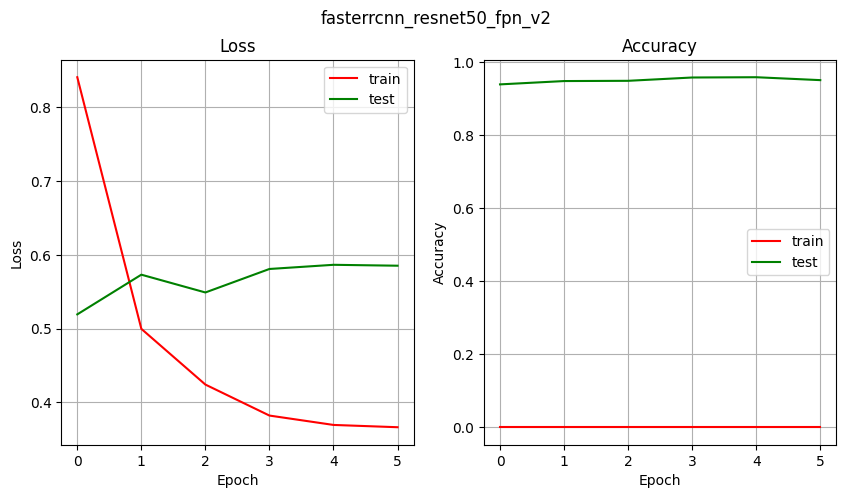

In [41]:
# Cargar el archivo JSON
results_json_path = os.path.join(RUTA_CARPETA_MODELS, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID + '_results.json')
with open(results_json_path, 'r') as file:
    data = json.load(file)

# Asignar variables
train_losses = data['train_losses']
test_losses = data['test_losses']
train_accs = data['train_accs']
test_accs = data['test_accs']
best_test_acc = data['best_test_acc']

plot_results(train_losses, test_losses, train_accs, test_accs, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID)

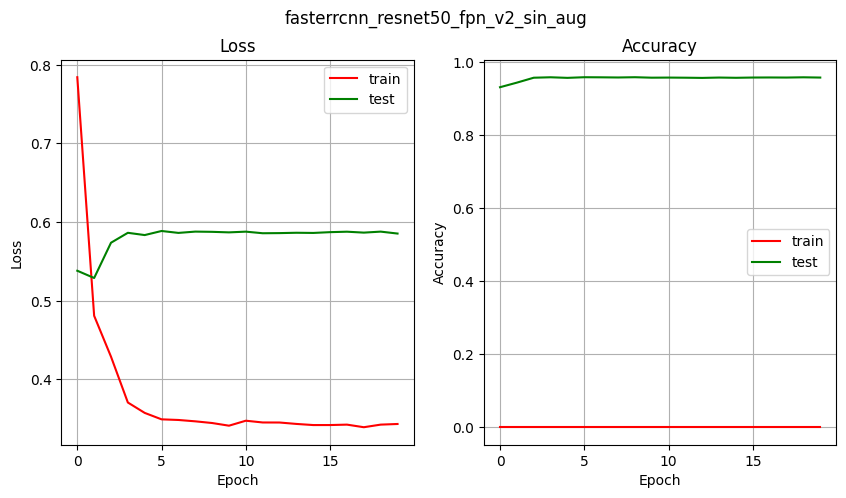

In [42]:
# Cargar el archivo JSON
results_json_path = os.path.join(RUTA_CARPETA_MODELS, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID_SIN_AUG, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID_SIN_AUG + '_results.json')
with open(results_json_path, 'r') as file:
    data = json.load(file)

# Asignar variables
train_losses = data['train_losses']
test_losses = data['test_losses']
train_accs = data['train_accs']
test_accs = data['test_accs']
best_test_acc = data['best_test_acc']

plot_results(train_losses, test_losses, train_accs, test_accs, FASTERRCNN_RESNET50_FPN_V2_MODEL_ID_SIN_AUG)

#### Prueba de inferencia

*Podemos probar como fue nuestro modelo en una imagen:*

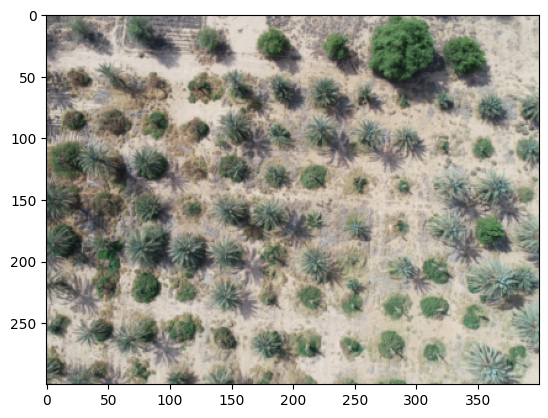

In [43]:
image, _ = test_dataset[0]

plt.figure()
plt.imshow(image.permute(1, 2, 0))

*Y las predicciones son:*

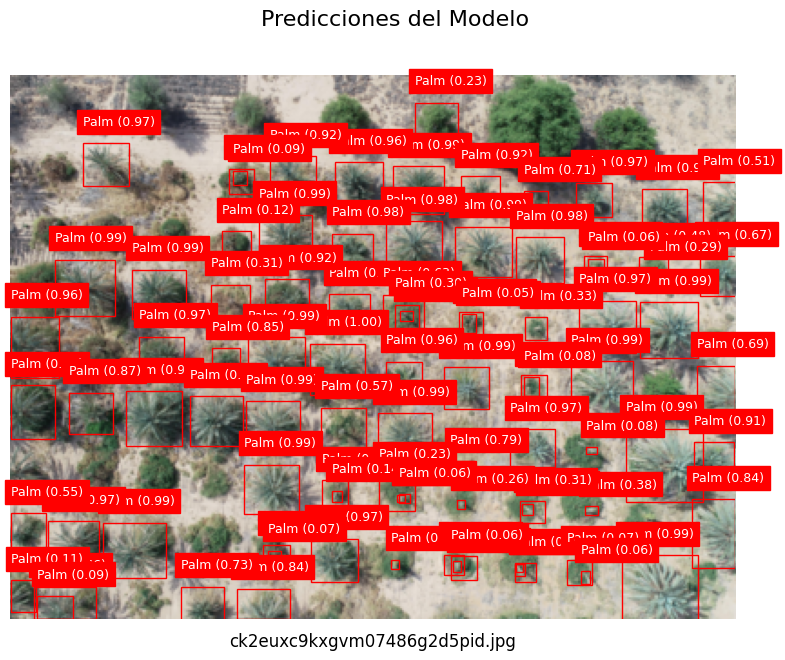

In [45]:
# Definir el umbral para mostrar las predicciones (por ejemplo, 0.5)
score_threshold = 0.5

# Realizar una inferencia en modo de evaluación
model.eval()

# Seleccionar una imagen y un target del conjunto de prueba
image, target = test_dataset[0]  # El targets se utiliza para en nombre de la imagen.

model.to(DEVICE)
image = image.to(DEVICE)

# Realizar la predicción
with torch.no_grad():
    # Pasar la imagen en una lista
    prediction = model([image])[0]

# Filtrar las cajas, etiquetas y scores en función del umbral
predicted_boxes = prediction["boxes"].cpu()
predicted_scores = prediction["scores"].cpu()
predicted_labels = prediction["labels"].cpu()
image = image.cpu()

# Aplicar el umbral
# indices = predicted_scores > score_threshold
indices = nms(predicted_boxes, predicted_scores, iou_threshold=score_threshold)
filtered_boxes = predicted_boxes[indices]
filtered_labels = [
    f"{list(LABELS.keys())[list(LABELS.values()).index(label)]} ({score:.2f})"
    for label, score in zip(predicted_labels[indices], predicted_scores[indices])
]

# Configuración para visualización
config = {
    "linewidth": 1,
    "edgecolor": "r",
    "color": "white",
    "fontsize": 9,
    "backgroundcolor": "red",
    "putText": True,
    "show_image_name": True,
    "super_title": "Predicciones del Modelo",
    "super_title_fontsize": 16,
    "super_title_y": 0.90,
    "from_dataset_voc": True,
}

# Verificar si "image_id" está en el target; si no, usar un nombre genérico
target_for_visualization = {
    "boxes": filtered_boxes,
    "labels": filtered_labels,
    "img_path": target["img_path"]
}

# Visualizar la imagen con las predicciones
show_single_image(image, target_for_visualization, config)

*También, se puede crear una función para utilizar en otro ambiente:*

In [8]:
def show_model_prediction(
    model: torch.nn.Module,
    image_path: str,
    config: dict,
    get_transforms: Callable,
    device: str,
    score_threshold: float = 0.5,
) -> None:
    """
    Muestra las predicciones de un modelo Faster R-CNN en una imagen dada.

    Args:
        model (torch.nn.Module): El modelo de detección de objetos.
        image_path (str): Ruta de la imagen a procesar.
        config (dict): Configuración para el estilo de las cajas y texto.
        get_transforms (callable): Función que aplica las transformaciones necesarias a la imagen.
        score_threshold (float): Umbral mínimo para mostrar las predicciones.

    Returns:
        None
    """
    # Cargar la imagen
    image = read_image(image_path)

    # Aplicar las transformaciones a la imagen
    transforms = get_transforms(train=False)
    # image, _ = transforms(image, {})
    image = transforms(image)

    model.to(device)
    image = image.to(device)

    # Realizar la predicción
    model.eval()
    with torch.no_grad():
        prediction = model([image])[0]

    # Filtrar las cajas, etiquetas y scores en función del umbral
    predicted_boxes = prediction["boxes"].cpu()
    predicted_scores = prediction["scores"].cpu()
    predicted_labels = prediction["labels"].cpu()
    image = image.cpu()

    # Aplico el umbral
    indices = nms(predicted_boxes, predicted_scores, iou_threshold=score_threshold)
    filtered_boxes = predicted_boxes[indices]
    filtered_labels = [
        f"{list(LABELS.keys())[list(LABELS.values()).index(label)]} ({score:.2f})"
        for label, score in zip(predicted_labels[indices], predicted_scores[indices])
    ]

    # Preparar el target para la visualización
    target_for_visualization = {
        "boxes": filtered_boxes,
        "labels": filtered_labels,
        "img_path": image_path,
    }

    # Visualizar la imagen con las predicciones
    show_single_image(image, target_for_visualization, config)

*Probamos predecir una imagen aleatoria de nuestro conjunto:*

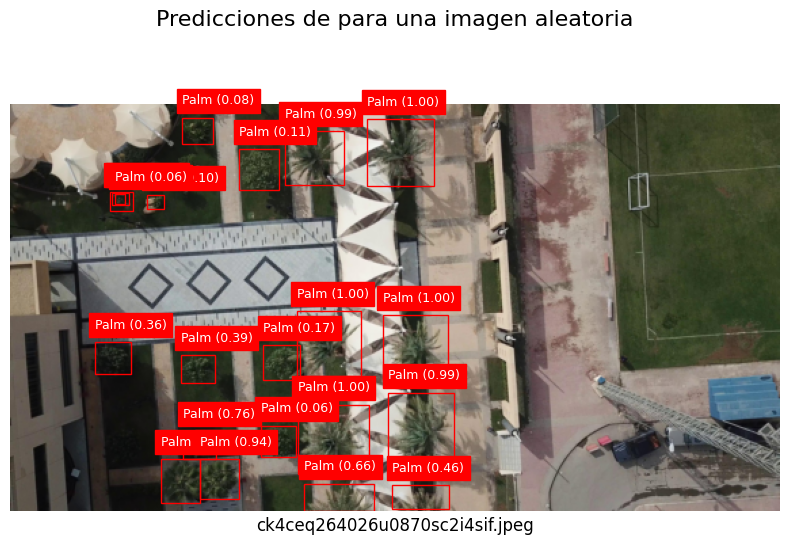

In [47]:
image_path, _ = get_random_image_and_annotation(
    RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA, RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_LABELS
)

config = {
    "linewidth": 1,
    "edgecolor": "r",
    "color": "white",
    "fontsize": 9,
    "backgroundcolor": "red",
    "putText": True,
    "show_image_name": True,
    "super_title": "Predicciones de para una imagen aleatoria",
    "super_title_fontsize": 16,
    "super_title_y": 0.85,
    "from_dataset_voc": True,
}

show_model_prediction(model, image_path, config, get_transforms, DEVICE, 0.5)

🔮 <em><font color='violet'>Función auxiliar:</font></em>
<em><font color='violet'><p>Función que recibe una lista de imágenes en formato de tensores y las grafica en una fila.</p></font></em>

In [58]:
def show_images_in_line_from_tensors(tensor_images: List[torch.tensor]) -> None:
    """
    Función que recibe una lista de imágenes en formato de tensores y las grafica en una fila.

    Parámetros:
    - tensor_images: Lista de tensores que representan las imágenes (deben ser exactamente 3 tensores).
    """
    if len(tensor_images) != 3:
        raise ValueError("La función requiere exactamente tres tensores de imágenes.")
    
    # Convertir a formato PIL para visualización con Matplotlib
    images = [T.ToPILImage()(img) for img in tensor_images]
    
    # Crear la figura con tres subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Mostrar cada imagen en su subplot correspondiente
    for i, img in enumerate(images):
        axes[i].imshow(img)
        axes[i].axis('off')  # Ocultar los ejes
    
    # Mostrar las imágenes
    plt.show()

*Una prueba final, la podemos hacer con imágenes que no fueron vistas por el modelo:*

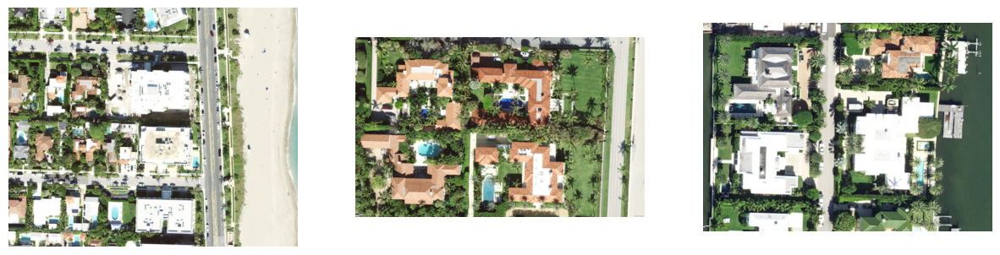

In [59]:
base_dir = os.path.join(RUTA_CARPETA_RESOURCES, 'imgs', 'inferencia')
img_base_list = [read_image(os.path.join(base_dir, img_path)) for img_path in os.listdir(base_dir) if img_path.endswith(FORMATOS_IMAGENES)]


show_images_in_line_from_tensors(img_base_list)

*Predicciones modelo base:*

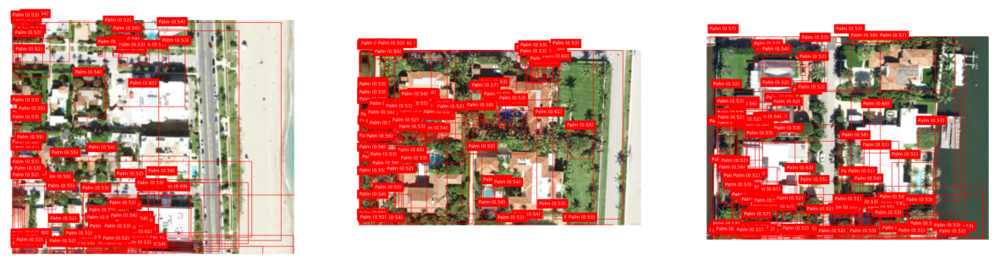

In [60]:
base_dir = os.path.join(RUTA_CARPETA_RESOURCES, 'imgs', 'inferencia', 'faster_results', 'base')
img_base_list = [read_image(os.path.join(base_dir, img_path)) for img_path in os.listdir(base_dir) if img_path.endswith(FORMATOS_IMAGENES)]

show_images_in_line_from_tensors(img_base_list)

*Predicciones del modelo fine tunned:*

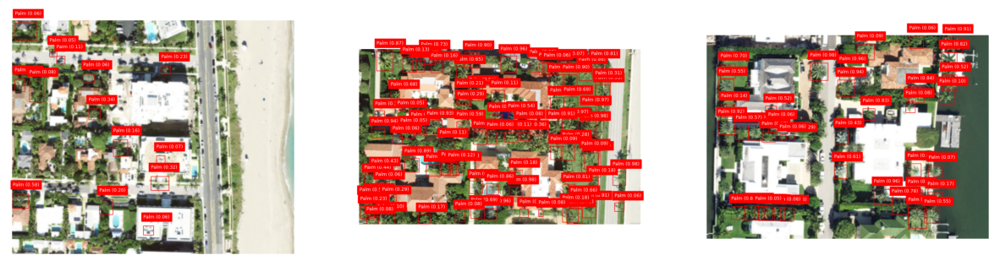

In [61]:
base_dir = os.path.join(RUTA_CARPETA_RESOURCES, 'imgs', 'inferencia', 'faster_results', 'finetunned')
img_base_list = [read_image(os.path.join(base_dir, img_path)) for img_path in os.listdir(base_dir) if img_path.endswith(FORMATOS_IMAGENES)]

show_images_in_line_from_tensors(img_base_list)

### YOLO

<em><p>

El algoritmo de una sola capa para detección de objetos en tiempo real YOLO o *You Only Look Once*, utiliza una única red neuronal convolucional para detectar objetos en imágenes. Existen múltiples versiones, siendo una de las últimas versiones la YOLOv8 (2023). Se utilizará esta versión y se hará una pequeña comparación, a modo de curiosidad, con la versión más reciente YOLOv11 (2024).

</p></em>

🤖 <em><font color='DarkGoldenRod'>Consulta a IA (ChatGPT 4o):</font></em> 🤖

❔ <em><font color='GoldenRod'>Prompt:</font></em>
<em><font color='GoldenRod'><p>

Podrías generar una introducción sobre el modelo YOLOv11? Que incluya sus componentes, sus ventajas y desventajas, así como también comparalo con otros modelos del estado del arte.

</p></font></em>

🔃 <em><font color='BurlyWood'>Respuesta:</font></em>
<em><font color='BurlyWood'><p>

<strong>Introducción al Modelo YOLOv11</strong>

El modelo YOLOv11 (You Only Look Once, versión 11) representa la última evolución en la familia de algoritmos YOLO para la detección de objetos en tiempo real. A lo largo de las versiones previas, YOLO ha sido ampliamente reconocido por su enfoque unificado y eficiente para detectar múltiples objetos en imágenes con alta velocidad, lo que lo ha convertido en uno de los métodos más populares en aplicaciones de visión por computadora, como sistemas de seguridad, automóviles autónomos y más. La versión YOLOv11 introduce varias mejoras en cuanto a arquitectura, rendimiento y precisión.
Componentes principales de YOLOv11

1. Backbone: La columna vertebral de YOLOv11 es una red neuronal convolucional (CNN) mejorada, diseñada específicamente para extraer características profundas de las imágenes de entrada. Esta nueva versión incluye arquitecturas más eficientes como una variación de CSPDarknet, que mejora la capacidad de aprendizaje con menos parámetros y una mejor gestión del ancho de banda de la red.

2. Neck: En YOLOv11, el Neck ha sido optimizado para mejorar la capacidad de capturar características en diferentes escalas. Utiliza un módulo FPN (Feature Pyramid Network) y PAN (Path Aggregation Network) más avanzados, permitiendo una detección más precisa de objetos pequeños y difíciles de reconocer.

3. Head: El Head del modelo, encargado de realizar las predicciones finales de clase y caja de contorno, ha sido refinado para ser más eficiente. Se ha mejorado el uso de las anclas, haciéndolo más adaptable a la detección de objetos de diversos tamaños.

4. Mecanismos de atención: YOLOv11 incorpora nuevas técnicas de atención que permiten enfocar la red en las áreas más relevantes de la imagen, mejorando la precisión sin aumentar significativamente la carga computacional.

<strong>Ventajas de YOLOv11</strong>

- Velocidad: Al igual que sus predecesores, YOLOv11 sobresale en la detección de objetos en tiempo real. El modelo está optimizado para realizar predicciones con una sola pasada sobre la imagen, lo que lo convierte en uno de los modelos más rápidos disponibles para aplicaciones en tiempo real.
- Precisión mejorada: YOLOv11 presenta una mejora significativa en precisión, especialmente para objetos pequeños o en escenarios complejos con superposición de objetos, gracias a su arquitectura avanzada de extracción de características.
- Escalabilidad: La modularidad de su diseño permite adaptarlo a diferentes necesidades, desde implementaciones en dispositivos con limitaciones de recursos hasta aplicaciones más potentes.

<strong>Desventajas de YOLOv11</strong>

- Mayor complejidad computacional: A pesar de los avances en velocidad y precisión, YOLOv11 requiere más capacidad computacional que versiones anteriores debido a su red más profunda y la inclusión de nuevas capas de atención.
- No tan preciso como otros modelos en objetos pequeños: Aunque ha mejorado en este aspecto, todavía puede tener dificultades para detectar objetos extremadamente pequeños en comparación con modelos más especializados en este tipo de tareas, como RetinaNet o EfficientDet.

<strong>Comparación con otros modelos del estado del arte</strong>

1. YOLOv11 vs. EfficientDet: EfficientDet se destaca por su balance entre precisión y eficiencia gracias a su escalabilidad. Si bien YOLOv11 es más rápido en detecciones en tiempo real, EfficientDet logra mejores resultados en tareas que requieren alta precisión, como la detección de objetos pequeños en imágenes de alta resolución. Sin embargo, EfficientDet puede ser más lento en implementaciones donde la velocidad es crítica.
2. YOLOv11 vs. RetinaNet: RetinaNet es conocido por su capacidad para manejar problemas de desbalance de clases con su innovadora Focal Loss, lo que lo convierte en una opción sólida para detectar objetos pequeños o en escenas con alta densidad de objetos. Aunque YOLOv11 ha cerrado la brecha en este aspecto, RetinaNet sigue siendo más adecuado para escenarios en los que la precisión es más importante que la velocidad.
3. YOLOv11 vs. DETR (Detection Transformer): DETR ha revolucionado el campo con su enfoque basado en transformadores para la detección de objetos, eliminando la necesidad de anclas y logrando un rendimiento impresionante en tareas complejas. Sin embargo, DETR tiende a ser más lento que YOLOv11 y requiere más recursos computacionales. YOLOv11 es preferible en aplicaciones donde se necesita un alto rendimiento en tiempo real con un hardware menos potente.

<strong>Conclusión</strong>

YOLOv11 marca un avance significativo en la familia YOLO, equilibrando velocidad y precisión para adaptarse a una amplia gama de aplicaciones de visión por computadora. Aunque enfrenta una competencia considerable en el estado del arte de la detección de objetos, sigue siendo una opción sobresaliente para escenarios en los que el tiempo de inferencia rápido es crucial. Las mejoras en la arquitectura del modelo, junto con su capacidad de manejar diferentes tamaños de objetos y escenas complejas, lo posicionan como una herramienta versátil en el campo de la inteligencia artificial aplicada.

</p></font></em>

<!-- Colab -->
<div align="center"><img src="https://drive.google.com/uc?export=view&id=1R4iAigKonOVVQegneI60fm8KXEjMsZCB" width="600" alt="Figura 4: Arquitectura YOLOv10 para referencia. No se encontró disponible la arquitectura de YOLOv11 aún. Extraída de: https://blog.roboflow.com/what-is-yolov10/"></div>

<!-- <div align="center"><img src="./resources/imgs/img4.png" width="600" alt="Figura 4: Arquitectura YOLOv10 para referencia. No se encontró disponible la arquitectura de YOLOv11 aún. Extraída de: https://blog.roboflow.com/what-is-yolov10"></div> -->

<div align="center"><small><em>Figura 4: Arquitectura YOLOv10 para referencia. No se encontró disponible la arquitectura de YOLOv11 aún. Extraída de: https://blog.roboflow.com/what-is-yolov10</em></small></div>

#### Preparar el dataset

<em><p>

El formato de una etiqueta de YOLOv8 es: `<class_id> <x_center> <y_center> <width> <height>`. El dataset de imágenes que se utiliza contiene un par de archivos en formato ``.csv`` con los datos de las etiquetas en cada una de las imágenes; así mismo, éstas se encuentran divididas en dos conjuntos: train y test.

Como el conjunto de imágenes ya se encuentra dividido, para mantener la coherencia entre los modelos, se decide utilizar la misma división existente.

</p></em>

In [12]:
# Etiquetas:
LABELS = {
    'Tree' : 0,
    'Palm' : 1
}

NOMBRE_MODELO_YOLO = 'palmeras'
RUTA_CARPETA_YOLO_PROYECTOS = 'yolo'
RUTA_CARPETA_YOLOV8_PROYECTOS_TRAIN = os.path.join(RUTA_CARPETA_YOLO_PROYECTOS, YOLOV8_MODEL_ID, 'train')
RUTA_CARPETA_YOLOV8_PROYECTOS_VAL = os.path.join(RUTA_CARPETA_YOLO_PROYECTOS, YOLOV8_MODEL_ID, 'val')

RUTA_CARPETA_YOLOV11_PROYECTOS_TRAIN = os.path.join(RUTA_CARPETA_YOLO_PROYECTOS, YOLOV11_MODEL_ID, 'train')
RUTA_CARPETA_YOLOV11_PROYECTOS_VAL = os.path.join(RUTA_CARPETA_YOLO_PROYECTOS, YOLOV11_MODEL_ID, 'val')

#RUTA_CARPETA_YOLOV8_PROYECTOS_BEST_TRAINED = os.path.join(RUTA_CARPETA_YOLOV8_PROYECTOS_TRAIN, NOMBRE_MODELO_YOLO, 'weights', 'best.pt')


In [ ]:
train_df = pd.read_csv(RUTA_CARPETA_KAGGLE_DATSET_YOLO_TRAIN_CSV)
test_df = pd.read_csv(RUTA_CARPETA_KAGGLE_DATSET_YOLO_TEST_CSV)

# Se imprime el head de los dataframes para verificar que se cargaron correctamente
print(train_df.head())
print(test_df.head())

# Veamos las clases disponibles
print('--- Clases disponibles ---')
print('En Train: ', train_df['class'].unique())
print('En Test: ', test_df['class'].unique())

                        filename  width  height class  xmin  ymin  xmax  ymax
0  ck2oh0xx2sthb0838g3pmr4ky.jpg   4000    3000  Palm  1147  1694  1337  1863
1  ck2oh0xx2sthb0838g3pmr4ky.jpg   4000    3000  Palm  1392  1725  1567  1918
2  ck2oh0xx2sthb0838g3pmr4ky.jpg   4000    3000  Palm  1645  1816  1756  1933
3  ck2oh0xx2sthb0838g3pmr4ky.jpg   4000    3000  Palm  1913  1793  2104  1966
4  ck2oh0xx2sthb0838g3pmr4ky.jpg   4000    3000  Palm  2270  1817  2488  2034
                        filename  width  height class  xmin  ymin  xmax  ymax
0  ck2jfuaiwocqi07256rg8xca1.jpg   4864    3648  Tree  1978  1084  2349  1414
1  ck2jfuaiwocqi07256rg8xca1.jpg   4864    3648  Tree  2295  1947  2727  2465
2  ck2jfuaiwocqi07256rg8xca1.jpg   4864    3648  Tree  1358  1765  1912  2357
3  ck2jfuaiwocqi07256rg8xca1.jpg   4864    3648  Tree     0  2479   380  2981
4  ck2jfuaiwocqi07256rg8xca1.jpg   4864    3648  Tree  1664  2740  2268  3264
--- Clases disponibles ---
En Train:  ['Palm' 'Tree']
En Test:  

*Se define una función para convertir en formato YOLO los datos guardados en los archivos CSV a formato aceptado por YOLO (.txt).*

In [ ]:
# Función para convertir las coordenadas de las cajas de anotación a formato YOLO
def convert_to_yolo_format(row):
    """
    Convierte las coordenadas de las cajas de anotación a formato YOLO.

    Args:
        row (pd.Series): Fila del DataFrame con las anotaciones.

    Returns:
        tuple: Una tupla con los datos en formato YOLO.

    """
    try:
        image_width = row['width']
        image_height = row['height']
        x_center = (row['xmin'] + row['xmax']) / 2.0 / image_width
        y_center = (row['ymin'] + row['ymax']) / 2.0 / image_height
        width = (row['xmax'] - row['xmin']) / image_width
        height = (row['ymax'] - row['ymin']) / image_height
        class_id = LABELS.get(row['class'], None)
        if class_id is None:
            print(f"Clase no encontrada: <{row['class']}> en la fila <{row}>")
            return None
        return class_id, x_center, y_center, width, height
    except KeyError as e:
        print(f"Falta un dato en la fila: {e}")
        return None
    except TypeError:
        print("Datos invalidos encontrados.")
        return None

# Función para guardar las anotaciones en formato YOLO
def save_yolo_annotations(df, output_dir):
    """
    Guarda las anotaciones en formato YOLO.

    Args:
        df (pd.DataFrame): DataFrame con las anotaciones.
        output_dir (str): Directorio de salida.
    
    Returns:
        None
    
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    for _, row in df.iterrows():
        yolo_data = convert_to_yolo_format(row)
        filename = os.path.splitext(row['filename'])[0] + '.txt'
        output_path = os.path.join(output_dir, filename)
        
        if yolo_data:
            with open(output_path, 'a') as f:
                f.write(f"{yolo_data[0]} {yolo_data[1]:.6f} {yolo_data[2]:.6f} {yolo_data[3]:.6f} {yolo_data[4]:.6f}\n")

In [ ]:
save_yolo_annotations(train_df, RUTA_CARPETA_KAGGLE_DATASET_YOLO_TRAIN)
save_yolo_annotations(test_df, RUTA_CARPETA_KAGGLE_DATASET_YOLO_TEST)

*El modelo YOLO espera que las imágenes se encuentren en el mismo lugar que los archivos de texto con la información sobre la etiqueta. Se debe tener un archivo de texto con todas las etiquetas de las detecciones por cada una de las imágenes.*

In [ ]:
# Compiamos las imágenes a las carpetas correspondientes (train y test)
for _, row in train_df.iterrows():
    shutil.copy(os.path.join(RUTA_CARPETA_KAGGLE_DATASET_VOC_TRAIN_DATA, row['filename']), RUTA_CARPETA_KAGGLE_DATASET_YOLO_TRAIN)

for _, row in test_df.iterrows():
    shutil.copy(os.path.join(RUTA_CARPETA_KAGGLE_DATASET_VOC_TEST_DATA, row['filename']), RUTA_CARPETA_KAGGLE_DATASET_YOLO_TEST)

#### Entrenamiento con YOLOv8 y YOLOv11

In [ ]:
print(DEVICE)

cuda


<em><p>

Se entrenan dos modelos con una pequeña diferencia en los hiperparámetros: el tamaño de la imagen de entrada.

YOLO automaticamente optimiza el *Learning Rate* y el *Momentum* dependiendo del tamaño del dataset, las épocas, las iteraciones y las entradas (es decir, la complejidad), además de elegir el optimizador que considera mejor. Existe además una función adicional de Ajuste de hiperparámetros, pero no se pudo ejecutar en el equipo.

</p></em>

In [14]:
# Parámetros
YOLO_IMG_SIZE_1 = 640
YOLO_IMG_SIZE_2 = 480
YOLO_EPOCHS_1 = 100
YOLO_EPOCHS_2 = 200

# Parámetros para el entrenamiento de YOLO
params_1 = {
    "data": YOLOV8_CONFIG_YAML,
    "imgsz": YOLO_IMG_SIZE_1,
    "epochs": YOLO_EPOCHS_1,
    "device": DEVICE,
    "name": f'{NOMBRE_MODELO_YOLO}_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}_r0',
    "patience" : 20
}

params_2 = {
    "data": YOLOV8_CONFIG_YAML,
    "imgsz": YOLO_IMG_SIZE_2,
    "epochs": YOLO_EPOCHS_2,
    "device": DEVICE,
    "name": f'{NOMBRE_MODELO_YOLO}_imgsz{YOLO_IMG_SIZE_2}_epochs{YOLO_EPOCHS_2}_r0',
    "patience" : 20
}



<em><p>

Se utilizan los modelos "nano" en sus versiones YOLOv8 y YOLO 11. Ambos son modelos que están pre-entrenados, con pesos e hiperparámetros ya definidos. Estos modelos están entrenados en el dataset de COCO y es una buena base generalizable.

</p></em>

In [ ]:
# Se instancian los modelos YOLOv8 nano
model_yolov8_p1 = YOLO("yolov8n.pt")
model_yolov8_p2 = YOLO("yolov8n.pt") 

# Se instancian los modelos YOLOv11 nano
model_yolov11_p1 = YOLO("yolo11n.pt")
model_yolov11_p2 = YOLO("yolo11n.pt") 

In [ ]:
%tensorboard --logdir yolo/yolov8/train/palmeras_imgsz640_epochs10_lr0.001

In [ ]:
# Se entrena el modelo base
model_yolov8_p1.train(project=RUTA_CARPETA_YOLOV8_PROYECTOS_TRAIN, **params_1)

Ultralytics 8.3.12  Python-3.11.9 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=./resources\utils\yolov8.yaml, epochs=100, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=yolo\yolov8\train, name=palmeras_imgsz640_epochs100_r0, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fals

train: Scanning D:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\datasets\raw\palmeras_kaggle_yolo_format\train.cache... 279 images, 0 backgrounds, 0 corrupt: 100%|██████████| 279/279 [00:00<?, ?it/s]
val: Scanning D:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\datasets\raw\palmeras_kaggle_yolo_format\test.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]


Plotting labels to yolo\yolov8\train\palmeras_imgsz640_epochs100_r0\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolo\yolov8\train\palmeras_imgsz640_epochs100_r0
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.41G      2.093      3.675      1.648        438        640: 100%|██████████| 18/18 [00:06<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         70       2670     0.0727      0.481       0.16     0.0684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.85G       1.55      2.833      1.149        528        640: 100%|██████████| 18/18 [00:04<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

                   all         70       2670      0.101      0.601      0.369      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.75G      1.569      1.959      1.134        435        640: 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         70       2670     0.0979      0.541      0.325      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.68G      1.506      1.442      1.143        262        640: 100%|██████████| 18/18 [00:04<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all         70       2670      0.114      0.593      0.345      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.33G      1.422      1.167      1.138        266        640: 100%|██████████| 18/18 [00:04<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         70       2670      0.133      0.751      0.461      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.23G      1.414        1.1      1.122        204        640: 100%|██████████| 18/18 [00:03<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


                   all         70       2670      0.629      0.382      0.515      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.36G      1.416       1.01      1.125        408        640: 100%|██████████| 18/18 [00:04<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         70       2670       0.63      0.547      0.576        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.64G      1.367     0.9549      1.098        477        640: 100%|██████████| 18/18 [00:05<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]


                   all         70       2670      0.601      0.557      0.596        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.47G      1.346      0.925      1.096        449        640: 100%|██████████| 18/18 [00:03<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


                   all         70       2670       0.61      0.586      0.619       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.63G      1.326      0.879      1.092        383        640: 100%|██████████| 18/18 [00:03<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all         70       2670      0.705      0.646      0.695      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.86G      1.324      0.853      1.096        427        640: 100%|██████████| 18/18 [00:03<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         70       2670      0.638      0.626      0.669      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.71G      1.322     0.8324      1.088        274        640: 100%|██████████| 18/18 [00:03<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

                   all         70       2670       0.75      0.641      0.693      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       3.7G      1.342     0.8314      1.093        532        640: 100%|██████████| 18/18 [00:03<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

                   all         70       2670      0.668      0.698      0.715      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100       3.7G      1.338     0.8033      1.084        287        640: 100%|██████████| 18/18 [00:03<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all         70       2670      0.696      0.679      0.704      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.08G      1.324     0.8228      1.084        386        640: 100%|██████████| 18/18 [00:03<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]

                   all         70       2670      0.742      0.706      0.744      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.97G      1.282     0.7809      1.077        537        640: 100%|██████████| 18/18 [00:03<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

                   all         70       2670      0.713       0.72      0.736      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.71G      1.341     0.7713       1.09        366        640: 100%|██████████| 18/18 [00:04<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         70       2670      0.645       0.58      0.638      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.82G      1.325     0.7754      1.088        476        640: 100%|██████████| 18/18 [00:03<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.25it/s]

                   all         70       2670      0.685      0.724      0.695      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.26G      1.316     0.7701      1.074        444        640: 100%|██████████| 18/18 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all         70       2670      0.732      0.695      0.731      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.93G      1.274     0.7366      1.078        423        640: 100%|██████████| 18/18 [00:04<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all         70       2670      0.715      0.712      0.743      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.04G      1.283     0.7247      1.079        379        640: 100%|██████████| 18/18 [00:03<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]

                   all         70       2670      0.725      0.752      0.754      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.92G      1.268     0.7268      1.072        634        640: 100%|██████████| 18/18 [00:03<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]


                   all         70       2670      0.734       0.75       0.76      0.425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.26G       1.26     0.7065      1.061        520        640: 100%|██████████| 18/18 [00:03<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]

                   all         70       2670      0.729      0.767      0.772      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.53G      1.233     0.7116      1.063        351        640: 100%|██████████| 18/18 [00:03<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         70       2670      0.716      0.722      0.735      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.17G      1.245     0.7084       1.07        454        640: 100%|██████████| 18/18 [00:03<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]


                   all         70       2670      0.765      0.793      0.818      0.447

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.12G      1.249     0.6985       1.05        441        640: 100%|██████████| 18/18 [00:03<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]


                   all         70       2670      0.772      0.759      0.785      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.34G       1.25     0.6992      1.059        538        640: 100%|██████████| 18/18 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

                   all         70       2670      0.699      0.793      0.759      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.26G      1.237     0.6898      1.065        373        640: 100%|██████████| 18/18 [00:04<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all         70       2670       0.72      0.769      0.768      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.47G      1.236     0.6788      1.052        387        640: 100%|██████████| 18/18 [00:03<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.23it/s]

                   all         70       2670      0.766      0.732      0.776      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.92G       1.25     0.6893      1.055        568        640: 100%|██████████| 18/18 [00:03<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.07it/s]


                   all         70       2670      0.777      0.756      0.783      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.75G      1.234     0.6713      1.052        272        640: 100%|██████████| 18/18 [00:03<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         70       2670      0.768      0.787      0.798      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.89G      1.228     0.6708      1.065        362        640: 100%|██████████| 18/18 [00:03<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]


                   all         70       2670      0.747      0.743      0.747       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.74G      1.211     0.6659      1.053        374        640: 100%|██████████| 18/18 [00:03<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         70       2670      0.825      0.722      0.801      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.25G      1.257     0.6712      1.055        434        640: 100%|██████████| 18/18 [00:04<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all         70       2670      0.765      0.756      0.782      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.18G      1.241     0.6659      1.043        524        640: 100%|██████████| 18/18 [00:03<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all         70       2670      0.746      0.779      0.783      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.84G      1.235     0.6513      1.052        306        640: 100%|██████████| 18/18 [00:04<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.01it/s]

                   all         70       2670      0.742      0.767      0.779      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.32G      1.236     0.6644      1.059        322        640: 100%|██████████| 18/18 [00:03<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         70       2670      0.798      0.755      0.795      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       3.9G       1.24     0.6505      1.055        347        640: 100%|██████████| 18/18 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]

                   all         70       2670      0.769      0.765      0.786      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.96G      1.227     0.6525      1.054        438        640: 100%|██████████| 18/18 [00:03<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]

                   all         70       2670       0.78       0.79      0.804      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.16G      1.211     0.6353      1.052        433        640: 100%|██████████| 18/18 [00:03<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all         70       2670      0.798      0.768      0.806      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.92G      1.204     0.6337      1.043        384        640: 100%|██████████| 18/18 [00:03<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.67it/s]

                   all         70       2670      0.764      0.782      0.807      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.47G      1.229     0.6529      1.055        343        640: 100%|██████████| 18/18 [00:03<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]

                   all         70       2670      0.773      0.769      0.791      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.89G       1.22     0.6427      1.055        419        640: 100%|██████████| 18/18 [00:04<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.82it/s]

                   all         70       2670      0.791       0.76      0.799      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.61G      1.215      0.632      1.041        620        640: 100%|██████████| 18/18 [00:03<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all         70       2670       0.75      0.771      0.776      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.41G      1.174     0.6115      1.034        497        640: 100%|██████████| 18/18 [00:03<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.18it/s]

                   all         70       2670      0.776      0.774      0.793      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.64G      1.211     0.6287      1.045        539        640: 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         70       2670      0.773      0.792      0.802      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.07G      1.197     0.6211      1.046        293        640: 100%|██████████| 18/18 [00:04<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         70       2670      0.774      0.798      0.799      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.37G      1.183     0.6181      1.042        352        640: 100%|██████████| 18/18 [00:08<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.46it/s]

                   all         70       2670      0.764      0.771      0.784      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.45G      1.179     0.6119      1.041        541        640: 100%|██████████| 18/18 [00:03<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

                   all         70       2670       0.79      0.774      0.811      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.07G      1.214     0.6321      1.047        407        640: 100%|██████████| 18/18 [00:03<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]


                   all         70       2670      0.783      0.777      0.797       0.44

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.39G      1.191     0.6088      1.046        496        640: 100%|██████████| 18/18 [00:03<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]

                   all         70       2670      0.767      0.784      0.789      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       3.9G      1.191     0.6043      1.035        465        640: 100%|██████████| 18/18 [00:03<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


                   all         70       2670      0.765       0.78      0.791      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.95G      1.194     0.6015      1.041        553        640: 100%|██████████| 18/18 [00:03<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]

                   all         70       2670      0.763      0.765      0.777      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.12G       1.16     0.6032      1.036        449        640: 100%|██████████| 18/18 [00:03<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         70       2670      0.774      0.765      0.791      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.61G      1.175     0.5983      1.038        262        640: 100%|██████████| 18/18 [00:03<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]


                   all         70       2670      0.786      0.789      0.806       0.45

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.68G      1.163     0.5845      1.025        475        640: 100%|██████████| 18/18 [00:04<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         70       2670      0.797      0.796      0.813      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       4.1G      1.167     0.6046      1.044        252        640: 100%|██████████| 18/18 [00:03<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]


                   all         70       2670      0.796      0.785      0.814      0.447

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.23G      1.167     0.5943      1.031        550        640: 100%|██████████| 18/18 [00:03<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         70       2670      0.801      0.757      0.801      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.71G       1.17     0.6012      1.033        315        640: 100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.35it/s]

                   all         70       2670      0.748      0.802      0.786       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.49G      1.162     0.5909      1.036        474        640: 100%|██████████| 18/18 [00:03<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]


                   all         70       2670      0.762      0.791      0.782      0.449
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 40, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

60 epochs completed in 0.109 hours.
Optimizer stripped from yolo\yolov8\train\palmeras_imgsz640_epochs100_r0\weights\last.pt, 5.6MB
Optimizer stripped from yolo\yolov8\train\palmeras_imgsz640_epochs100_r0\weights\best.pt, 5.6MB

Validating yolo\yolov8\train\palmeras_imgsz640_epochs100_r0\weights\best.pt...
Ultralytics 8.3.12  Python-3.11.9 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
Model summary (fused): 186 layers, 2,684,758 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.12s/it]


                   all         70       2670      0.798      0.768      0.806      0.453
                  Tree         43        325      0.668        0.6      0.644      0.303
                  Palm         66       2345      0.928      0.936      0.968      0.604
Speed: 1.0ms preprocess, 3.5ms inference, 0.0ms loss, 7.0ms postprocess per image
Results saved to yolo\yolov8\train\palmeras_imgsz640_epochs100_r0


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002258AD1CAD0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0

In [ ]:
# Se entrena el modelo base
model_yolov8_p2.train(project=RUTA_CARPETA_YOLOV8_PROYECTOS_TRAIN, **params_2)

Ultralytics 8.3.12  Python-3.11.9 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=./resources\utils\yolov8.yaml, epochs=200, time=None, patience=20, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=yolo\yolov8\train, name=palmeras_imgsz480_epochs200_r0, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fals

train: Scanning D:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\datasets\raw\palmeras_kaggle_yolo_format\train.cache... 279 images, 0 backgrounds, 0 corrupt: 100%|██████████| 279/279 [00:00<?, ?it/s]
val: Scanning D:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\datasets\raw\palmeras_kaggle_yolo_format\test.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]


Plotting labels to yolo\yolov8\train\palmeras_imgsz480_epochs200_r0\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 480 train, 480 val
Using 8 dataloader workers
Logging results to yolo\yolov8\train\palmeras_imgsz480_epochs200_r0
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      1.99G      2.362      3.779      1.665        439        480: 100%|██████████| 18/18 [00:04<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all         70       2670     0.0534      0.338     0.0429     0.0199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      2.23G      1.642      3.137      1.153        527        480: 100%|██████████| 18/18 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]


                   all         70       2670     0.0898      0.536      0.272      0.117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      2.18G      1.644      2.239      1.106        435        480: 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.15it/s]


                   all         70       2670      0.096      0.464      0.205     0.0755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      2.14G      1.589      1.612      1.096        262        480: 100%|██████████| 18/18 [00:03<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


                   all         70       2670      0.121       0.51      0.261      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      1.94G      1.514      1.269      1.086        265        480: 100%|██████████| 18/18 [00:03<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         70       2670      0.789      0.413      0.408      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      1.88G      1.489      1.196      1.071        204        480: 100%|██████████| 18/18 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all         70       2670       0.91      0.368      0.434      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      1.96G      1.449      1.059      1.063        408        480: 100%|██████████| 18/18 [00:04<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.52it/s]

                   all         70       2670      0.421      0.407      0.446      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      2.68G       1.42     0.9878      1.049        477        480: 100%|██████████| 18/18 [00:04<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.37it/s]

                   all         70       2670      0.399      0.492      0.483      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      2.02G      1.407     0.9554      1.062        449        480: 100%|██████████| 18/18 [00:03<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all         70       2670      0.603        0.5       0.53        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      2.67G      1.371     0.9196      1.045        383        480: 100%|██████████| 18/18 [00:02<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.67it/s]


                   all         70       2670       0.57       0.54      0.555      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      2.24G      1.363     0.8758      1.048        426        480: 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         70       2670      0.686      0.568       0.61      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      2.16G      1.384     0.8511       1.05        274        480: 100%|██████████| 18/18 [00:03<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         70       2670      0.591      0.635      0.636      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      2.15G      1.409      0.847      1.054        531        480: 100%|██████████| 18/18 [00:02<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]


                   all         70       2670      0.601      0.646      0.643      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      2.15G       1.38     0.8169      1.039        287        480: 100%|██████████| 18/18 [00:03<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         70       2670      0.649      0.606       0.64      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      1.86G      1.381     0.8255      1.047        382        480: 100%|██████████| 18/18 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]


                   all         70       2670      0.703      0.635      0.669       0.36

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200       2.3G      1.324     0.7819      1.041        540        480: 100%|██████████| 18/18 [00:03<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         70       2670      0.664      0.677      0.686      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      2.16G      1.337     0.7503       1.03        366        480: 100%|██████████| 18/18 [00:02<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all         70       2670      0.675      0.649      0.689      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      2.23G      1.328     0.7551      1.036        476        480: 100%|██████████| 18/18 [00:03<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         70       2670       0.71      0.695      0.714      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      1.91G      1.342     0.7688      1.028        444        480: 100%|██████████| 18/18 [00:03<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         70       2670      0.672      0.621      0.669       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      2.28G      1.304     0.7295      1.032        423        480: 100%|██████████| 18/18 [00:03<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.41it/s]

                   all         70       2670      0.671      0.636      0.654      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      2.35G      1.323     0.7223      1.037        379        480: 100%|██████████| 18/18 [00:02<00:00,  7.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]


                   all         70       2670      0.748      0.695      0.729      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      2.27G      1.327     0.7268      1.033        632        480: 100%|██████████| 18/18 [00:03<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         70       2670      0.738      0.715      0.731      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      2.47G      1.314     0.7157      1.023        520        480: 100%|██████████| 18/18 [00:02<00:00,  7.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         70       2670       0.79      0.701      0.757      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      2.62G      1.268     0.7115      1.029        351        480: 100%|██████████| 18/18 [00:03<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         70       2670      0.746       0.69      0.717      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      1.86G      1.285     0.7129      1.033        455        480: 100%|██████████| 18/18 [00:03<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         70       2670      0.779      0.709      0.749      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      2.39G      1.298     0.7082      1.019        440        480: 100%|██████████| 18/18 [00:02<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


                   all         70       2670      0.736      0.651      0.699      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      1.96G      1.295     0.7095      1.023        538        480: 100%|██████████| 18/18 [00:03<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all         70       2670       0.74      0.696      0.726      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      2.46G      1.286      0.699      1.033        372        480: 100%|██████████| 18/18 [00:03<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.66it/s]

                   all         70       2670      0.701      0.652      0.678      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      2.02G      1.293     0.6926      1.021        387        480: 100%|██████████| 18/18 [00:03<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all         70       2670      0.744       0.69      0.714      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      2.28G      1.288     0.6927      1.017        568        480: 100%|██████████| 18/18 [00:02<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]


                   all         70       2670      0.775      0.709      0.756       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      2.18G      1.271       0.67      1.016        272        480: 100%|██████████| 18/18 [00:03<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all         70       2670      0.767      0.706      0.748      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      2.25G      1.277     0.6763      1.032        363        480: 100%|██████████| 18/18 [00:03<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         70       2670      0.768      0.709      0.739      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      2.17G      1.254     0.6679       1.02        375        480: 100%|██████████| 18/18 [00:03<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.61it/s]

                   all         70       2670      0.763      0.732       0.77      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      2.46G      1.292     0.6827      1.016        434        480: 100%|██████████| 18/18 [00:02<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         70       2670      0.765      0.725      0.757      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      2.42G      1.271     0.6714      1.009        523        480: 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.53it/s]

                   all         70       2670      0.694      0.684      0.704      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      2.23G      1.278       0.66      1.016        306        480: 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.45it/s]

                   all         70       2670       0.71      0.729       0.73      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      1.92G      1.277     0.6603      1.023        321        480: 100%|██████████| 18/18 [00:02<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all         70       2670      0.721      0.708      0.728      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      2.27G       1.28     0.6568       1.02        347        480: 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.51it/s]

                   all         70       2670      0.713      0.732      0.744      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200       2.3G      1.272     0.6555      1.022        439        480: 100%|██████████| 18/18 [00:03<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all         70       2670      0.758      0.722      0.758      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      2.41G      1.251     0.6471      1.019        433        480: 100%|██████████| 18/18 [00:02<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all         70       2670      0.795      0.718       0.76      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      2.28G      1.249     0.6418      1.015        384        480: 100%|██████████| 18/18 [00:03<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.49it/s]


                   all         70       2670      0.761      0.723      0.757      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      2.24G      1.268     0.6577      1.022        342        480: 100%|██████████| 18/18 [00:04<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         70       2670      0.739      0.728      0.753      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      2.26G      1.251     0.6487      1.019        419        480: 100%|██████████| 18/18 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         70       2670      0.702       0.72       0.73       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200       2.1G      1.255     0.6384      1.003        619        480: 100%|██████████| 18/18 [00:03<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


                   all         70       2670       0.76      0.699      0.746      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      1.99G      1.228     0.6281          1        497        480: 100%|██████████| 18/18 [00:03<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


                   all         70       2670      0.728      0.748       0.75      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      2.12G      1.246     0.6377      1.008        537        480: 100%|██████████| 18/18 [00:02<00:00,  7.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]


                   all         70       2670      0.757      0.709      0.743      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200       1.8G       1.25     0.6334      1.014        293        480: 100%|██████████| 18/18 [00:03<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.13it/s]


                   all         70       2670      0.718      0.742      0.747      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      2.54G       1.23     0.6318       1.01        353        480: 100%|██████████| 18/18 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.59it/s]

                   all         70       2670      0.734      0.736      0.754      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      2.01G      1.227     0.6209      1.011        540        480: 100%|██████████| 18/18 [00:02<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.46it/s]

                   all         70       2670      0.725      0.735       0.76       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      2.36G       1.26     0.6413      1.013        407        480: 100%|██████████| 18/18 [00:03<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         70       2670      0.797      0.737      0.768      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      1.98G      1.243     0.6262      1.017        495        480: 100%|██████████| 18/18 [00:02<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all         70       2670      0.766      0.699      0.724      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      2.26G      1.246     0.6194      1.008        466        480: 100%|██████████| 18/18 [00:03<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all         70       2670       0.75      0.751      0.761      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200       2.3G      1.244     0.6157      1.012        553        480: 100%|██████████| 18/18 [00:02<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         70       2670      0.719      0.744      0.749       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      2.39G      1.213     0.6196       1.01        449        480: 100%|██████████| 18/18 [00:02<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all         70       2670      0.754      0.741      0.766      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      2.11G      1.221     0.6142      1.007        261        480: 100%|██████████| 18/18 [00:03<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all         70       2670      0.767       0.76      0.779      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      2.14G      1.211     0.6022     0.9943        475        480: 100%|██████████| 18/18 [00:03<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.99it/s]

                   all         70       2670      0.802      0.739      0.778      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      2.38G      1.227      0.629      1.019        252        480: 100%|██████████| 18/18 [00:03<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.13it/s]

                   all         70       2670      0.774      0.747      0.781      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      2.45G      1.229     0.6188      1.006        549        480: 100%|██████████| 18/18 [00:02<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.27it/s]

                   all         70       2670      0.779      0.739      0.761      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      2.79G      1.234     0.6251      1.011        315        480: 100%|██████████| 18/18 [00:04<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.50it/s]

                   all         70       2670      0.745      0.735       0.76      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      2.04G      1.224     0.6097      1.011        475        480: 100%|██████████| 18/18 [00:03<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         70       2670      0.749      0.754      0.775      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      2.28G      1.234     0.6065     0.9964        547        480: 100%|██████████| 18/18 [00:03<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]

                   all         70       2670      0.762       0.76      0.779      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      2.37G      1.231     0.6064      1.012        360        480: 100%|██████████| 18/18 [00:02<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.17it/s]

                   all         70       2670      0.775       0.75      0.761      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      2.33G      1.209     0.5939     0.9981        473        480: 100%|██████████| 18/18 [00:03<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

                   all         70       2670      0.786      0.743      0.781      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      2.69G      1.225     0.5912      0.999        395        480: 100%|██████████| 18/18 [00:04<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all         70       2670      0.795       0.75      0.775      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200         2G      1.202     0.5903     0.9968        511        480: 100%|██████████| 18/18 [00:03<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         70       2670      0.753      0.746      0.765      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      2.05G       1.22     0.6013      1.006        411        480: 100%|██████████| 18/18 [00:03<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]


                   all         70       2670      0.761      0.776      0.792      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      2.21G      1.177     0.5806      1.004        449        480: 100%|██████████| 18/18 [00:02<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all         70       2670      0.749       0.72       0.75      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200       2.7G      1.245       0.61      1.013        392        480: 100%|██████████| 18/18 [00:04<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


                   all         70       2670      0.799      0.739      0.779      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      2.17G      1.217      0.596      1.006        425        480: 100%|██████████| 18/18 [00:02<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]


                   all         70       2670      0.792      0.752      0.783      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      2.17G      1.195     0.5828      1.005        306        480: 100%|██████████| 18/18 [00:03<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]


                   all         70       2670      0.776      0.729      0.763      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      1.99G      1.179     0.5714     0.9992        504        480: 100%|██████████| 18/18 [00:03<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         70       2670      0.782      0.747      0.762      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      2.36G      1.234     0.5986      1.019        321        480: 100%|██████████| 18/18 [00:04<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.62it/s]

                   all         70       2670      0.762      0.766       0.78      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      2.34G      1.205     0.5815     0.9973        497        480: 100%|██████████| 18/18 [00:02<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]

                   all         70       2670      0.814       0.75      0.785      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      2.28G      1.167      0.568      0.986        548        480: 100%|██████████| 18/18 [00:03<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         70       2670      0.774      0.748       0.78      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      2.04G      1.182     0.5755     0.9858        667        480: 100%|██████████| 18/18 [00:03<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         70       2670      0.767      0.747      0.772      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200       2.2G      1.203     0.5771     0.9962        537        480: 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all         70       2670      0.763      0.716      0.758      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      1.89G      1.186     0.5712     0.9981        468        480: 100%|██████████| 18/18 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         70       2670      0.806      0.741      0.779      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      2.47G        1.2     0.5785     0.9911        520        480: 100%|██████████| 18/18 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.52it/s]

                   all         70       2670      0.787       0.74      0.789      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200       2.2G      1.177     0.5775     0.9944        649        480: 100%|██████████| 18/18 [00:03<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.15it/s]

                   all         70       2670      0.796      0.753       0.79      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      1.83G      1.204     0.5809      1.011        302        480: 100%|██████████| 18/18 [00:02<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         70       2670      0.745      0.776      0.765      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200       2.1G      1.177     0.5659     0.9925        372        480: 100%|██████████| 18/18 [00:03<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all         70       2670      0.777      0.726      0.764       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      2.63G      1.183      0.569      1.005        436        480: 100%|██████████| 18/18 [00:02<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all         70       2670      0.782      0.737      0.775      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      2.07G      1.185     0.5792     0.9933        445        480: 100%|██████████| 18/18 [00:02<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         70       2670      0.773      0.711      0.745       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      1.77G      1.179     0.5753     0.9952        717        480: 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         70       2670      0.751      0.729      0.739      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      1.97G      1.189     0.5715     0.9913        493        480: 100%|██████████| 18/18 [00:03<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.99it/s]

                   all         70       2670       0.79      0.759      0.783      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      2.33G       1.18     0.5739     0.9924        366        480: 100%|██████████| 18/18 [00:02<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

                   all         70       2670      0.783      0.756      0.777      0.424


EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 66, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

86 epochs completed in 0.134 hours.
Optimizer stripped from yolo\yolov8\train\palmeras_imgsz480_epochs200_r0\weights\last.pt, 5.6MB
Optimizer stripped from yolo\yolov8\train\palmeras_imgsz480_epochs200_r0\weights\best.pt, 5.6MB

Validating yolo\yolov8\train\palmeras_imgsz480_epochs200_r0\weights\best.pt...
Ultralytics 8.3.12  Python-3.11.9 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
Model summary (fused): 186 layers, 2,684,758 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.06s/it]


                   all         70       2670       0.76      0.776      0.791      0.449
                  Tree         43        325      0.592      0.631      0.621      0.291
                  Palm         66       2345      0.929      0.922      0.962      0.608
Speed: 0.4ms preprocess, 2.2ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to yolo\yolov8\train\palmeras_imgsz480_epochs200_r0


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DD1640BC10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0

In [ ]:
# Se entrena el modelo base
model_yolov11_p1.train(project=RUTA_CARPETA_YOLOV11_PROYECTOS_TRAIN, **params_1)

Initial GPU Usage
| ID | GPU | MEM |
------------------
|  0 |  4% | 21% |
GPU Usage after emptying the cache
| ID | GPU | MEM |
------------------
|  0 |  4% | 21% |
Ultralytics 8.3.12  Python-3.11.9 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolo11n.pt, data=./resources\utils\yolov8.yaml, epochs=100, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=yolo\yolov11\train, name=palmeras_imgsz640_epochs100_r0, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffe

train: Scanning D:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\datasets\raw\palmeras_kaggle_yolo_format\train.cache... 279 images, 0 backgrounds, 0 corrupt: 100%|██████████| 279/279 [00:00<?, ?it/s]
val: Scanning D:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\datasets\raw\palmeras_kaggle_yolo_format\test.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]


Plotting labels to yolo\yolov11\train\palmeras_imgsz640_epochs100_r0\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolo\yolov11\train\palmeras_imgsz640_epochs100_r0
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.54G      2.156      3.576      1.681        438        640: 100%|██████████| 18/18 [00:05<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         70       2670     0.0811      0.548      0.224      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.03G      1.594       2.52      1.175        528        640: 100%|██████████| 18/18 [00:04<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]


                   all         70       2670     0.0819      0.543      0.346      0.181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.92G      1.561      1.537      1.146        435        640: 100%|██████████| 18/18 [00:04<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]


                   all         70       2670      0.932      0.291      0.386      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.86G      1.439       1.18      1.139        262        640: 100%|██████████| 18/18 [00:04<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         70       2670      0.944      0.408      0.502      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       3.5G      1.402      1.037      1.134        266        640: 100%|██████████| 18/18 [00:03<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all         70       2670      0.529      0.576      0.579      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       3.4G      1.395      1.015      1.111        204        640: 100%|██████████| 18/18 [00:03<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all         70       2670      0.538      0.523      0.532      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.54G      1.415     0.9629      1.122        408        640: 100%|██████████| 18/18 [00:03<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         70       2670      0.513      0.592      0.576      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.81G      1.384     0.8925      1.106        477        640: 100%|██████████| 18/18 [00:03<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

                   all         70       2670      0.569        0.5      0.541      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.64G      1.348     0.8806      1.103        449        640: 100%|██████████| 18/18 [00:03<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all         70       2670       0.63      0.627      0.622      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       4.8G      1.311     0.8499      1.092        383        640: 100%|██████████| 18/18 [00:08<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.05it/s]

                   all         70       2670      0.693      0.669      0.689      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.03G      1.296     0.8175      1.086        427        640: 100%|██████████| 18/18 [00:03<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.20it/s]

                   all         70       2670      0.653      0.668      0.665      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.88G      1.312      0.798      1.092        274        640: 100%|██████████| 18/18 [00:03<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         70       2670      0.695      0.663       0.69      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.88G      1.346      0.802      1.096        532        640: 100%|██████████| 18/18 [00:03<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         70       2670      0.706      0.675      0.701       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.88G      1.335     0.7829       1.09        287        640: 100%|██████████| 18/18 [00:03<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         70       2670      0.698      0.635      0.693       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.25G      1.322     0.8042      1.092        386        640: 100%|██████████| 18/18 [00:03<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         70       2670      0.731      0.671      0.721      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.14G      1.298     0.7653      1.088        537        640: 100%|██████████| 18/18 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all         70       2670      0.723      0.714      0.739      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.82G      1.332     0.7499      1.092        366        640: 100%|██████████| 18/18 [00:03<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]


                   all         70       2670       0.75      0.703      0.743        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.99G      1.314     0.7607      1.084        476        640: 100%|██████████| 18/18 [00:03<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]


                   all         70       2670      0.691      0.732      0.723      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.44G      1.314     0.7444      1.085        444        640: 100%|██████████| 18/18 [00:03<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         70       2670      0.747      0.745      0.763      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.11G      1.276     0.7253      1.079        423        640: 100%|██████████| 18/18 [00:03<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


                   all         70       2670      0.752      0.756      0.779      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.22G       1.29     0.7077      1.087        379        640: 100%|██████████| 18/18 [00:03<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]


                   all         70       2670       0.79      0.712      0.772      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.09G      1.276     0.7106      1.076        634        640: 100%|██████████| 18/18 [00:03<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]


                   all         70       2670      0.767      0.756      0.789      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.43G      1.275     0.6932      1.072        520        640: 100%|██████████| 18/18 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


                   all         70       2670      0.752      0.695      0.755      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.71G      1.236     0.6957      1.067        351        640: 100%|██████████| 18/18 [00:03<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.03it/s]

                   all         70       2670      0.756      0.711      0.755      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.35G      1.238      0.699      1.072        454        640: 100%|██████████| 18/18 [00:03<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


                   all         70       2670      0.772      0.757      0.792      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.29G      1.262     0.6855       1.06        441        640: 100%|██████████| 18/18 [00:03<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]

                   all         70       2670      0.765      0.733       0.78      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.52G      1.252     0.6901       1.06        538        640: 100%|██████████| 18/18 [00:03<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         70       2670      0.724      0.772      0.768      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.43G      1.244      0.679      1.066        373        640: 100%|██████████| 18/18 [00:03<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]


                   all         70       2670      0.743      0.742      0.755       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.64G      1.237     0.6636      1.053        387        640: 100%|██████████| 18/18 [00:03<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.25it/s]

                   all         70       2670      0.756      0.771      0.786      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.09G      1.254     0.6769      1.056        568        640: 100%|██████████| 18/18 [00:04<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         70       2670      0.767      0.772      0.795      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.93G      1.226     0.6508      1.052        272        640: 100%|██████████| 18/18 [00:03<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         70       2670      0.784      0.758      0.821      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.07G      1.233     0.6573      1.068        362        640: 100%|██████████| 18/18 [00:03<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         70       2670       0.76      0.757      0.792      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.91G      1.213     0.6536      1.056        374        640: 100%|██████████| 18/18 [00:03<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.85it/s]

                   all         70       2670       0.78      0.774      0.809      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.42G      1.269     0.6727      1.061        434        640: 100%|██████████| 18/18 [00:04<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.16it/s]

                   all         70       2670      0.782      0.753      0.797      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.35G      1.239     0.6634      1.046        524        640: 100%|██████████| 18/18 [00:04<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all         70       2670      0.752       0.76      0.801      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.01G      1.247     0.6559      1.059        306        640: 100%|██████████| 18/18 [00:03<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all         70       2670      0.763      0.734      0.763      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.46G      1.242     0.6598      1.063        322        640: 100%|██████████| 18/18 [00:03<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all         70       2670      0.731      0.735      0.762       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.08G      1.241      0.648      1.058        347        640: 100%|██████████| 18/18 [00:03<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         70       2670      0.724      0.728      0.749       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.13G      1.227     0.6396      1.055        438        640: 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

                   all         70       2670      0.775      0.755      0.796      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.33G      1.214      0.625      1.056        433        640: 100%|██████████| 18/18 [00:03<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         70       2670      0.799      0.756      0.814      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.09G      1.205     0.6276      1.045        384        640: 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.32it/s]

                   all         70       2670      0.809      0.754      0.813      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.64G      1.227     0.6375      1.059        343        640: 100%|██████████| 18/18 [00:03<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all         70       2670      0.784      0.749      0.805      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.06G      1.223     0.6381      1.057        419        640: 100%|██████████| 18/18 [00:03<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


                   all         70       2670      0.783      0.742      0.795      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.78G       1.22     0.6277      1.045        620        640: 100%|██████████| 18/18 [00:03<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all         70       2670      0.761      0.734      0.766      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.59G      1.179     0.6055      1.036        497        640: 100%|██████████| 18/18 [00:03<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all         70       2670      0.774      0.756      0.792      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.82G       1.21     0.6219      1.044        539        640: 100%|██████████| 18/18 [00:03<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.85it/s]

                   all         70       2670       0.78      0.761       0.81      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.24G      1.192     0.6127      1.045        293        640: 100%|██████████| 18/18 [00:03<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]


                   all         70       2670      0.818      0.749      0.819      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.55G      1.176     0.6053       1.04        352        640: 100%|██████████| 18/18 [00:03<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.69it/s]


                   all         70       2670       0.83      0.747      0.824       0.46

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.62G       1.19     0.6006      1.044        541        640: 100%|██████████| 18/18 [00:03<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         70       2670      0.806      0.773      0.829      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.24G      1.227     0.6211      1.052        407        640: 100%|██████████| 18/18 [00:03<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         70       2670      0.815      0.754      0.811      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.57G      1.194     0.5965       1.05        496        640: 100%|██████████| 18/18 [00:03<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]

                   all         70       2670      0.812      0.778      0.826      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.07G      1.195     0.5946      1.037        465        640: 100%|██████████| 18/18 [00:03<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]


                   all         70       2670      0.817      0.762      0.823      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.12G      1.193     0.5904      1.043        553        640: 100%|██████████| 18/18 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]


                   all         70       2670      0.785      0.784       0.82      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.29G      1.163     0.5937      1.041        449        640: 100%|██████████| 18/18 [00:03<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         70       2670      0.799      0.748      0.806      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.79G      1.174     0.5874      1.042        262        640: 100%|██████████| 18/18 [00:03<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all         70       2670      0.785      0.761      0.791      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.85G      1.172     0.5826       1.03        475        640: 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         70       2670      0.798      0.797       0.82      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.27G      1.176      0.596      1.049        252        640: 100%|██████████| 18/18 [00:03<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

                   all         70       2670      0.775      0.801      0.818      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100       4.4G      1.179     0.5848      1.037        550        640: 100%|██████████| 18/18 [00:04<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         70       2670      0.798      0.785      0.824      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.89G      1.167     0.5913      1.034        315        640: 100%|██████████| 18/18 [01:30<00:00,  5.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:59<00:00, 19.85s/it]

                   all         70       2670      0.822       0.78      0.817       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.66G      1.167     0.5836      1.038        474        640: 100%|██████████| 18/18 [00:10<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         70       2670      0.783      0.769      0.819      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100       4.1G      1.169     0.5776      1.019        549        640: 100%|██████████| 18/18 [00:03<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         70       2670      0.822      0.754       0.81      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.25G      1.163     0.5754      1.038        360        640: 100%|██████████| 18/18 [00:03<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all         70       2670      0.824      0.771      0.823      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.19G      1.164     0.5683      1.031        473        640: 100%|██████████| 18/18 [00:03<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         70       2670       0.81      0.735      0.799      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.82G      1.184     0.5701      1.031        395        640: 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         70       2670      0.774      0.796      0.813      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.62G      1.167     0.5666      1.033        511        640: 100%|██████████| 18/18 [00:03<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all         70       2670      0.802      0.792      0.833      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.68G       1.18     0.5798       1.04        411        640: 100%|██████████| 18/18 [00:04<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         70       2670      0.838      0.784      0.831      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.97G      1.132     0.5516      1.034        449        640: 100%|██████████| 18/18 [00:03<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.78it/s]

                   all         70       2670      0.818      0.787      0.828      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.84G      1.189      0.582      1.039        394        640: 100%|██████████| 18/18 [00:03<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]

                   all         70       2670      0.821      0.775      0.825      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.91G      1.169     0.5716      1.034        424        640: 100%|██████████| 18/18 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]

                   all         70       2670      0.814       0.78      0.827      0.461
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 49, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



69 epochs completed in 0.166 hours.
Optimizer stripped from yolo\yolov11\train\palmeras_imgsz640_epochs100_r0\weights\last.pt, 5.5MB
Optimizer stripped from yolo\yolov11\train\palmeras_imgsz640_epochs100_r0\weights\best.pt, 5.5MB

Validating yolo\yolov11\train\palmeras_imgsz640_epochs100_r0\weights\best.pt...
Ultralytics 8.3.12  Python-3.11.9 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.07s/it]


                   all         70       2670       0.81      0.773      0.832      0.466
                  Tree         43        325      0.665       0.64      0.695      0.322
                  Palm         66       2345      0.955      0.907      0.969       0.61
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to yolo\yolov11\train\palmeras_imgsz640_epochs100_r0


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001278B603450>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0

In [ ]:
# Se entrena el modelo base
model_yolov11_p2.train(project=RUTA_CARPETA_YOLOV11_PROYECTOS_TRAIN, **params_2)

Ultralytics 8.3.12  Python-3.11.9 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolo11n.pt, data=./resources\utils\yolov8.yaml, epochs=200, time=None, patience=20, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=yolo\yolov11\train, name=palmeras_imgsz480_epochs200_r0, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fal

train: Scanning D:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\datasets\raw\palmeras_kaggle_yolo_format\train.cache... 279 images, 0 backgrounds, 0 corrupt: 100%|██████████| 279/279 [00:00<?, ?it/s]
val: Scanning D:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\datasets\raw\palmeras_kaggle_yolo_format\test.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]


Plotting labels to yolo\yolov11\train\palmeras_imgsz480_epochs200_r0\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 480 train, 480 val
Using 8 dataloader workers
Logging results to yolo\yolov11\train\palmeras_imgsz480_epochs200_r0
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      2.07G       2.46       3.72      1.711        439        480: 100%|██████████| 18/18 [00:04<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         70       2670       0.06      0.442     0.0587     0.0289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      2.35G      1.689      2.877      1.162        527        480: 100%|██████████| 18/18 [00:04<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.39it/s]

                   all         70       2670     0.0834      0.555      0.316      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200       2.3G      1.676       1.89      1.106        435        480: 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         70       2670       0.96      0.218      0.387      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      2.26G      1.566      1.345      1.087        262        480: 100%|██████████| 18/18 [00:03<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]

                   all         70       2670      0.914      0.419      0.441      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      2.06G       1.47      1.125      1.077        265        480: 100%|██████████| 18/18 [00:03<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all         70       2670      0.823      0.378      0.381        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200         2G      1.469      1.085      1.066        204        480: 100%|██████████| 18/18 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         70       2670      0.904      0.401      0.445      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      2.08G      1.434     0.9941      1.059        408        480: 100%|██████████| 18/18 [00:04<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all         70       2670      0.929      0.437       0.51      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200       2.8G        1.4     0.9392      1.046        477        480: 100%|██████████| 18/18 [00:03<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]


                   all         70       2670      0.742      0.519      0.596      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      2.14G      1.406     0.9041      1.062        449        480: 100%|██████████| 18/18 [00:03<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

                   all         70       2670      0.734      0.451      0.547       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      2.78G       1.36     0.8727      1.046        383        480: 100%|██████████| 18/18 [00:03<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


                   all         70       2670       0.65      0.547      0.599      0.325

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      2.36G      1.353     0.8352      1.049        426        480: 100%|██████████| 18/18 [00:02<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         70       2670      0.596      0.621      0.619      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      2.27G      1.353     0.8165      1.042        274        480: 100%|██████████| 18/18 [00:03<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

                   all         70       2670      0.578      0.599      0.601      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      2.26G      1.395     0.8096      1.054        531        480: 100%|██████████| 18/18 [00:02<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.45it/s]

                   all         70       2670      0.607       0.64      0.629      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      2.27G       1.39     0.7974      1.045        287        480: 100%|██████████| 18/18 [00:02<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]


                   all         70       2670      0.641      0.623      0.654       0.36

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      1.92G      1.385      0.811      1.053        382        480: 100%|██████████| 18/18 [00:03<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]


                   all         70       2670      0.639      0.643      0.658      0.363

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      2.42G      1.324      0.773      1.041        540        480: 100%|██████████| 18/18 [00:03<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         70       2670      0.708      0.636      0.679      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      2.23G      1.343     0.7413      1.033        366        480: 100%|██████████| 18/18 [00:03<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


                   all         70       2670       0.75      0.614      0.671      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      2.34G      1.328     0.7401      1.034        476        480: 100%|██████████| 18/18 [00:03<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all         70       2670      0.727      0.683      0.705      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      2.02G      1.342     0.7514      1.034        444        480: 100%|██████████| 18/18 [00:03<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


                   all         70       2670       0.66      0.668      0.668      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200       2.4G      1.307     0.7177      1.035        423        480: 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.70it/s]

                   all         70       2670      0.744      0.647        0.7      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      2.46G      1.344     0.7206      1.042        379        480: 100%|██████████| 18/18 [00:02<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.20it/s]

                   all         70       2670      0.756      0.672      0.725      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      2.39G      1.318     0.7155      1.032        632        480: 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]

                   all         70       2670      0.766      0.666      0.733      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      2.58G      1.314     0.7059      1.024        520        480: 100%|██████████| 18/18 [00:02<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         70       2670      0.698      0.664      0.695      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      2.73G      1.273     0.7097      1.028        351        480: 100%|██████████| 18/18 [00:02<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


                   all         70       2670      0.749      0.669      0.708      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      1.98G       1.28     0.7076      1.032        455        480: 100%|██████████| 18/18 [00:03<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.18it/s]


                   all         70       2670      0.752      0.699      0.738      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      2.51G      1.301     0.7059      1.022        440        480: 100%|██████████| 18/18 [00:03<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         70       2670       0.71      0.658      0.684      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      2.07G      1.296     0.7095      1.023        538        480: 100%|██████████| 18/18 [00:03<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]


                   all         70       2670      0.717      0.708      0.719        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      2.58G      1.286     0.6894      1.032        372        480: 100%|██████████| 18/18 [00:03<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         70       2670       0.74      0.662      0.701       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      2.14G      1.277     0.6832      1.016        387        480: 100%|██████████| 18/18 [00:03<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


                   all         70       2670      0.745      0.699      0.725      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      2.39G       1.29     0.6836      1.017        568        480: 100%|██████████| 18/18 [00:03<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         70       2670      0.669      0.632      0.646      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200       2.3G      1.269     0.6691      1.014        272        480: 100%|██████████| 18/18 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]


                   all         70       2670      0.793      0.676      0.754      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      2.38G      1.272     0.6775      1.026        363        480: 100%|██████████| 18/18 [00:02<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]


                   all         70       2670      0.733      0.708      0.726      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      2.29G      1.249     0.6647      1.016        375        480: 100%|██████████| 18/18 [00:03<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


                   all         70       2670       0.78      0.693      0.745      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      2.58G      1.308      0.688      1.016        434        480: 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]


                   all         70       2670      0.816      0.699      0.761      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      2.54G      1.288     0.6739      1.012        523        480: 100%|██████████| 18/18 [00:03<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         70       2670      0.717      0.663      0.708      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      2.34G      1.308     0.6644      1.021        306        480: 100%|██████████| 18/18 [00:04<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.13it/s]

                   all         70       2670      0.727       0.68      0.708       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      2.04G      1.287     0.6648      1.024        321        480: 100%|██████████| 18/18 [00:02<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


                   all         70       2670       0.69      0.693      0.714      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      2.38G      1.299     0.6641      1.023        347        480: 100%|██████████| 18/18 [00:03<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.69it/s]


                   all         70       2670      0.748      0.719      0.756      0.416

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      2.41G      1.275     0.6614      1.022        439        480: 100%|██████████| 18/18 [00:03<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]


                   all         70       2670      0.757      0.722      0.761      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      2.53G      1.258     0.6453      1.017        433        480: 100%|██████████| 18/18 [00:03<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         70       2670      0.741      0.713      0.755      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      2.39G      1.242     0.6385      1.009        384        480: 100%|██████████| 18/18 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]

                   all         70       2670      0.737       0.74       0.76      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      2.36G      1.273     0.6623      1.023        342        480: 100%|██████████| 18/18 [00:03<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]


                   all         70       2670      0.743      0.704      0.741      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      2.38G      1.263     0.6553       1.02        419        480: 100%|██████████| 18/18 [00:03<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all         70       2670       0.75      0.708      0.747      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      2.21G      1.266     0.6465      1.004        619        480: 100%|██████████| 18/18 [00:03<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all         70       2670      0.757      0.726       0.75       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      2.11G      1.237     0.6268      1.002        497        480: 100%|██████████| 18/18 [00:03<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all         70       2670      0.764      0.739      0.757      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      2.24G      1.262     0.6383      1.009        537        480: 100%|██████████| 18/18 [00:03<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         70       2670      0.709      0.736       0.75      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      1.91G       1.25     0.6289      1.014        293        480: 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all         70       2670      0.781      0.691      0.755      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      2.65G      1.231     0.6261      1.008        353        480: 100%|██████████| 18/18 [00:03<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.00it/s]

                   all         70       2670      0.757       0.73      0.766      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      2.12G      1.236     0.6249       1.01        540        480: 100%|██████████| 18/18 [00:02<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         70       2670      0.741      0.745      0.757      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      2.47G      1.273      0.641      1.015        407        480: 100%|██████████| 18/18 [00:03<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all         70       2670      0.785      0.689      0.759      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200       2.1G      1.238     0.6191      1.013        495        480: 100%|██████████| 18/18 [00:02<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.67it/s]

                   all         70       2670      0.747      0.755      0.771      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      2.38G       1.25     0.6211      1.003        466        480: 100%|██████████| 18/18 [00:03<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         70       2670      0.735      0.717      0.754      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      2.41G      1.244     0.6201      1.008        553        480: 100%|██████████| 18/18 [00:03<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.46it/s]

                   all         70       2670      0.782      0.729      0.768      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      2.51G      1.216     0.6192      1.006        449        480: 100%|██████████| 18/18 [00:03<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all         70       2670      0.779      0.695      0.755      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      2.22G      1.232     0.6172      1.007        261        480: 100%|██████████| 18/18 [00:03<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all         70       2670      0.779       0.73      0.766      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      2.26G      1.221     0.6075     0.9929        475        480: 100%|██████████| 18/18 [00:03<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.38it/s]

                   all         70       2670      0.789       0.72      0.771      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      2.49G      1.227     0.6234      1.017        252        480: 100%|██████████| 18/18 [00:03<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.99it/s]

                   all         70       2670      0.709      0.732      0.748      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      2.57G      1.229     0.6175      1.004        549        480: 100%|██████████| 18/18 [00:03<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all         70       2670      0.803      0.732      0.782       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      2.91G      1.226     0.6269      1.006        315        480: 100%|██████████| 18/18 [00:03<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         70       2670      0.715      0.734      0.744      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      2.16G      1.223      0.616      1.005        475        480: 100%|██████████| 18/18 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all         70       2670      0.699      0.687      0.723      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200       2.4G       1.24      0.613      0.993        547        480: 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all         70       2670      0.724      0.759      0.746      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      2.48G      1.235     0.6093      1.012        360        480: 100%|██████████| 18/18 [00:03<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         70       2670      0.795      0.703      0.759      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      2.45G      1.228      0.602      1.003        473        480: 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.02it/s]

                   all         70       2670       0.76      0.739      0.753      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200       2.8G      1.234     0.5995     0.9971        395        480: 100%|██████████| 18/18 [00:03<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]

                   all         70       2670      0.781      0.708      0.757      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      2.12G      1.212     0.6018      0.996        511        480: 100%|██████████| 18/18 [00:03<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         70       2670      0.769      0.779      0.796      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      2.16G      1.228     0.6085      1.004        411        480: 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]


                   all         70       2670       0.78      0.745      0.774      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      2.33G      1.189     0.5907      1.002        449        480: 100%|██████████| 18/18 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


                   all         70       2670      0.806      0.724      0.789      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      2.82G      1.245     0.6162       1.01        392        480: 100%|██████████| 18/18 [00:03<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


                   all         70       2670      0.737      0.752      0.757      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      2.29G      1.228     0.6076      1.004        425        480: 100%|██████████| 18/18 [00:03<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]


                   all         70       2670      0.772      0.748      0.775      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      2.29G      1.199     0.5883      1.004        306        480: 100%|██████████| 18/18 [00:03<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         70       2670      0.769      0.746      0.768      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      2.11G      1.186     0.5769     0.9964        504        480: 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]


                   all         70       2670      0.802      0.735      0.783      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      2.51G      1.245     0.6108      1.017        321        480: 100%|██████████| 18/18 [00:04<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.63it/s]

                   all         70       2670      0.755      0.738       0.77      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      2.46G       1.21     0.5892     0.9962        497        480: 100%|██████████| 18/18 [00:03<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all         70       2670      0.773      0.752       0.79      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200       2.4G      1.178     0.5766     0.9848        548        480: 100%|██████████| 18/18 [00:03<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]


                   all         70       2670      0.798      0.736      0.777      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      2.16G      1.199     0.5856     0.9868        667        480: 100%|██████████| 18/18 [00:03<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.85it/s]

                   all         70       2670      0.758      0.746      0.765      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      2.32G      1.214     0.5875     0.9977        537        480: 100%|██████████| 18/18 [00:03<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.50it/s]

                   all         70       2670      0.777      0.746       0.77      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200         2G      1.198     0.5794     0.9986        468        480: 100%|██████████| 18/18 [00:04<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         70       2670      0.805      0.737      0.776      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      2.59G      1.197      0.578     0.9873        520        480: 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all         70       2670      0.767      0.752      0.788      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      2.32G      1.181     0.5761     0.9916        649        480: 100%|██████████| 18/18 [00:03<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         70       2670      0.799      0.731      0.785      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      1.95G      1.202     0.5827      1.005        302        480: 100%|██████████| 18/18 [00:03<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         70       2670      0.798        0.7      0.755      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      2.17G      1.182       0.57     0.9914        372        480: 100%|██████████| 18/18 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         70       2670      0.778      0.739      0.785      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      2.75G      1.188     0.5699      1.004        436        480: 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         70       2670      0.784      0.752      0.776      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      2.24G      1.197     0.5812     0.9939        445        480: 100%|██████████| 18/18 [00:02<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]

                   all         70       2670      0.756      0.766      0.773       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      2.09G      1.188     0.5759     0.9929        717        480: 100%|██████████| 18/18 [00:04<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.74it/s]

                   all         70       2670      0.792      0.706      0.773      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      2.08G      1.203     0.5738     0.9909        493        480: 100%|██████████| 18/18 [00:03<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]

                   all         70       2670      0.752      0.769      0.781      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      2.44G      1.195     0.5777     0.9934        366        480: 100%|██████████| 18/18 [00:02<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         70       2670      0.791      0.751      0.783      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      2.12G      1.188     0.5754     0.9953        361        480: 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.33it/s]

                   all         70       2670      0.764      0.756      0.768      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      2.68G      1.195     0.5691     0.9957        476        480: 100%|██████████| 18/18 [00:03<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         70       2670      0.764      0.763      0.791      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200       2.6G      1.196     0.5738      1.002        277        480: 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.25it/s]

                   all         70       2670      0.777      0.782      0.799      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      2.18G      1.186     0.5644      0.992        371        480: 100%|██████████| 18/18 [00:03<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all         70       2670      0.764      0.775      0.784      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      2.43G      1.176     0.5705     0.9855        290        480: 100%|██████████| 18/18 [00:03<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all         70       2670      0.761      0.758      0.771      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      2.44G      1.173     0.5638     0.9946        346        480: 100%|██████████| 18/18 [00:03<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all         70       2670       0.79      0.746      0.781      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      2.66G      1.187     0.5646     0.9887        415        480: 100%|██████████| 18/18 [00:03<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         70       2670       0.73      0.762      0.769      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      2.26G      1.188     0.5675      0.986        389        480: 100%|██████████| 18/18 [00:03<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all         70       2670       0.78      0.738      0.779      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      2.08G      1.171     0.5587     0.9891        494        480: 100%|██████████| 18/18 [00:03<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         70       2670      0.739       0.75       0.76      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      2.82G      1.176     0.5728     0.9902        338        480: 100%|██████████| 18/18 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.48it/s]

                   all         70       2670      0.745      0.757      0.771       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      2.23G      1.183      0.563     0.9885        445        480: 100%|██████████| 18/18 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]

                   all         70       2670      0.758      0.754      0.774      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      2.45G      1.161     0.5566      0.982        367        480: 100%|██████████| 18/18 [00:03<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all         70       2670      0.757      0.773      0.776      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      2.11G      1.172     0.5582     0.9854        424        480: 100%|██████████| 18/18 [00:03<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.85it/s]

                   all         70       2670      0.742      0.787      0.772      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      2.41G      1.173       0.56     0.9857        310        480: 100%|██████████| 18/18 [00:03<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         70       2670      0.782       0.74      0.768      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      2.13G      1.174     0.5626     0.9951        362        480: 100%|██████████| 18/18 [00:03<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.36it/s]

                   all         70       2670       0.76      0.759      0.774      0.431
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 81, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



101 epochs completed in 0.161 hours.
Optimizer stripped from yolo\yolov11\train\palmeras_imgsz480_epochs200_r0\weights\last.pt, 5.4MB
Optimizer stripped from yolo\yolov11\train\palmeras_imgsz480_epochs200_r0\weights\best.pt, 5.4MB

Validating yolo\yolov11\train\palmeras_imgsz480_epochs200_r0\weights\best.pt...
Ultralytics 8.3.12  Python-3.11.9 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.05s/it]


                   all         70       2670       0.78      0.743      0.786      0.445
                  Tree         43        325      0.625      0.583      0.618      0.291
                  Palm         66       2345      0.935      0.903      0.954      0.598
Speed: 0.5ms preprocess, 2.2ms inference, 0.0ms loss, 4.8ms postprocess per image
Results saved to yolo\yolov11\train\palmeras_imgsz480_epochs200_r0


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DDC6E4A910>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0

#### Verificación de Resultados

Como parte de los resultados de entrenamiento, YOLO también valida los mismos, de acuerdo con lo descrito en el archivo de configuración (.yaml).
A continuación una comparación de las pérdidas en entrenamiento vs. validación, y la precisión mAP50 (accuracy con un IoU de 0.5).

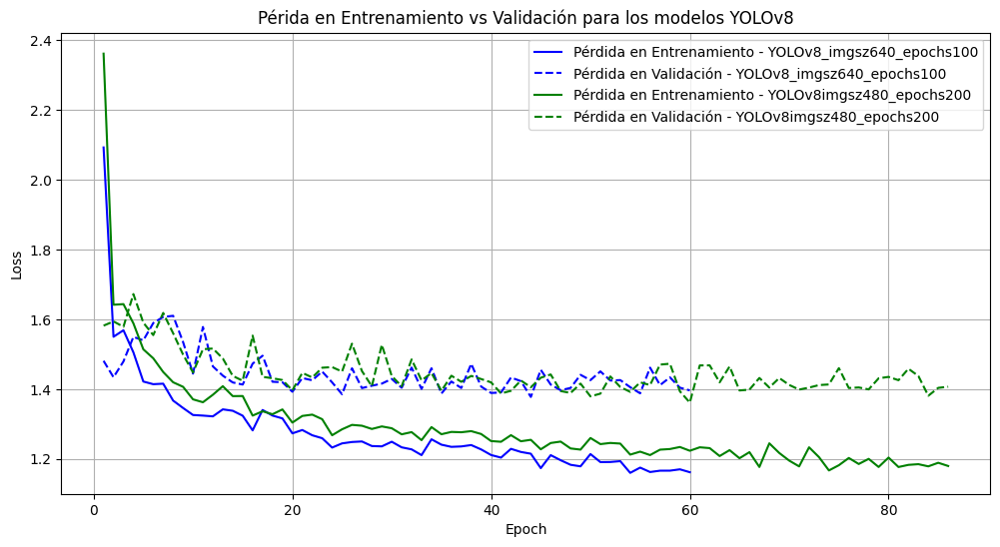

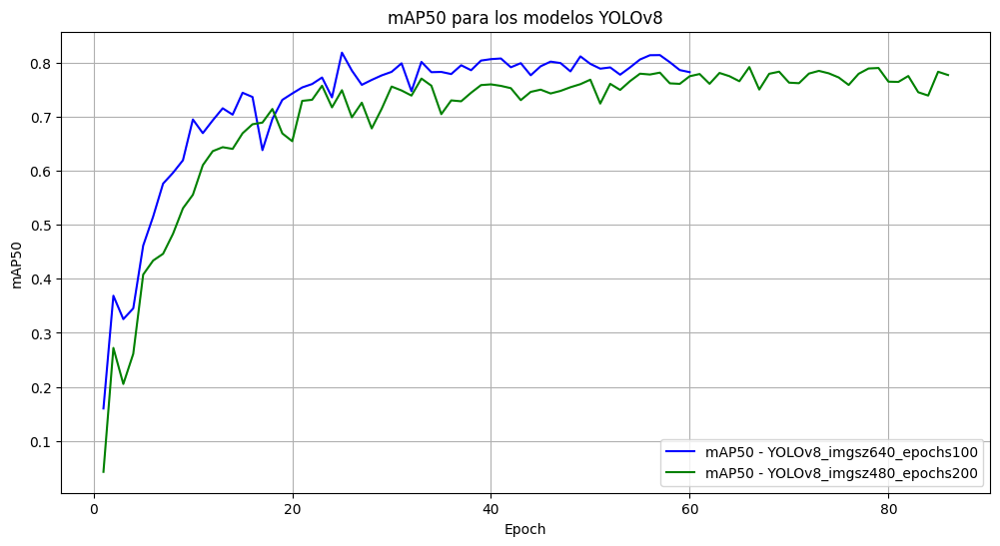

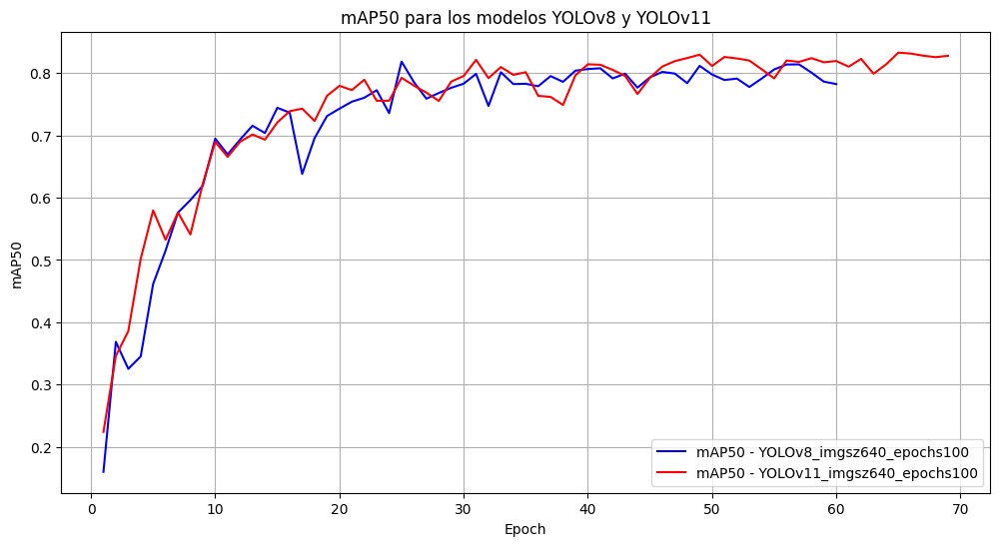

In [ ]:
# Se grafican los resultados de los modelos YOLOv8
ruta_resultados_csv_1 = os.path.join(RUTA_CARPETA_YOLOV8_PROYECTOS_TRAIN, f'{NOMBRE_MODELO_YOLO}_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}_r0', 'results.csv')
ruta_resultados_csv_2 = os.path.join(RUTA_CARPETA_YOLOV8_PROYECTOS_TRAIN, f'{NOMBRE_MODELO_YOLO}_imgsz{YOLO_IMG_SIZE_2}_epochs{YOLO_EPOCHS_2}_r0', 'results.csv')
ruta_resultados_v11_csv_1 = os.path.join(RUTA_CARPETA_YOLOV11_PROYECTOS_TRAIN, f'{NOMBRE_MODELO_YOLO}_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}_r0', 'results.csv')
resultados_df_1 = pd.read_csv(ruta_resultados_csv_1)
resultados_df_2 = pd.read_csv(ruta_resultados_csv_2)
resultados_df_v11_1 = pd.read_csv(ruta_resultados_v11_csv_1)

# Se grafican los resultados para las pérdidas en entrenamiento y validación
plt.figure(figsize=(12, 6))
plt.plot(resultados_df_1['epoch'], resultados_df_1['train/box_loss'], label=f'Pérdida en Entrenamiento - YOLOv8_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}', color='blue')
plt.plot(resultados_df_1['epoch'], resultados_df_1['val/box_loss'], label=f'Pérdida en Validación - YOLOv8_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}', linestyle='--', color='blue')
plt.plot(resultados_df_2['epoch'], resultados_df_2['train/box_loss'], label=f'Pérdida en Entrenamiento - YOLOv8imgsz{YOLO_IMG_SIZE_2}_epochs{YOLO_EPOCHS_2}', color='green')
plt.plot(resultados_df_2['epoch'], resultados_df_2['val/box_loss'], label=f'Pérdida en Validación - YOLOv8imgsz{YOLO_IMG_SIZE_2}_epochs{YOLO_EPOCHS_2}', linestyle='--', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Périda en Entrenamiento vs Validación para los modelos YOLOv8')
plt.legend()
plt.grid(True)
plt.show()

# Se grafican los resultados para el mAP50
plt.figure(figsize=(12, 6))
plt.plot(resultados_df_1['epoch'], resultados_df_1['metrics/mAP50(B)'], label=f'mAP50 - YOLOv8_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}', color='blue')
plt.plot(resultados_df_2['epoch'], resultados_df_2['metrics/mAP50(B)'], label=f'mAP50 - YOLOv8_imgsz{YOLO_IMG_SIZE_2}_epochs{YOLO_EPOCHS_2}', color='green')
plt.xlabel('Epoch')
plt.ylabel('mAP50')
plt.title('mAP50 para los modelos YOLOv8')
plt.legend()
plt.grid(True)
plt.show()

# Se grafinca una comparación de mAP50 para los modelos YOLOv8 y YOLOv11
plt.figure(figsize=(12, 6))
plt.plot(resultados_df_1['epoch'], resultados_df_1['metrics/mAP50(B)'], label=f'mAP50 - YOLOv8_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}', color='blue')
plt.plot(resultados_df_v11_1['epoch'], resultados_df_v11_1['metrics/mAP50(B)'], label=f'mAP50 - YOLOv11_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}', color='red')
plt.xlabel('Epoch')
plt.ylabel('mAP50')
plt.title('mAP50 para los modelos YOLOv8 y YOLOv11')
plt.legend()
plt.grid(True)
plt.show()


<em><p>

Se puede observar que una imagen de mayor tamaño ofrece mejores resultados en términos de mAP50. Sin embargo, esto trae un costo computacional mayor; por lo que depende del hardware del que se disponga.

En cuanto a la precisión del modelo v8 con el más reciente v11, no se nota mucha diferencia. Sin embargo, la mejora del modelo puede encontrarse en las versiones de mayor tamaño (y complejidad).

</p></em>

#### Inferencia

In [20]:
RUTA_CARPETA_YOLOV8_BEST_TRAINED = os.path.join(RUTA_CARPETA_YOLOV8_PROYECTOS_TRAIN, f'{NOMBRE_MODELO_YOLO}_imgsz{YOLO_IMG_SIZE_1}_epochs{YOLO_EPOCHS_1}_r0', 'weights', 'best.pt')
RUTA_CARPETA_YOLOV8_BASE = 'yolov8n.pt'

# Se cargan los mejores pesos del modelo entrenado
inf_model_yolo_v8 = YOLO(RUTA_CARPETA_YOLOV8_BEST_TRAINED)
inf_model_yolov8n = YOLO(RUTA_CARPETA_YOLOV8_BASE)

IMAGENES_PARA_INFERENCIA_PATH = os.path.join(RUTA_CARPETA_RESOURCES, 'imgs', 'inferencia')
RESULTADOS_INFERENCIA_PATH = os.path.join(IMAGENES_PARA_INFERENCIA_PATH, 'yolo_results')

# Se lanzan las inferencias
#set_imagenes = ['mvd_001.jpg']
results = inf_model_yolo_v8(IMAGENES_PARA_INFERENCIA_PATH, classes=[1], save=True, project=RESULTADOS_INFERENCIA_PATH, name='yolov8_retrained')
results_base = inf_model_yolov8n(IMAGENES_PARA_INFERENCIA_PATH, save=True, project=RESULTADOS_INFERENCIA_PATH, name='yolov8_base') # Clases por defecto

# Se procesan los resultados
for result in results:
    boxes = result.boxes  # Objeto Boxes para las salidas de detección
    masks = result.masks  #  Objet Mask para las salidas de segmentación
    keypoints = result.keypoints  # Objeto Keypoints para las salidas de posición
    probs = result.probs  # Objeto Probs para las salidas de clasificación
    obb = result.obb  # Objeto OBB (oriented bounding box)
    result.show() 
  


for result in results_base:
    boxes = result.boxes  # Objeto Boxes para las salidas de detección
    masks = result.masks  #  Objet Mask para las salidas de segmentación
    keypoints = result.keypoints  # Objeto Keypoints para las salidas de posición
    probs = result.probs  # Objeto Probs para las salidas de clasificación
    obb = result.obb  # Objeto OBB (oriented bounding box)
    result.show()


image 1/3 d:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\imgs\inferencia\inf_001.jpg: 544x640 40 Palms, 8.6ms
image 2/3 d:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\imgs\inferencia\inf_002.jpg: 416x640 32 Palms, 9.4ms
image 3/3 d:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\imgs\inferencia\inf_003.jpg: 480x640 39 Palms, 9.3ms
Speed: 3.2ms preprocess, 9.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
Results saved to resources\imgs\inferencia\yolo_results\yolov8_retrained

image 1/3 d:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\imgs\inferencia\inf_001.jpg: 544x640 (no detections), 8.2ms
image 2/3 d:\ProyectosUBA\CEIA\5_Vision_por_Computadora_II\repo_bruno\uba-ceia\ceia-vpc2\resources\imgs\inferencia\inf_002.jpg: 416x640 1 potted plant, 11.0ms
image 3/3 d:\ProyectosUBA\CEIA\5_Vision_por_Computadora

<em><p>

Para realizar una validación previa del modelo, se utilizan imágenes obtenidas de servicios satelitales que nunca fueron vistas por el mismo. Las imágenes bases son:

</p></em>

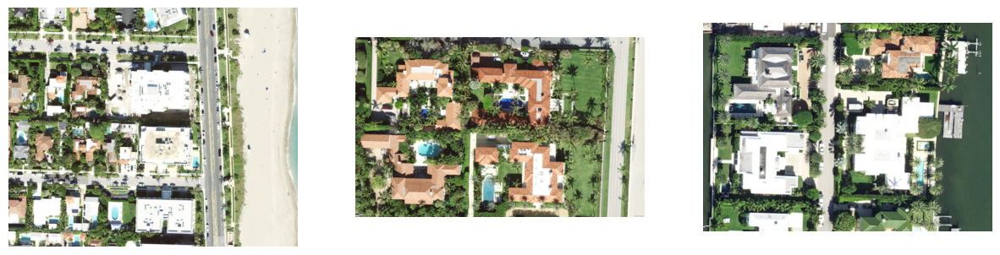

In [39]:
base_dir = os.path.join(RUTA_CARPETA_RESOURCES, 'imgs', 'inferencia')
img_base_list = [read_image(os.path.join(base_dir, img_path)) for img_path in os.listdir(base_dir) if img_path.endswith(FORMATOS_IMAGENES)]


show_images_in_line_from_tensors(img_base_list)

<em><p>

Predicciones del modelo YOLOv8 base (sin fine-tuning):

</p></em>

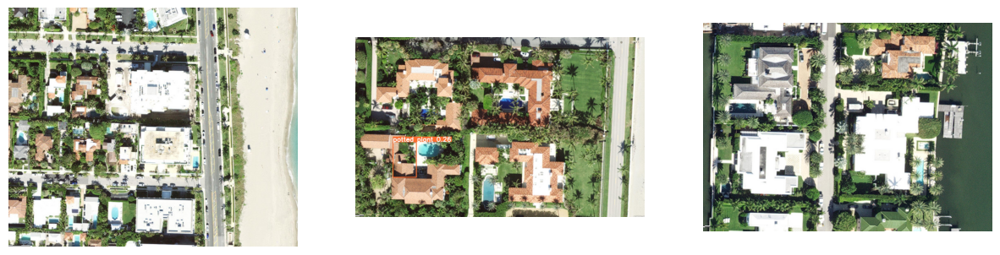

In [40]:
base_dir = os.path.join(RUTA_CARPETA_RESOURCES, 'imgs', 'inferencia', 'yolo_results', 'yolov8_base')
img_base_list = [read_image(os.path.join(base_dir, img_path)) for img_path in os.listdir(base_dir) if img_path.endswith(FORMATOS_IMAGENES)]

show_images_in_line_from_tensors(img_base_list)

<em><p>

Predicciones del modelo YOLOv8 con fine-tuning:

</p></em>

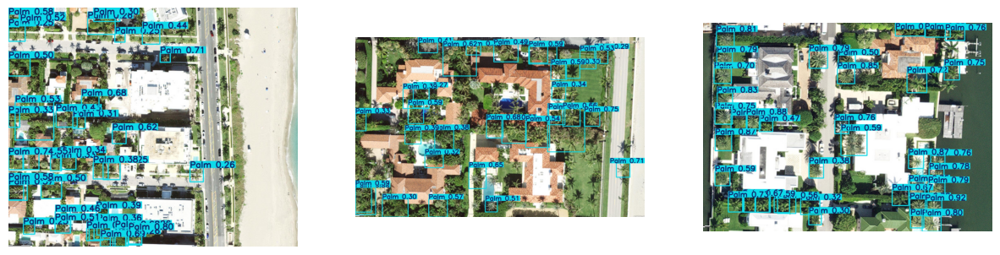

In [41]:
base_dir = os.path.join(RUTA_CARPETA_RESOURCES, 'imgs', 'inferencia', 'yolo_results', 'yolov8_retrained')
img_base_list = [read_image(os.path.join(base_dir, img_path)) for img_path in os.listdir(base_dir) if img_path.endswith(FORMATOS_IMAGENES)]

show_images_in_line_from_tensors(img_base_list)

## Conclusiones

⚠️ <em><font color='gold'>Problemas detectados:</font></em>
<em><font color='gold'><p>
- El tamaño de la imagen es un problema. Si se entrena con el tamaño muy grande, pueden haber problemas de memoria y el entrenamiento demora mucho. Se realizaron pruebas y la mayoría de las veces se tuvo este problema (Google Colab - Kaggle Notebooks). En cambio, si la imagen es muy chica al entrenar, baja la métrica de evaluación, dado que la red detecta menos caracteríasticas.
- Los tamaños de los modelos, en el caso de Faster R-CNN, llegaron a ser de 400Mb, lo que limita su operabilidad en el borde (dispositivos).
- La complejidad de entrenar un modelo full-pytorch es mucho mayor a la de utilizar modelos de frameworks como Yolo o MMDetection. Este tiempo hay que tener en consideración, si bien los modelos full-pytorch te da más versabilidad.
- Cuando se busca información sobre la métria mAP, si bien es muy utilizada, no hay una estandarización más allá de las utilidades de `pycocotools`, lo que resulta un problema para adaptarla a un código estandar.
- Cuando se realizó data-augmentation, no se tuvo buena efectividad utilizando `pytorch`, especialmente para las rotaciones y cambios de perspectivas, no se aplicaban correctamente a las bounding-boxes. Se tuvo una mejora con Albumentations, pero igualmente no quedaron perfectos. Un ejemplo de esto es la siguiente imagen:
</p></font></em>

<!-- Colab -->
<div align="center"><img src="https://drive.google.com/uc?export=1peH7WqXAKXNj9rH1Kk_nCTkPQlS2Hj3x" width="600" alt="Figura 5: Data-aumentation fallida."></div>

<!-- <div align="center"><img src="./resources/imgs/output.png" width="600" alt="Figura 5: Data-aumentation fallida."></div> -->

<div align="center"><small><em>Figura 5: Data-aumentation fallida.</em></small></div>

⭐ <em><strong>Conclusión</strong></em> ⭐

<em><strong><p>
    
Como conclusiones, se pudo observar que el tamaño de la imagen es claramente un hiperparámetro que está limitado por los recursos.
    
También la rigidez de los modelos pre-entrenados, así como su facilidad para utilizarlos out-of-the-box. En este sentido, se valora mucho frameworks como el de utltralitycs que es muy fácil su implementación en un dataset propio.
    
Otro punto importante es el consumo de memoria de estos modelos, en donde es importante, para casos de producción, estudiar una estrategia de entrenamiento distribuído, y también hacer las aumentaciones offline, dado que el modelo sin aumentaciones demoró mucho menos su entrenamiento.

Como conclusión final, se observa que hay varias matices que resolver, pero sin duda, estos enfoques sirven para aplicaciones en producción, destacando modelos como YOLO, debido a su alta performance y principalmente fácil implementación.
    
</p></strong></em>

💫 <em><font color='MediumPurple'> Mejoras posibles: </font></em>
<em><font color='MediumPurple'><p>
- Optimizar el entrenamiento y validación.
- Probar la exportación del modelo utilizando `torchscript` o `onnx` para ver su tamaño.
- Mejorar el etiquetado de los datos. Había casos en donde el etiquetado no contemplaba las buenas practicas del proceso.
- Investigar más FiftyOne y su interacción con otras librerías de etiquetado, como CVAT.
- Las imágenes actuales, se hacen un Rezise. Lo correcto sería, luego de procesarla (bboxes), hacer un rezise al tamaño original. Por ejemplo, tener una transformación para el caso de predicción, y aplicarla solo en dicho caso `prediction=True`
- Investigar más el manejo de memora en GPU de pytorch.
- Investigar más el tema de la métrica mAP, especialmente la implementación de "torch lighting".
- Investigar más la detección específica utilizando imágenes grandes (SAHI -es para objetos pequeños, pero en una imagen grande muy grande, los objetos se vuelven pequeños).
- La red de Faster R-CNN, tiene un componente de clasificación, llamado "backbone". Actualmente se está utilizando ResNet con una versión mejorada de sus pesos, sin embargo, queda abierta la posibilidad de probar otros "backbones" que sean el estado del arte actual (ej: efficientNet).
- Investigar el problema de transformaciones espaciales en este conjunto, no funcionó ni con Albumentations ni con Pytorch.
</p></font></em>

## Referencias

- Adel Ammar, and Anis Koubaa. (2023). Aerial images of palm trees [Data set]. Kaggle. https://doi.org/10.34740/KAGGLE/DSV/6382990
- TorchVision Object Detection Finetuning Tutorial — PyTorch Tutorials 2.4.0+cu121 documentation. (n.d.). https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html

## Anexo

*Si hay problemas de GPU, probar con las siguientes soluciones:*

```python
!pip install GPUtil

import torch
from GPUtil import showUtilization as gpu_usage
from numba import cuda

def free_gpu_cache():
    print("Initial GPU Usage")
    gpu_usage()                             

    torch.cuda.empty_cache()

    cuda.select_device(0)
    cuda.close()
    cuda.select_device(0)

    print("GPU Usage after emptying the cache")
    gpu_usage()

free_gpu_cache() 
```

```python
import gc def report_gpu(): print(torch.cuda.list_gpu_processes()) gc.collect() torch.cuda.empty_cache()
```

```python
# En el entrenamiento:
def train_loop(files, batch_size, model):
    size = len(files)
    for batch in range(size//batch_size):
        im_paths = files[batch*batch_size : (batch+1)*batch_size]
        X,y = load_batch(im_paths)
        # Compute prediction and loss
        output = model(X, y)
        del X
        del y
        gc.collect()
        torch.cuda.empty_cache()
```

```python
# Chequear donde está el modelo
next(model.parameters()).device

# Chequear donde está un tensor
tensor.device
```